In [1]:
import time

import pandas
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from pandas import datetime
from pandas import set_option
from pandas.plotting import scatter_matrix


from math import sqrt
from matplotlib import pyplot




from termcolor import colored

import numpy
from numpy import arange
from numpy import array
from numpy import mean
from numpy import std



from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler


import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.optimizers import SGD
from keras import backend
from keras import metrics
from keras.layers import Flatten
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D




/Users/jorgeandrespenaaraya/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
/Users/jorgeandrespenaaraya/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


In [2]:
# load dataset
# fix random seed for reproducibility
numpy.random.seed(7)
pyplot.style.use('ggplot')
startModMLP=time.time()
series = read_csv('Kilos3.csv',usecols=["Fecha","Chocolate","Polvo","Wet"],header=0, parse_dates=True, index_col=0, squeeze=True)

print(series)
print(type(series))
print(series.head())
print(series.size)
print(series.shape)
print(series.dtypes)

             Polvo  Chocolate     Wet
Fecha                                
2013-01-01  357206     199458  142229
2013-02-01  379606     101743  134766
2013-03-01  437926     106850  178964
2013-04-01  547451     167408  213696
2013-05-01  471201     160161  197745
2013-06-01  426460      87329  168173
2013-07-01  541518     131107  195587
2013-08-01  535878     113313  229746
2013-09-01  587693     133174  219395
2013-10-01  602911     167417  218574
2013-11-01  676015     152794  214633
2013-12-01  663522     115866  227918
2014-01-01  324465     139654   96097
2014-02-01  321156     123985  126382
2014-03-01  490802      96887  234318
2014-04-01  650536     173770  261013
2014-05-01  488441     130652  156348
2014-06-01  523407     101355  181870
2014-07-01  460699     135187  202833
2014-08-01  454203     113342  162798
2014-09-01  538650      86778  147308
2014-10-01  651868     128922  192296
2014-11-01  664647     131714  197188
2014-12-01  697420     125053  154176
2015-01-01  

In [3]:

series=series.Polvo+series.Wet+series.Chocolate
print(series)

Fecha
2013-01-01     698893
2013-02-01     616115
2013-03-01     723740
2013-04-01     928555
2013-05-01     829107
2013-06-01     681962
2013-07-01     868212
2013-08-01     878937
2013-09-01     940262
2013-10-01     988902
2013-11-01    1043442
2013-12-01    1007306
2014-01-01     560216
2014-02-01     571523
2014-03-01     822007
2014-04-01    1085319
2014-05-01     775441
2014-06-01     806632
2014-07-01     798719
2014-08-01     730343
2014-09-01     772736
2014-10-01     973086
2014-11-01     993549
2014-12-01     976649
2015-01-01     815847
2015-02-01     636151
2015-03-01    1005525
2015-04-01    1191427
2015-05-01     852940
2015-06-01     812412
               ...   
2016-03-01    1044203
2016-04-01    1032775
2016-05-01     799366
2016-06-01     938546
2016-07-01    1000779
2016-08-01    1070015
2016-09-01     964550
2016-10-01    1004951
2016-11-01    1169672
2016-12-01    1068676
2017-01-01     759966
2017-02-01     871068
2017-03-01    1092041
2017-04-01     971491
2017

# Plot Data

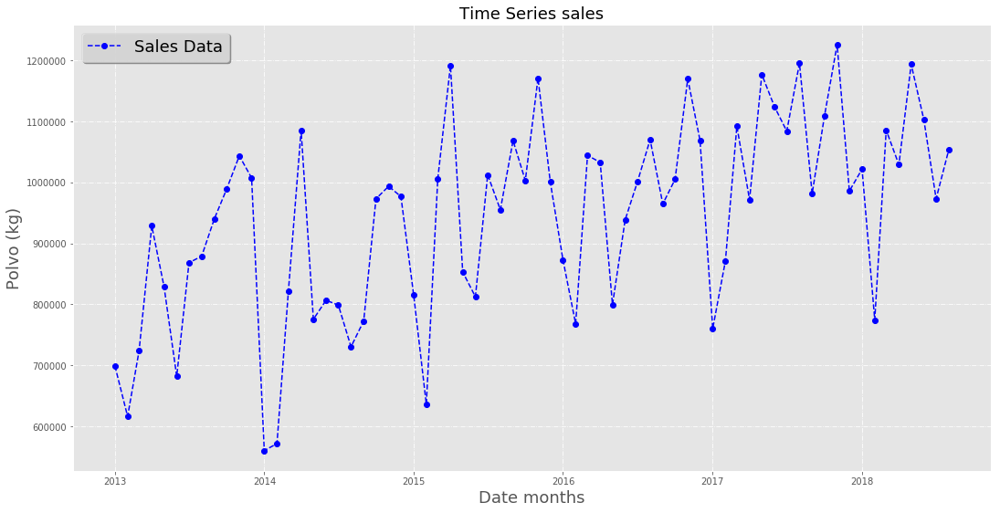

In [4]:
numpy.random.seed(7)
# create a line plot
from pandas import read_csv
from matplotlib import pyplot
from math import sqrt
import matplotlib
import numpy

# Grafica
pyplot.figure(figsize = (18,9))
pyplot.plot(series,'o--',c='b', label='Sales Data')
pyplot.xlabel('Date months',fontsize=18)
pyplot.ylabel('Polvo (kg)',fontsize=18)
pyplot.title('Time Series sales',fontsize=18)
pyplot.grid(True,linestyle='-.')
leg=pyplot.legend(loc="best",fontsize=18, shadow=True, fancybox=True)
leg.get_frame().set_alpha(0.8)
pyplot.show()
#pyplot.savefig('MLP, lag %d and %d Neurons.png'%(j,n))
            

In [5]:
# fit scaler
numpy.random.seed(7)
valores=series.values
valores=valores.astype('float32')
valores=valores.reshape(len(valores),1)

scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(valores)
scaled_values = scaled.reshape(len(scaled), 1)

#print(scaled_values)
#print(scaled_values.shape)

# MLP Model


 LAG: 12
(44, 2)

 repeticion: 1
Grafica Entrenamiento


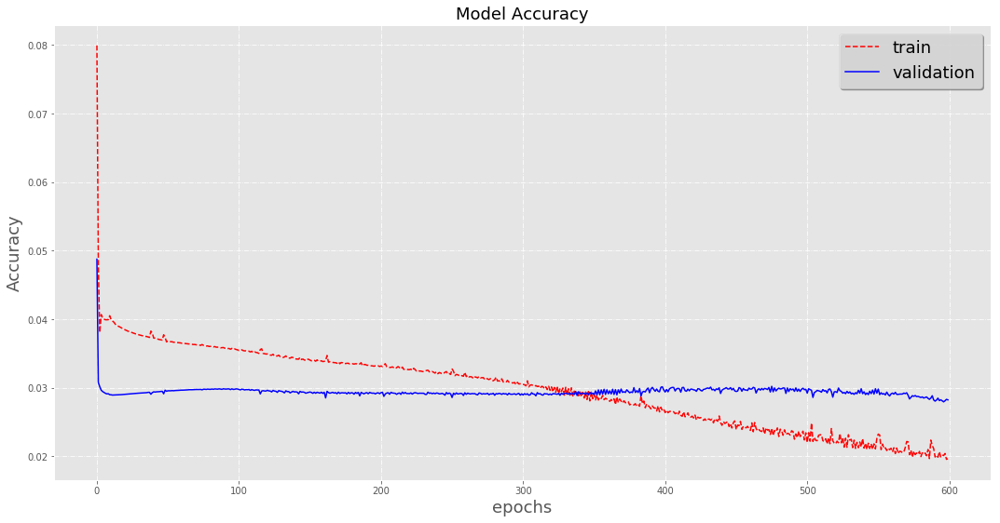

Grafica Modelo


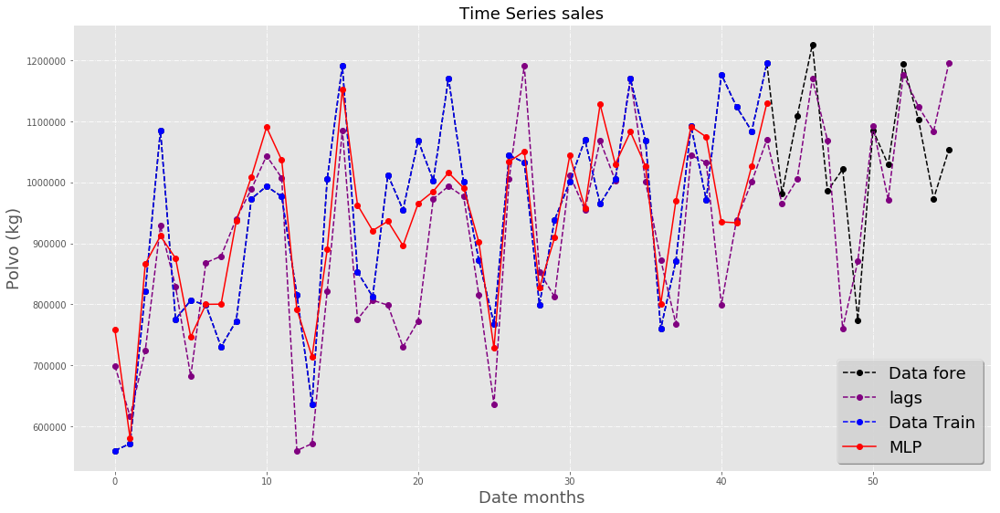

Errores del modelo
Train RMSE: 95340.94 RMSE
Train MAPE: 8.26 MAPE
Train sMAPE: 0.08 sMAPE
Errores promedio
   Lag  Neuronas        RMSE      MAPE     SMAPE
0   12       200  95340.9375  8.258995  0.081496
    Lag  Neuronas  Predicciones      Objetivo
0    12       200  7.581261e+05  5.602160e+05
1    12       200  5.802275e+05  5.715230e+05
2    12       200  8.659740e+05  8.220070e+05
3    12       200  9.120823e+05  1.085319e+06
4    12       200  8.754652e+05  7.754410e+05
5    12       200  7.465553e+05  8.066320e+05
6    12       200  7.999924e+05  7.987190e+05
7    12       200  8.002756e+05  7.303430e+05
8    12       200  9.362540e+05  7.727360e+05
9    12       200  1.008978e+06  9.730860e+05
10   12       200  1.090379e+06  9.935490e+05
11   12       200  1.036450e+06  9.766491e+05
12   12       200  7.916702e+05  8.158469e+05
13   12       200  7.140998e+05  6.361510e+05
14   12       200  8.898120e+05  1.005525e+06
15   12       200  1.152909e+06  1.191427e+06
16   12     

In [6]:


seed=7
numpy.random.seed(seed)


ErrorModMLP = DataFrame()
ErrorProm=DataFrame()
Lags,Rmse,Mape,Smape =list(), list(), list(),list()

datosModelMLP=DataFrame()
Predicciones=list()
Objetivo=list()
valorlag=list()

Rmse_m=list()
Rmse_std=list()
Mape_m=list()
Mape_std=list()
Smape_m=list()
Smape_std=list()
Lags2=list()
neu=list()
net2=list()
data_dim=1
timesteps=1
features=1

lag=[11]
h=12


for l in(lag):
    print(colored("\n LAG: %d"% (l+1),'red'))
    temps = DataFrame(scaled_values[:-h])
    temps=temps.astype('float32')

    dataframe = concat([temps.shift(l+1), temps], axis=1) 
    dataframe.columns = ['t+%d'%(l+1), 't'] 
    dataframe.dropna(inplace=True)

    train= dataframe.values
    #print(train)
    print(train.shape)

    X, y = train[:,0:1], train[:,1]
    X = X.reshape(X.shape[0],X.shape[1])
    y = y.reshape(y.shape[0],X.shape[1])

    neurons=200
    n_epochs=600
    n_batch =1

    sgd = SGD(lr=0.01, momentum=0.99,decay = 0, nesterov=False)
    
    def smape(y_true, y_pred): 
        smape=(2/len(y_true))*numpy.sum(numpy.abs(y_true - y_pred) /(numpy.abs(y_true)+numpy.abs(y_pred)))
        return smape

    def mase(y_true, y_pred): 
        mase=1/h*(numpy.sum(numpy.abs(y_true - y_pred)) /((1/(len(y)-f))* numpy.sum(numpy.abs(y[f+1:]-y))))
        return mase
    
    def rmse(y_true, y_pred):
        return numpy.sqrt(numpy.mean(numpy.square(y_pred - y_true)))

    def mape(y_true, y_pred):
        return numpy.mean(numpy.abs((y_true - y_pred) / y_true)) * 100
    

    # collect data across multiple repeats

    for i in range(1):

        early_stops=keras.callbacks.EarlyStopping(monitor='mean_squared_error', 
                                                  min_delta=0.001, 
                                                  patience=100, 
                                                  verbose=0, 
                                                  mode='min', 
                                                  baseline=None)
        print (colored("\n repeticion: %d"% (i+1),'blue'))
        
        
                    # define model
        def fit_MLP(X,y,Neuronas):
                
            modelMLP = Sequential()
            modelMLP.add(Dense(Neuronas,
                                input_dim=(X.shape[1]),
                                activation='relu'))
            #modelMLP.add(Dropout(0.5))
            modelMLP.add(Dense(Neuronas,
                               activation='relu'))
            #modelMLP.add(Dropout(0.5))
            modelMLP.add(Dense(1))

            modelMLP.compile(loss='mean_squared_error',
                                optimizer='adam',
                                metrics=['mean_squared_error'])


            #print(modelMLP.summary())

            #for n in range(n_epochs):
            history= modelMLP.fit(X, y, epochs=n_epochs,
                                    batch_size=n_batch, 
                                    verbose=0, 
                                    shuffle=False,
                                    callbacks=[early_stops],
                                    validation_split=0.3)


            modelMLP.reset_states()
                
            print('Grafica Entrenamiento')
            #print(history.history.keys())
            pyplot.figure(figsize = (18,9))
            pyplot.plot(history.history['mean_squared_error'],'r--', label='train')
            pyplot.plot(history.history['val_mean_squared_error'],'b-', label='validation')
            pyplot.xlabel('epochs',fontsize=18)
            pyplot.ylabel('Accuracy',fontsize=18)
            pyplot.title('Model Accuracy',fontsize=18)
            pyplot.grid(True,linestyle='-.')
            leg=pyplot.legend(loc="best",fontsize=18, shadow=True, fancybox=True)
            leg.get_frame().set_alpha(0.8)
            pyplot.show()
                
            return modelMLP
            
        Modelo_MLP=fit_MLP(X,y,neurons)
        
        predictions_MLP = Modelo_MLP.predict(X)
        predictions_MLP = predictions_MLP.reshape(predictions_MLP.shape[0], 1)

        # invert predictions
        model_MLP = scaler.inverse_transform(predictions_MLP)

        trainY = scaler.inverse_transform(y)
        
        
        print('Grafica Modelo')

        # Grafica
        pyplot.figure(figsize = (18,9))
        pyplot.plot(series.values[(l+1):],'o--',c='black', label='Data fore')
        pyplot.plot(series.values[:-(l+1)],'o--',c='purple', label='lags')
        pyplot.plot(trainY,'o--',c='b', label='Data Train')
        pyplot.plot(model_MLP,'o-',c='r', label='MLP')
        pyplot.xlabel('Date months',fontsize=18)
        pyplot.ylabel('Polvo (kg)',fontsize=18)
        pyplot.title('Time Series sales',fontsize=18)
        pyplot.grid(True,linestyle='-.')
        leg=pyplot.legend(loc="best",fontsize=18, shadow=True, fancybox=True)
        leg.get_frame().set_alpha(0.8)
        pyplot.show()
    

        
        print('Errores del modelo')
        # calculate root mean squared error
        trainScore = rmse(trainY[:,0], model_MLP[:,0])
        print('Train RMSE: %.2f RMSE' % (trainScore))

        trainMAPE = mape(trainY[:,0], model_MLP[:,0])
        print('Train MAPE: %.2f MAPE' % (trainMAPE))

        trainsMAPE = smape(trainY[:,0], model_MLP[:,0])
        print('Train sMAPE: %.2f sMAPE' % (trainsMAPE))
        
     
        for _ in range(len(model_MLP)):
            Predicciones.append(model_MLP[_])
            Objetivo.append(trainY[_])
            lov =len(model_MLP)*[(l+1)]
            valorlag.append(lov[0])
            net =len(model_MLP)*[neurons]
            net2.append(net[0])
            #valorlag.append(l+1)
            #print(datosModelMLP)

        Rmse.append(trainScore)
        Mape.append(trainMAPE)
        Smape.append(trainsMAPE)
        Lags.append(l+1)
        
        #mase.append()

    
    Rmse_m.append(mean(Rmse)), Rmse_std.append(std(Rmse)) 
    Mape_m.append(mean(Mape)), Mape_std.append(std(Mape))
    Smape_m.append(mean(Smape)), Smape_std.append(std(Smape))
    Lags2.append(l+1)
    neu.append(neurons)
    Lags,Rmse,Mape,Smape =list(), list(), list(),list()
print (colored('Errores promedio','blue'))
ErrorModMLP['Lag'],ErrorModMLP['Neuronas'],ErrorModMLP['RMSE'], ErrorModMLP['MAPE'],ErrorModMLP['SMAPE'] =Lags2,neu,Rmse_m,Mape_m,Smape_m
#ErrorModMLP['SMAPE'] =ErrorModMLP['SMAPE']*100
print(ErrorModMLP)

datosModelMLP['Lag'],datosModelMLP['Neuronas'],datosModelMLP['Predicciones'],datosModelMLP['Objetivo'] =valorlag,net2,Predicciones,Objetivo

datosModelMLP['Predicciones'] = datosModelMLP['Predicciones'].str[0].astype(float)
datosModelMLP['Objetivo'] = datosModelMLP['Objetivo'].str[0].astype(float)

print(datosModelMLP)
        

    
    

# Mejor Modelo (mejor Lag)

In [7]:
BestModelMLP=DataFrame()


Maximo_error_lag=ErrorModMLP.loc[ErrorModMLP['MAPE'].idxmax()]
Minimo_error_lag=ErrorModMLP.loc[ErrorModMLP['MAPE'].idxmin()]

print (colored('Maximo Error Mape','red'))
print (colored(Maximo_error_lag,'red'))

print (colored('Minimo Error Mape','green'))
print (colored(Minimo_error_lag,'green'))

BestModelMLP['MinimoError'],BestModelMLP['MaximoError']=Minimo_error_lag,Maximo_error_lag

Maximo Error Mape
Lag            12.000000
Neuronas      200.000000
RMSE        95340.937500
MAPE            8.258995
SMAPE           0.081496
Name: 0, dtype: float64
Minimo Error Mape
Lag            12.000000
Neuronas      200.000000
RMSE        95340.937500
MAPE            8.258995
SMAPE           0.081496
Name: 0, dtype: float64


In [8]:
minLag=int(Minimo_error_lag.Lag)
print(minLag)

BestNeu=int(Minimo_error_lag.Neuronas)

print(BestNeu)


endModMLP=time.time()
TimeModMLP=startModMLP-endModMLP
print (TimeModMLP)
BestModelMLP['Tiempo']=TimeModMLP
print(BestModelMLP)

12
200
-22.907480001449585
           MinimoError   MaximoError    Tiempo
Lag          12.000000     12.000000 -22.90748
Neuronas    200.000000    200.000000 -22.90748
RMSE      95340.937500  95340.937500 -22.90748
MAPE          8.258995      8.258995 -22.90748
SMAPE         0.081496      0.081496 -22.90748


In [9]:
MejorModeloMLP=datosModelMLP.loc[datosModelMLP['Lag']==minLag]

MejorModeloMLP=MejorModeloMLP.loc[MejorModeloMLP['Neuronas']==BestNeu]
print(MejorModeloMLP)

    Lag  Neuronas  Predicciones      Objetivo
0    12       200  7.581261e+05  5.602160e+05
1    12       200  5.802275e+05  5.715230e+05
2    12       200  8.659740e+05  8.220070e+05
3    12       200  9.120823e+05  1.085319e+06
4    12       200  8.754652e+05  7.754410e+05
5    12       200  7.465553e+05  8.066320e+05
6    12       200  7.999924e+05  7.987190e+05
7    12       200  8.002756e+05  7.303430e+05
8    12       200  9.362540e+05  7.727360e+05
9    12       200  1.008978e+06  9.730860e+05
10   12       200  1.090379e+06  9.935490e+05
11   12       200  1.036450e+06  9.766491e+05
12   12       200  7.916702e+05  8.158469e+05
13   12       200  7.140998e+05  6.361510e+05
14   12       200  8.898120e+05  1.005525e+06
15   12       200  1.152909e+06  1.191427e+06
16   12       200  9.628996e+05  8.529401e+05
17   12       200  9.208799e+05  8.124120e+05
18   12       200  9.362569e+05  1.012328e+06
19   12       200  8.962752e+05  9.549889e+05
20   12       200  9.653842e+05  1

# Pronosticos MLP


 Mejor LAG: 12
(44, 2)

 Repeticion: 1

 mes: 1
Grafica Entrenamiento


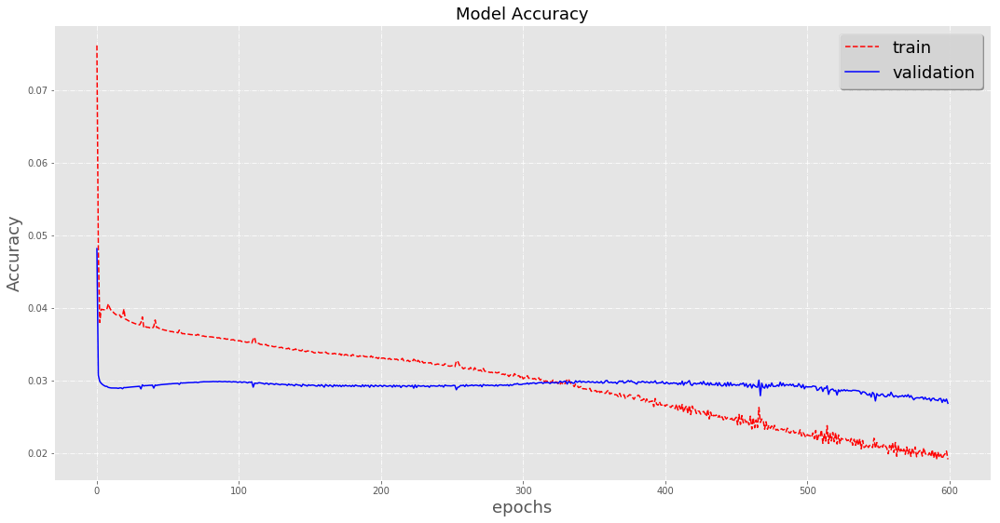


 Prediccion mes 1: 1126995

 mes: 2
Grafica Entrenamiento


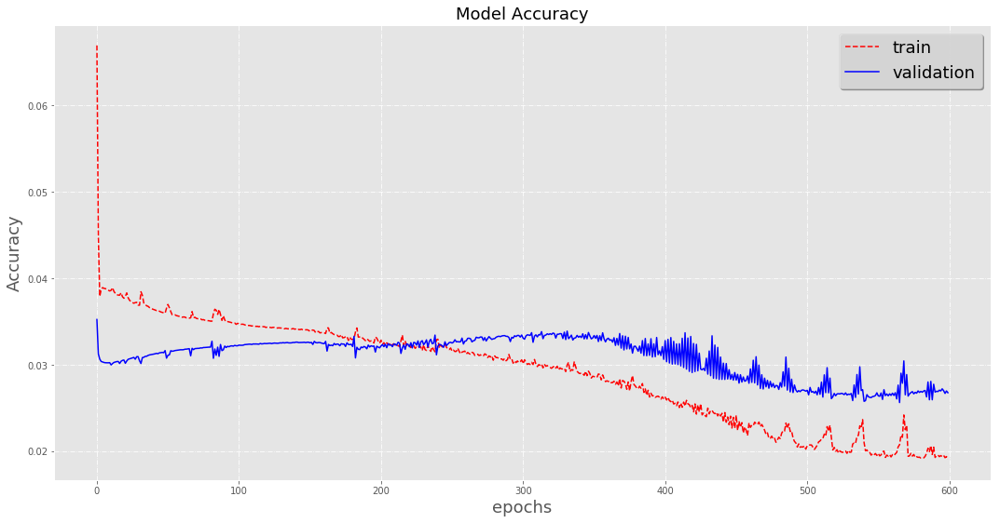


 Prediccion mes 2: 995886

 mes: 3
Grafica Entrenamiento


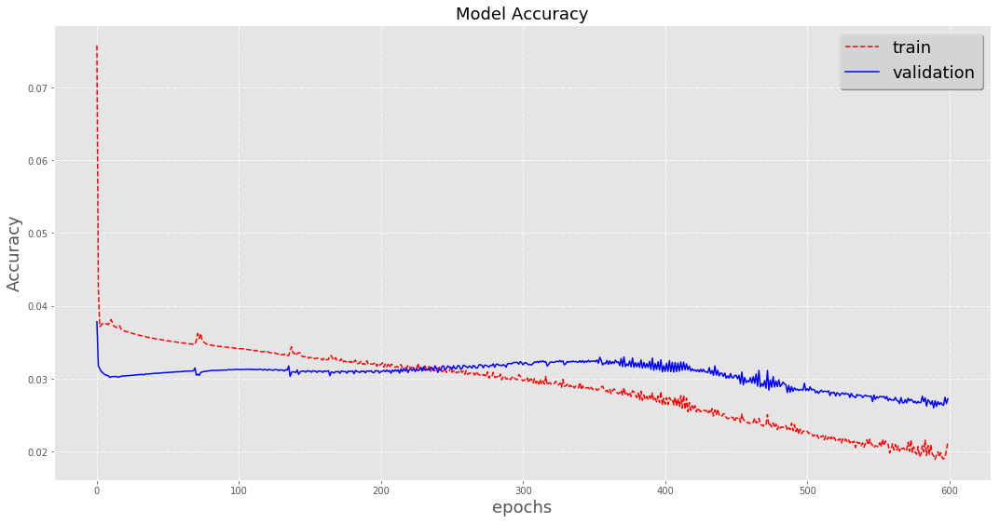


 Prediccion mes 3: 1027393

 mes: 4
Grafica Entrenamiento


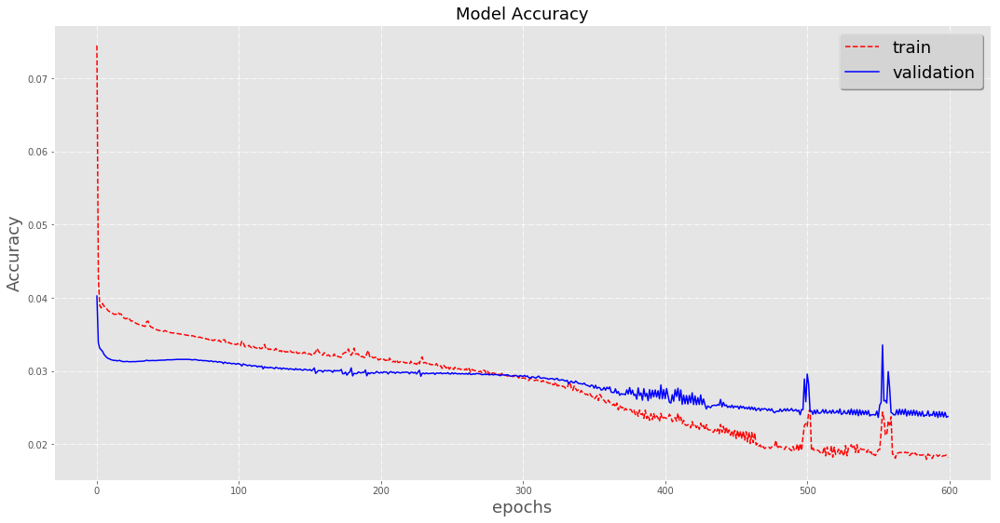


 Prediccion mes 4: 1076547

 mes: 5
Grafica Entrenamiento


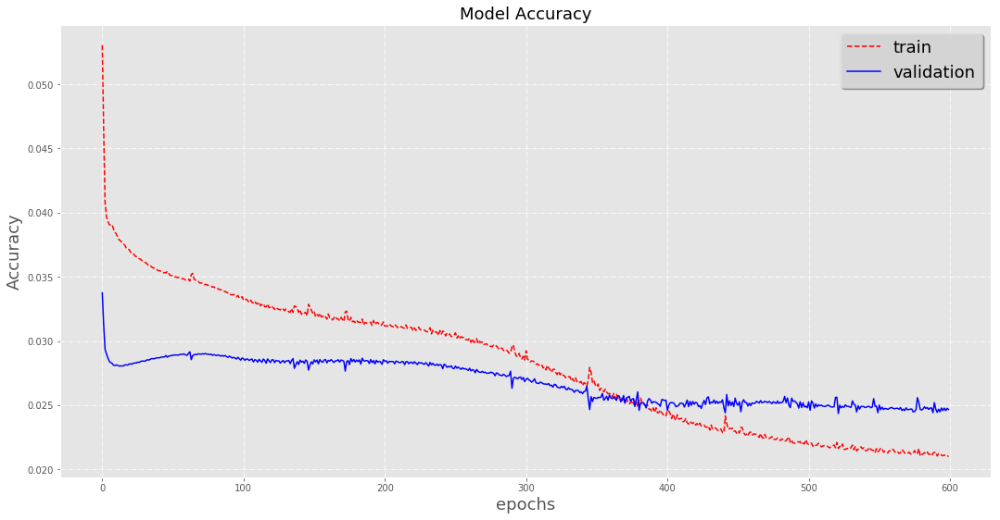


 Prediccion mes 5: 1083547

 mes: 6
Grafica Entrenamiento


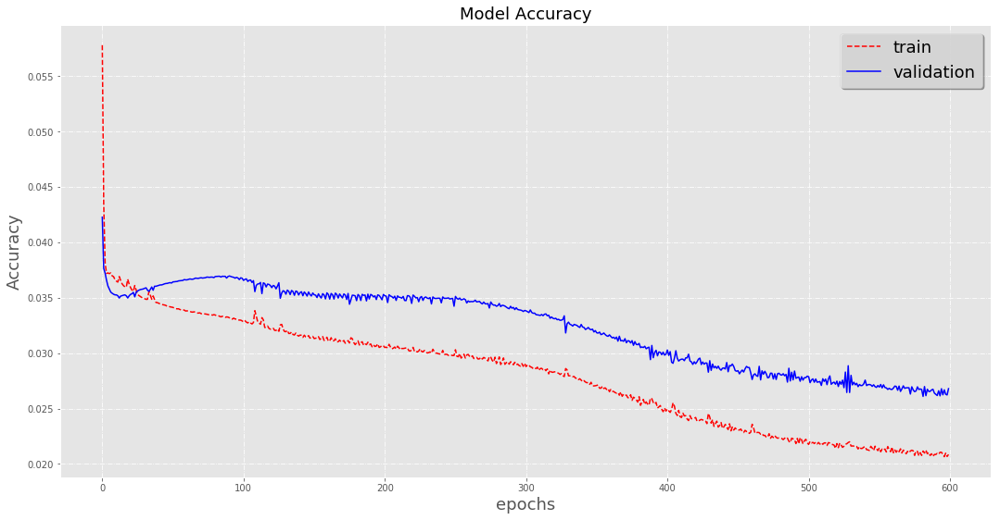


 Prediccion mes 6: 988073

 mes: 7
Grafica Entrenamiento


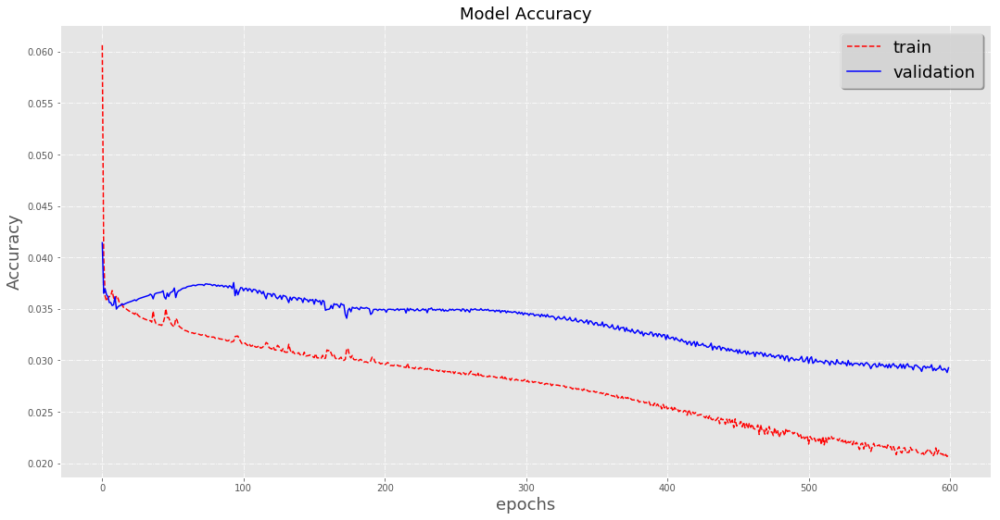


 Prediccion mes 7: 843909

 mes: 8
Grafica Entrenamiento


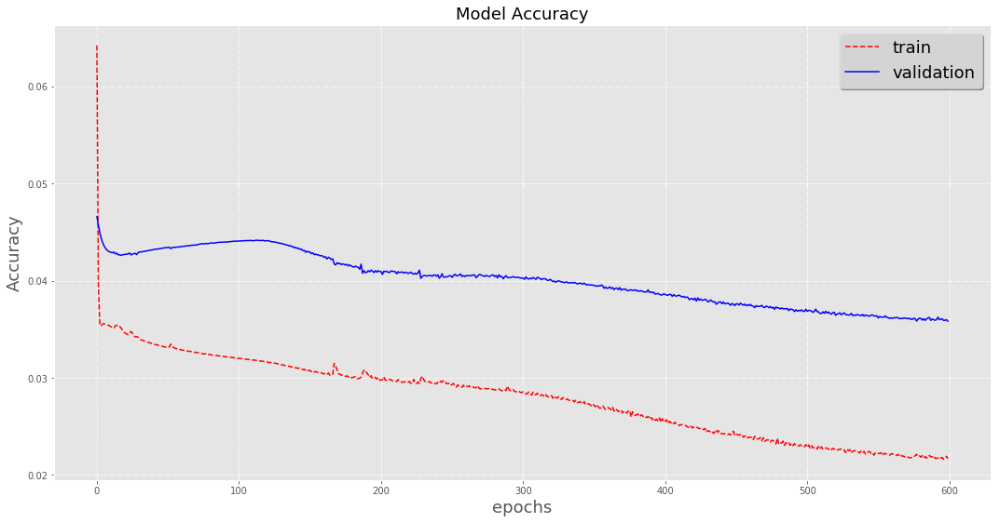


 Prediccion mes 8: 1072613

 mes: 9
Grafica Entrenamiento


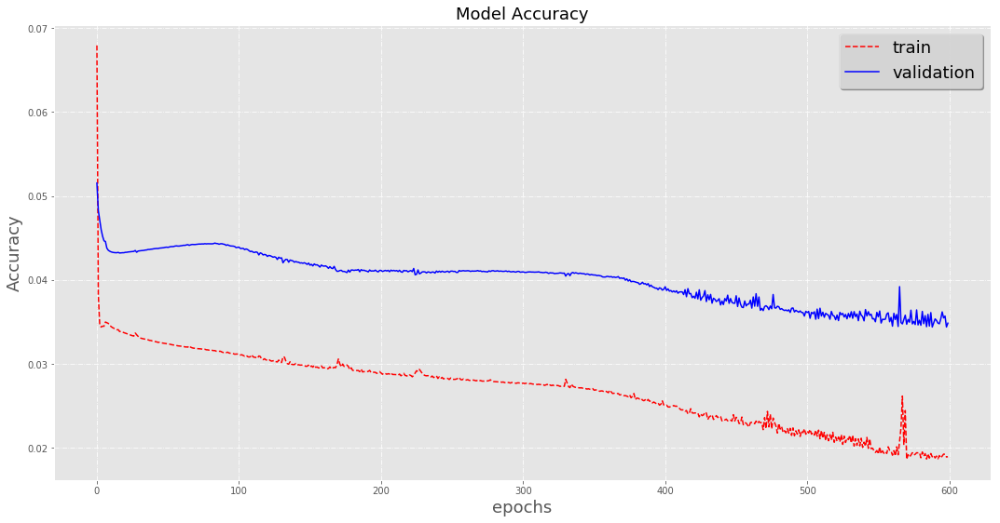


 Prediccion mes 9: 1011272

 mes: 10
Grafica Entrenamiento


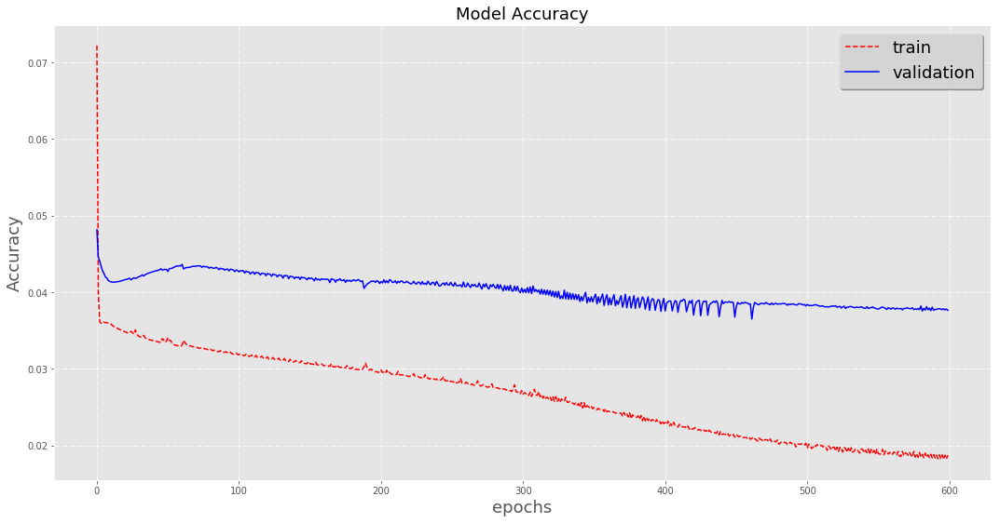


 Prediccion mes 10: 1103887

 mes: 11
Grafica Entrenamiento


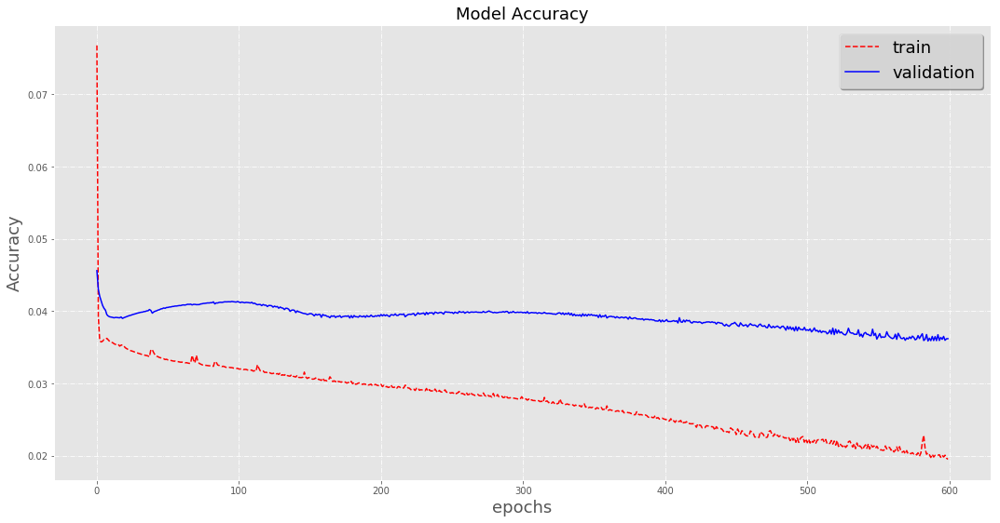


 Prediccion mes 11: 1095914

 mes: 12
Grafica Entrenamiento


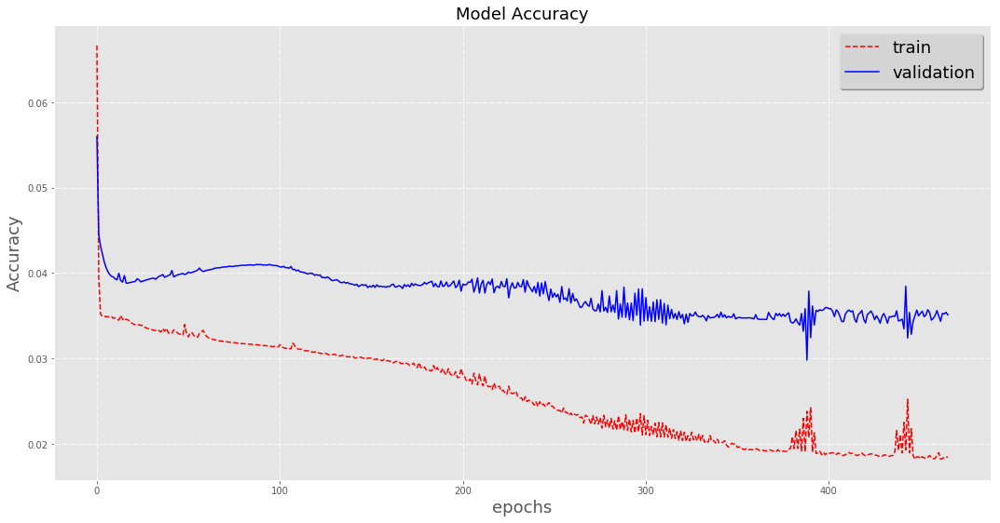


 Prediccion mes 12: 1069926

 Rmse:
[133806.3579059676]

 Mape:
[10.191203506277462]

 Smape:
[1.2005559072781014]

 Repeticion: 2

 mes: 1
Grafica Entrenamiento


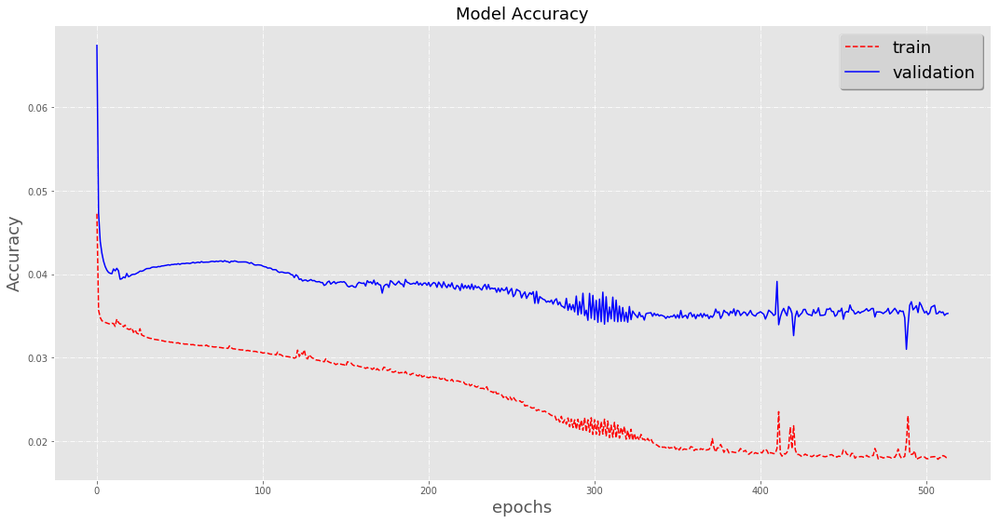


 Prediccion mes 1: 1107982

 mes: 2
Grafica Entrenamiento


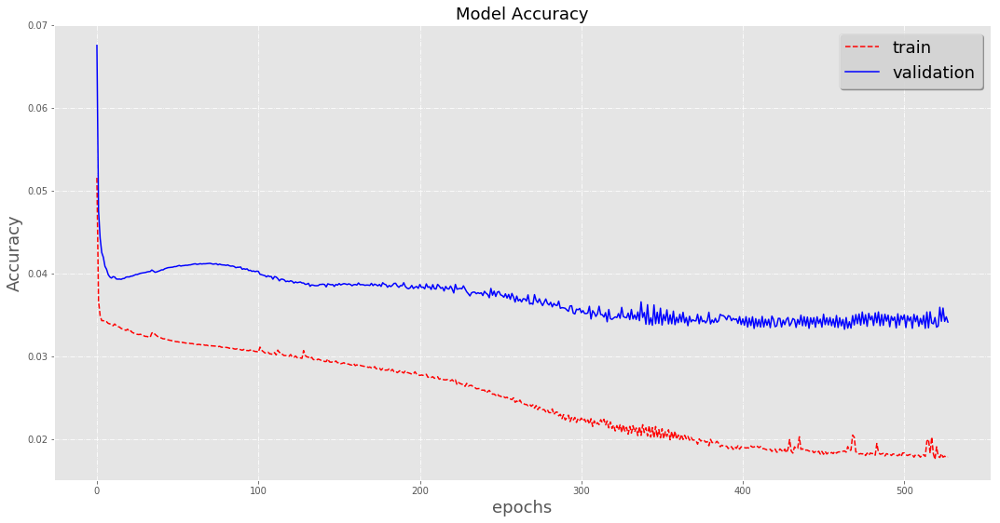


 Prediccion mes 2: 1008037

 mes: 3
Grafica Entrenamiento


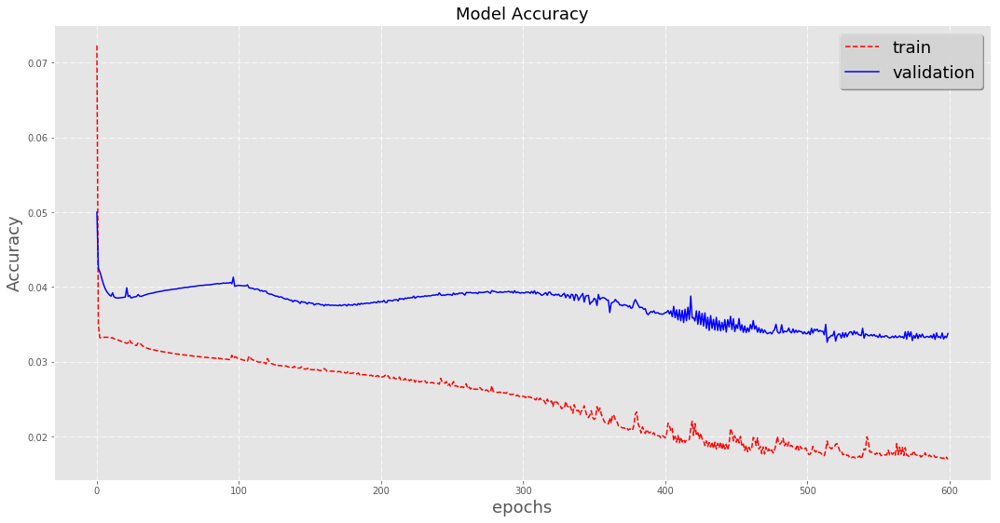


 Prediccion mes 3: 1033927

 mes: 4
Grafica Entrenamiento


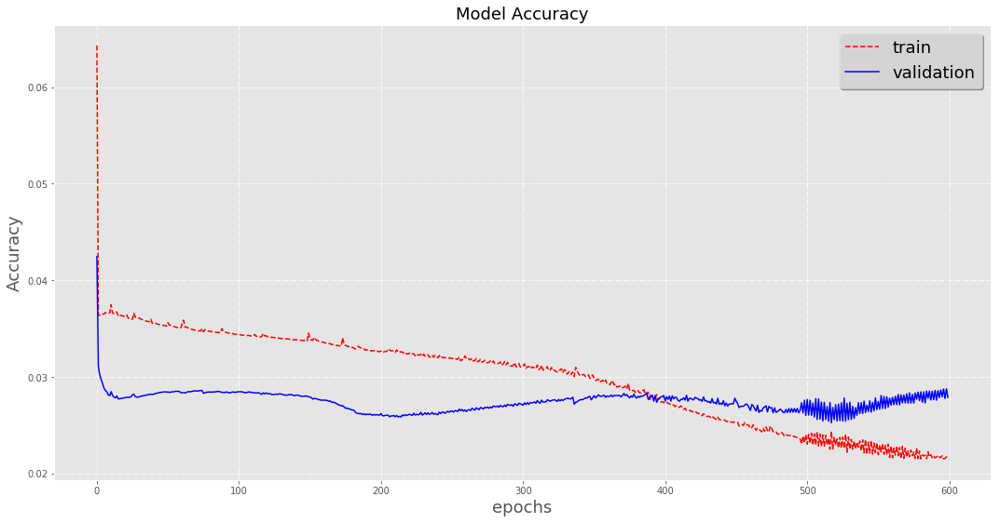


 Prediccion mes 4: 1112351

 mes: 5
Grafica Entrenamiento


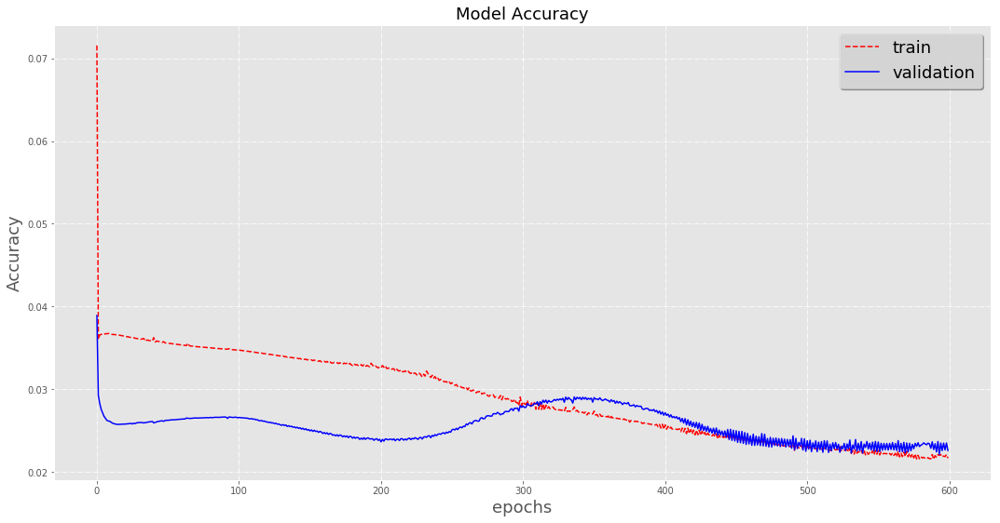


 Prediccion mes 5: 1061523

 mes: 6
Grafica Entrenamiento


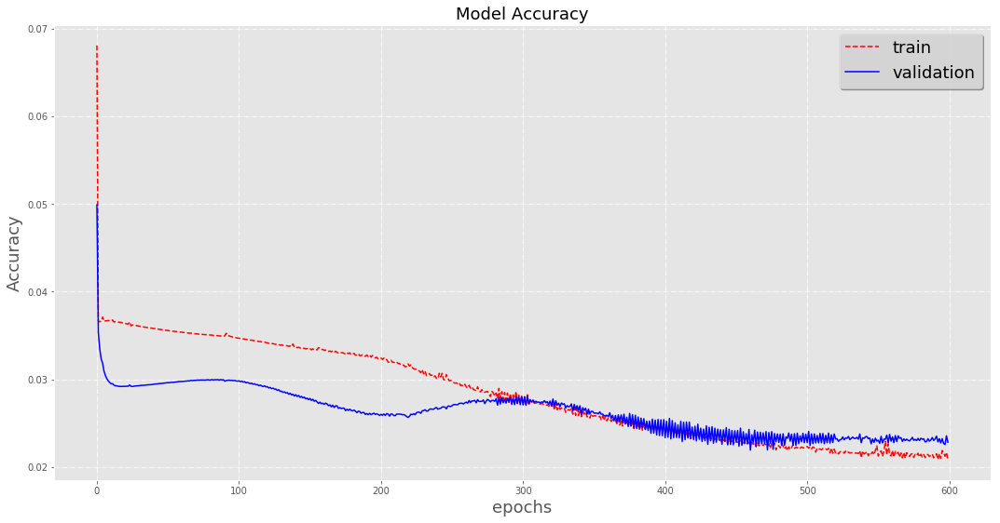


 Prediccion mes 6: 965660

 mes: 7
Grafica Entrenamiento


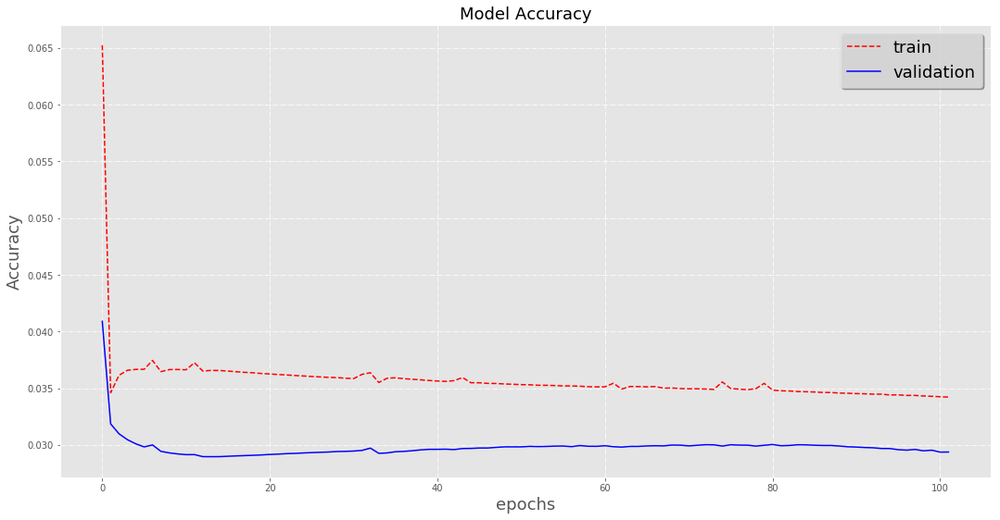


 Prediccion mes 7: 939670

 mes: 8
Grafica Entrenamiento


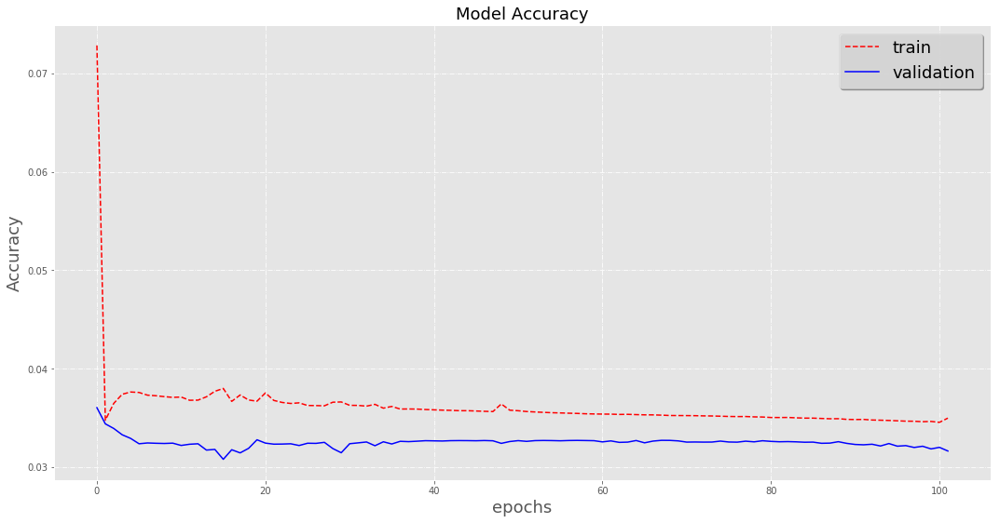


 Prediccion mes 8: 1094541

 mes: 9
Grafica Entrenamiento


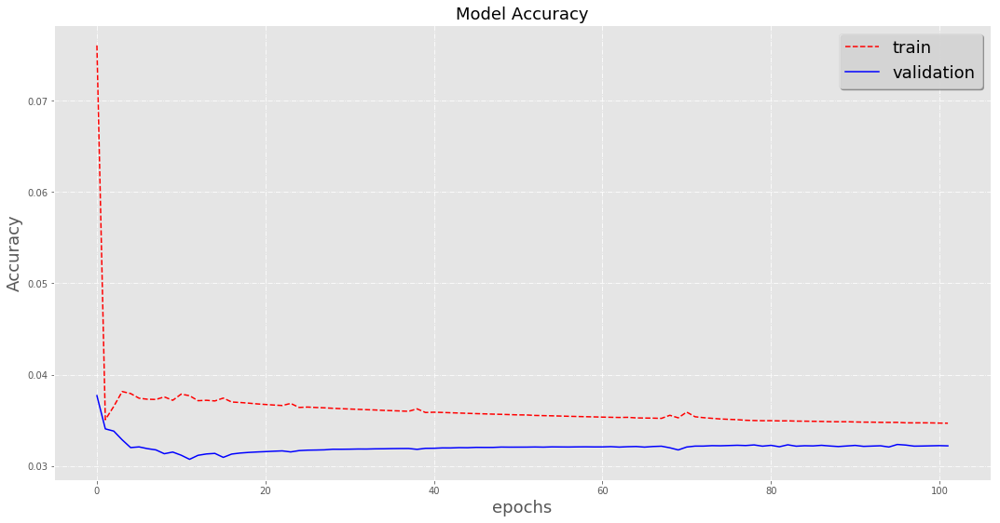


 Prediccion mes 9: 1011302

 mes: 10
Grafica Entrenamiento


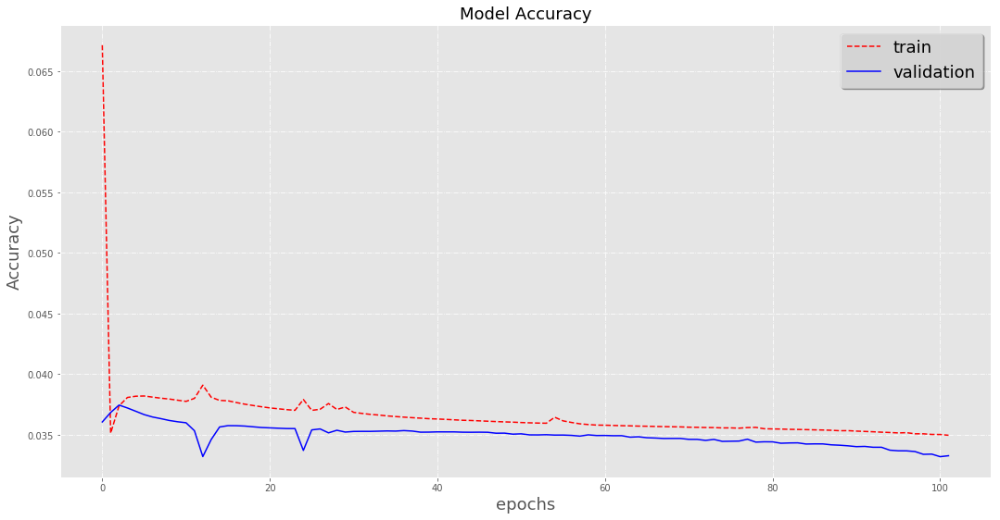


 Prediccion mes 10: 1160861

 mes: 11
Grafica Entrenamiento


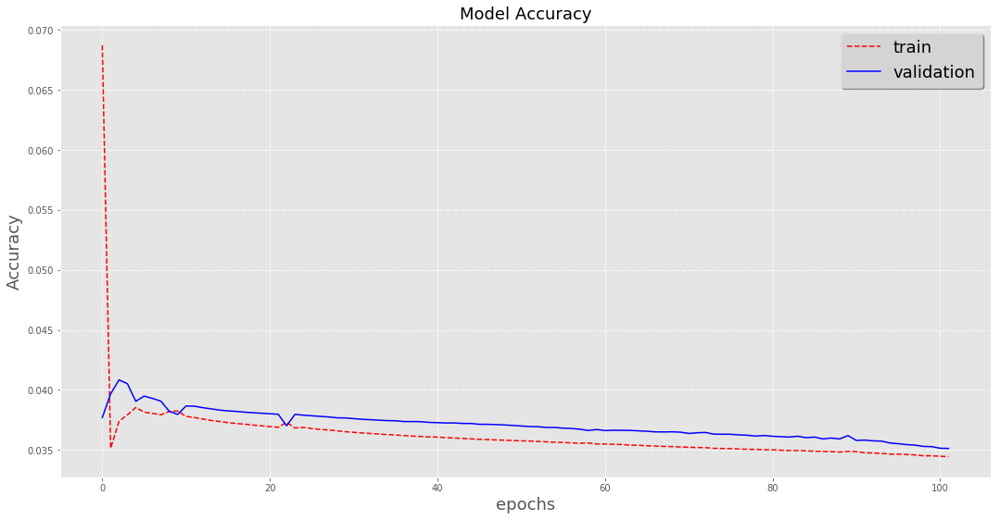


 Prediccion mes 11: 1134793

 mes: 12
Grafica Entrenamiento


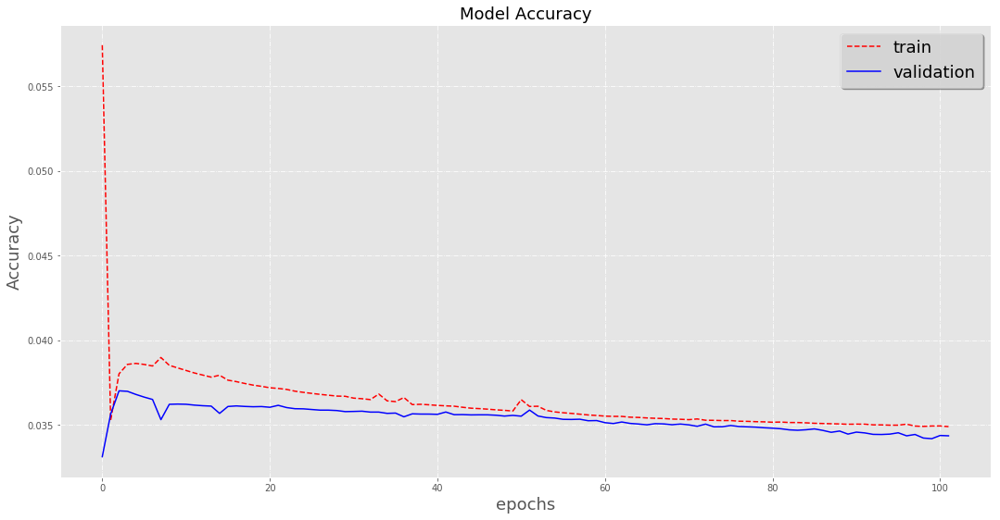


 Prediccion mes 12: 1108574

 Rmse:
[133806.3579059676, 131539.2823328799]

 Mape:
[10.191203506277462, 10.336490961258182]

 Smape:
[1.2005559072781014, 1.1871914918171274]

 Repeticion: 3

 mes: 1
Grafica Entrenamiento


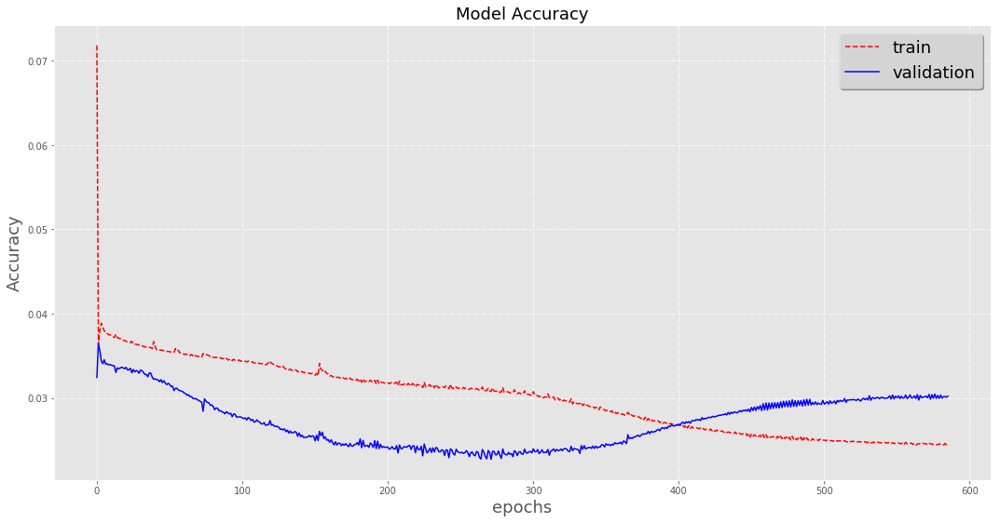


 Prediccion mes 1: 1115025

 mes: 2
Grafica Entrenamiento


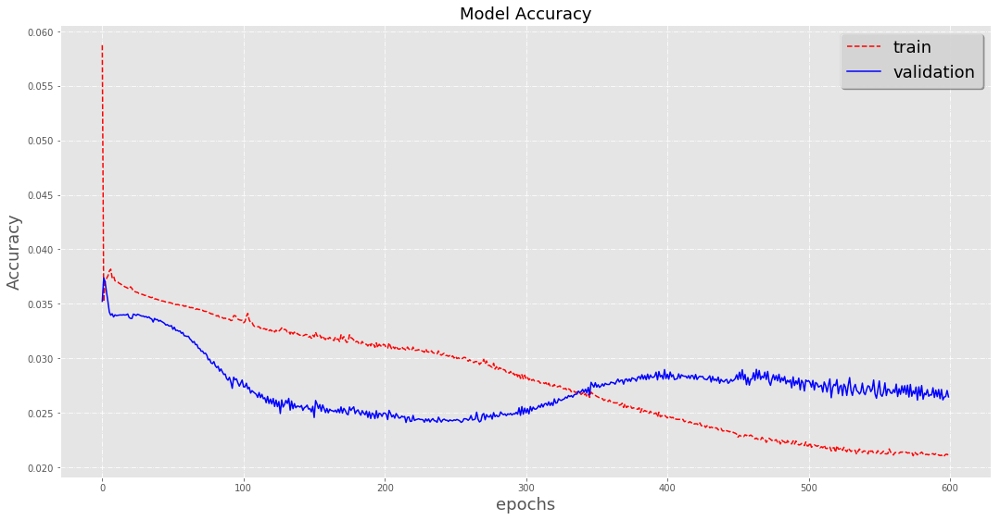


 Prediccion mes 2: 1030127

 mes: 3
Grafica Entrenamiento


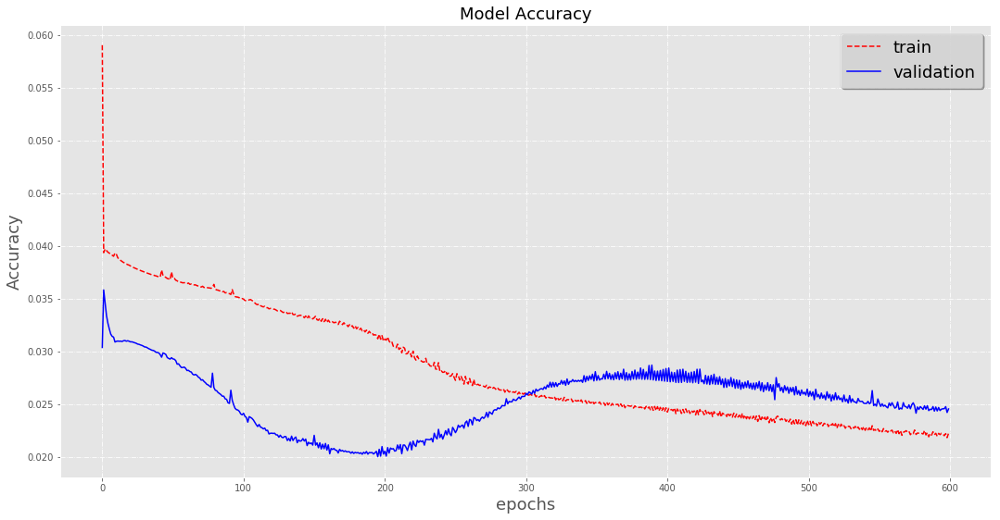


 Prediccion mes 3: 1057168

 mes: 4
Grafica Entrenamiento


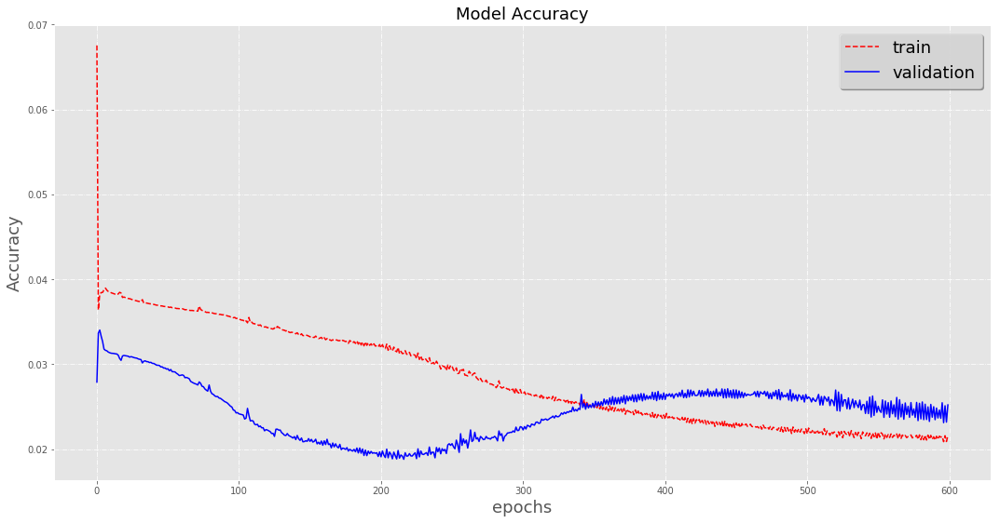


 Prediccion mes 4: 1111529

 mes: 5
Grafica Entrenamiento


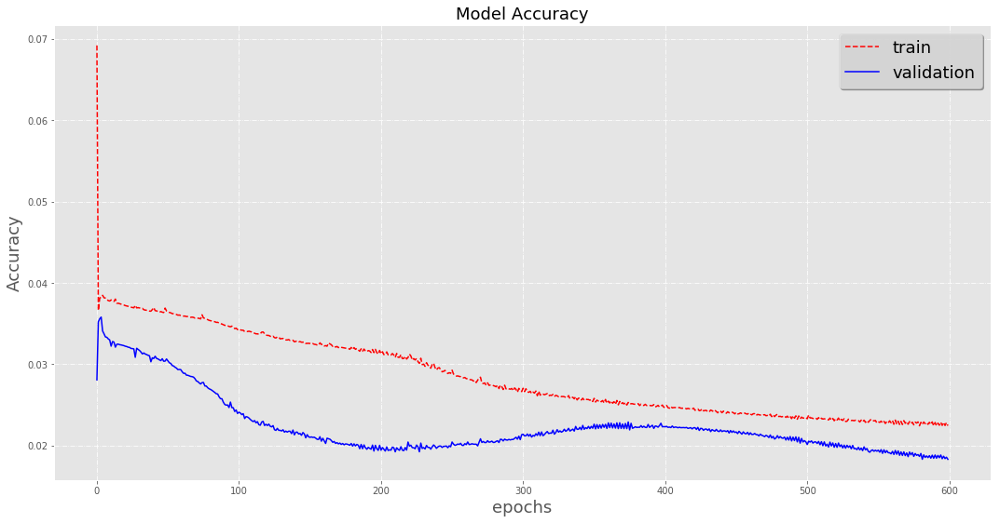


 Prediccion mes 5: 1100138

 mes: 6
Grafica Entrenamiento


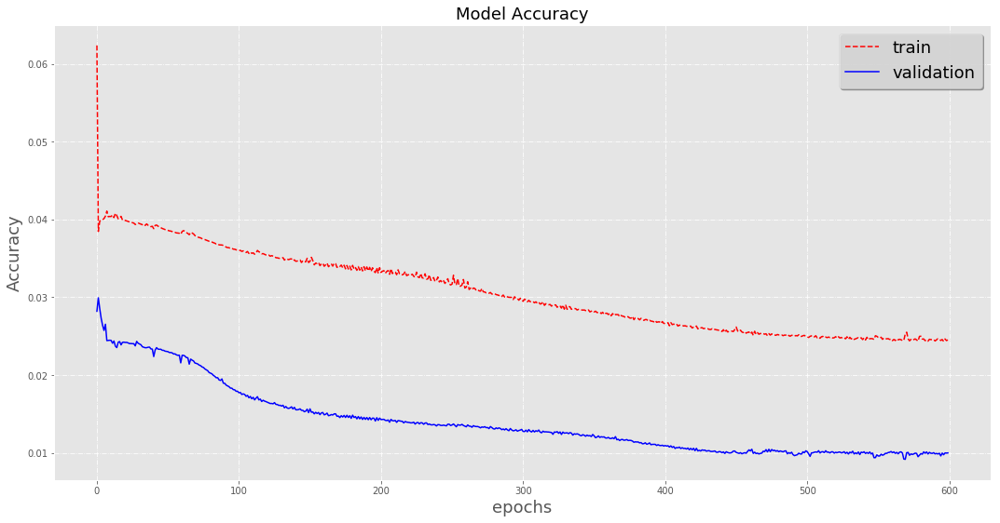


 Prediccion mes 6: 1006315

 mes: 7
Grafica Entrenamiento


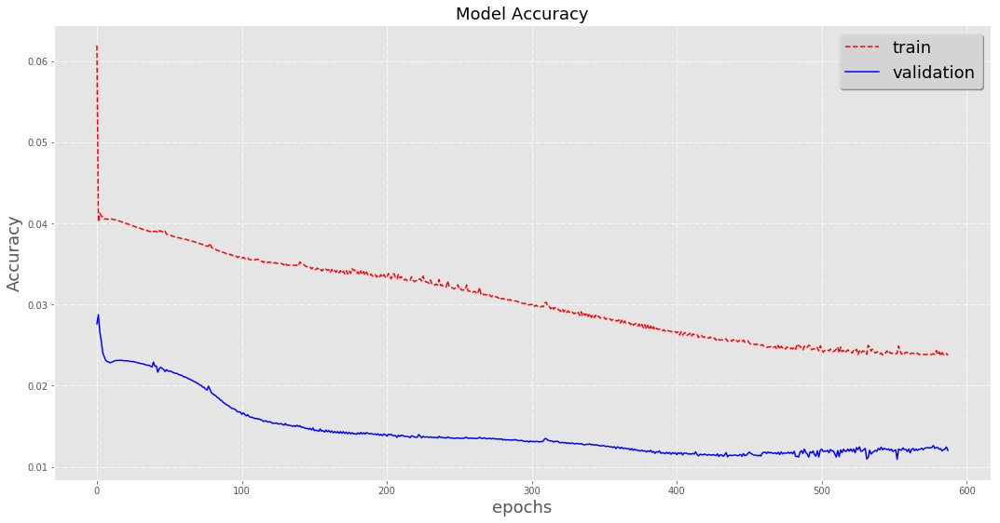


 Prediccion mes 7: 834961

 mes: 8
Grafica Entrenamiento


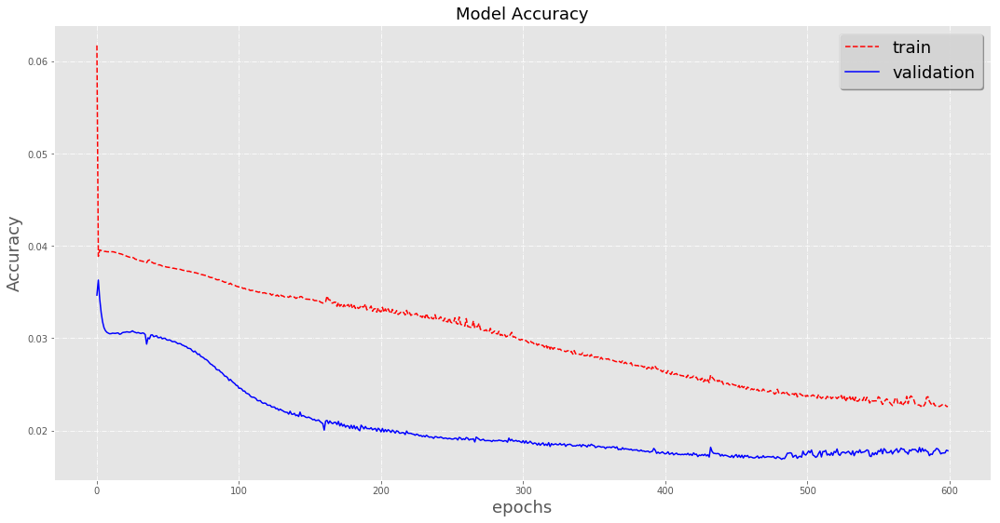


 Prediccion mes 8: 1079340

 mes: 9
Grafica Entrenamiento


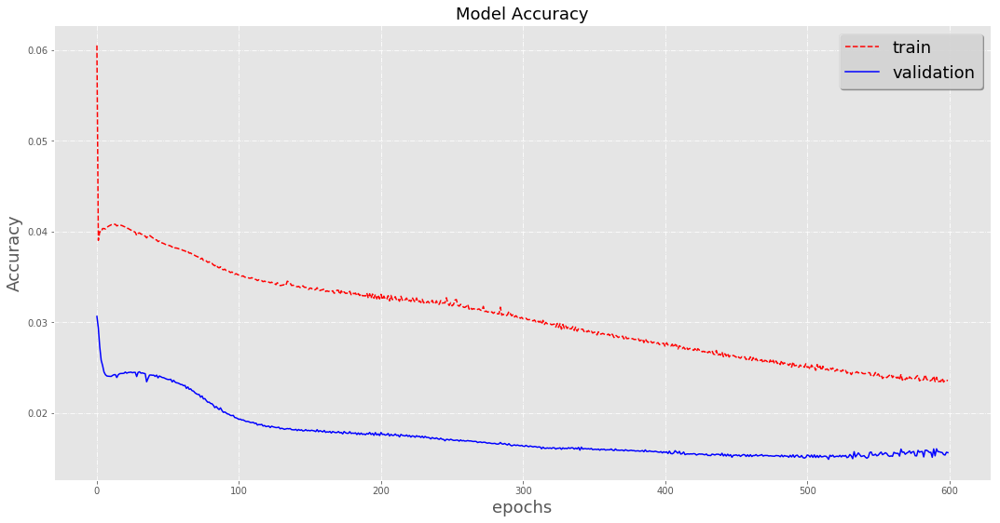


 Prediccion mes 9: 1060435

 mes: 10
Grafica Entrenamiento


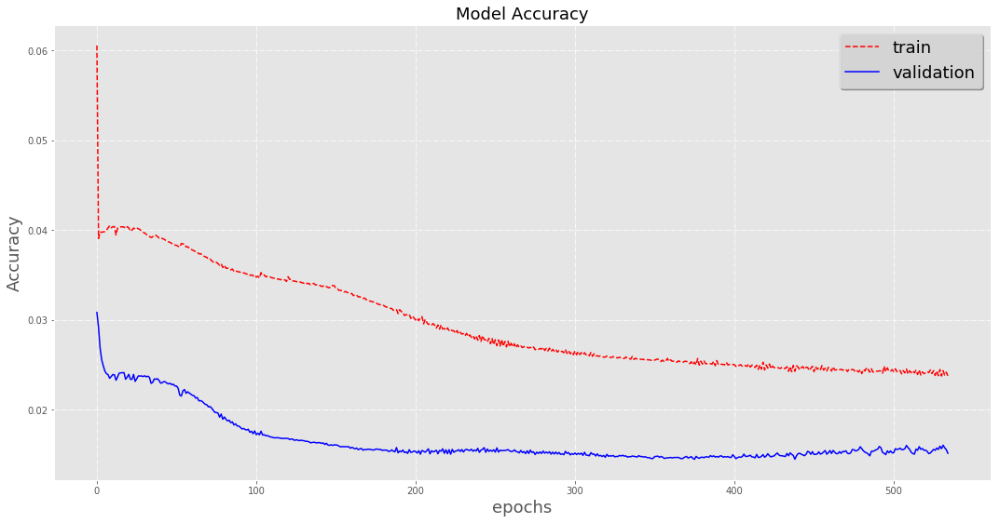


 Prediccion mes 10: 1071746

 mes: 11
Grafica Entrenamiento


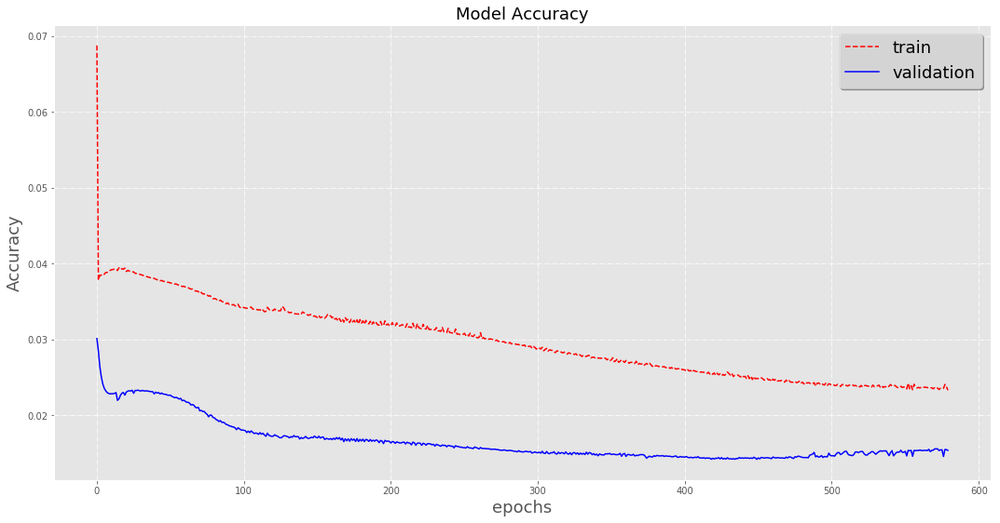


 Prediccion mes 11: 1072407

 mes: 12
Grafica Entrenamiento


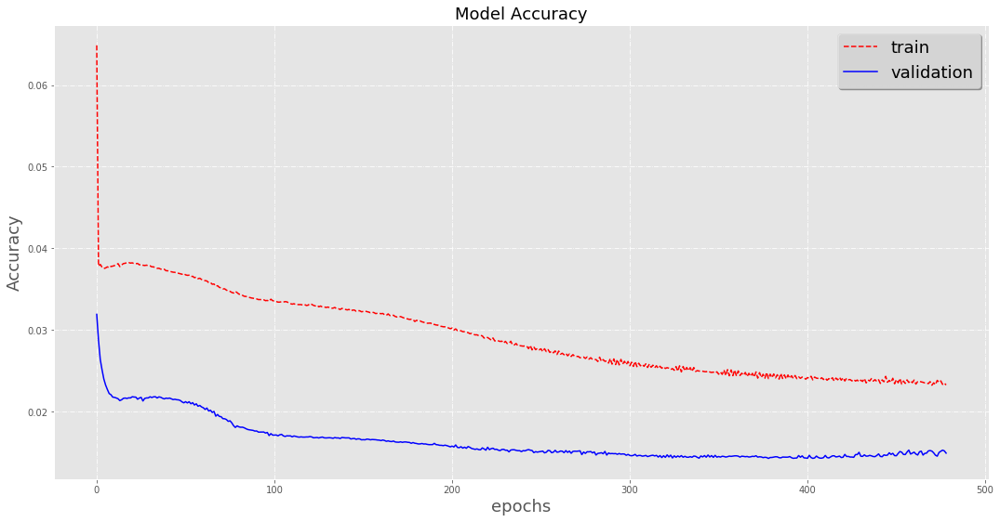


 Prediccion mes 12: 1065347

 Rmse:
[133806.3579059676, 131539.2823328799, 133041.54848197484]

 Mape:
[10.191203506277462, 10.336490961258182, 10.135944077277768]

 Smape:
[1.2005559072781014, 1.1871914918171274, 1.186196705498458]

 Repeticion: 4

 mes: 1
Grafica Entrenamiento


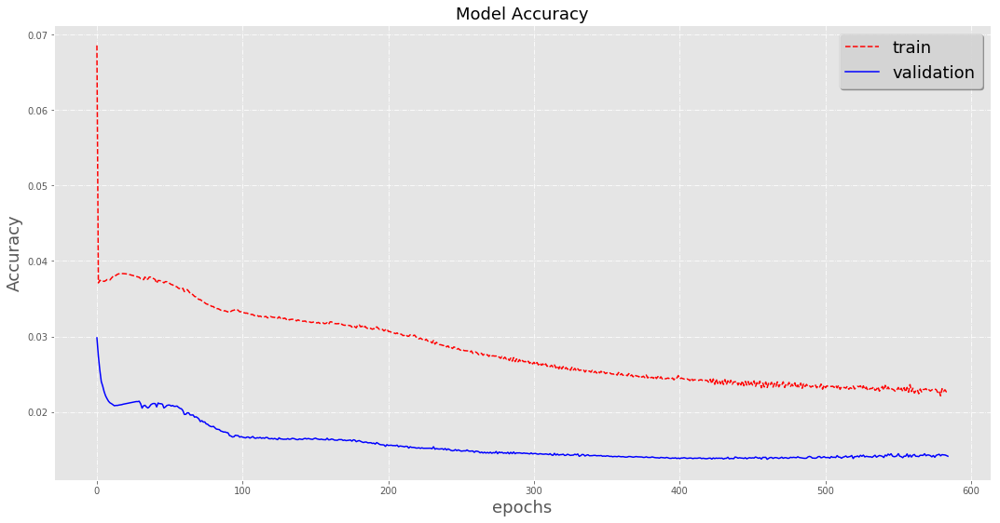


 Prediccion mes 1: 1086265

 mes: 2
Grafica Entrenamiento


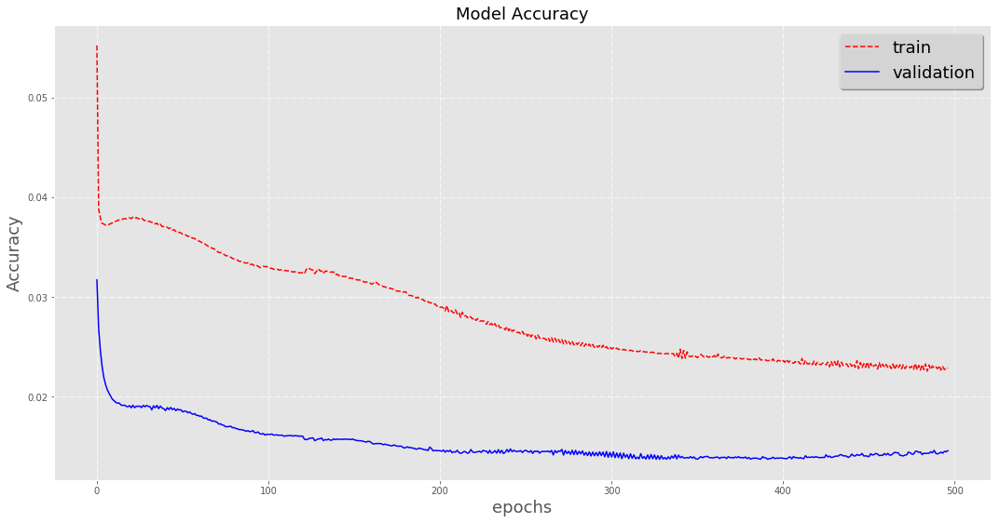


 Prediccion mes 2: 1047320

 mes: 3
Grafica Entrenamiento


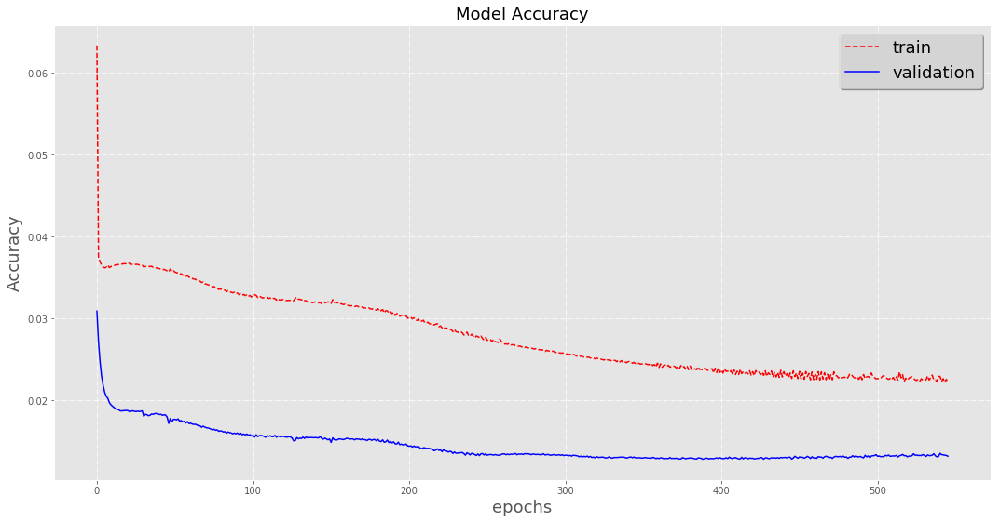


 Prediccion mes 3: 1053346

 mes: 4
Grafica Entrenamiento


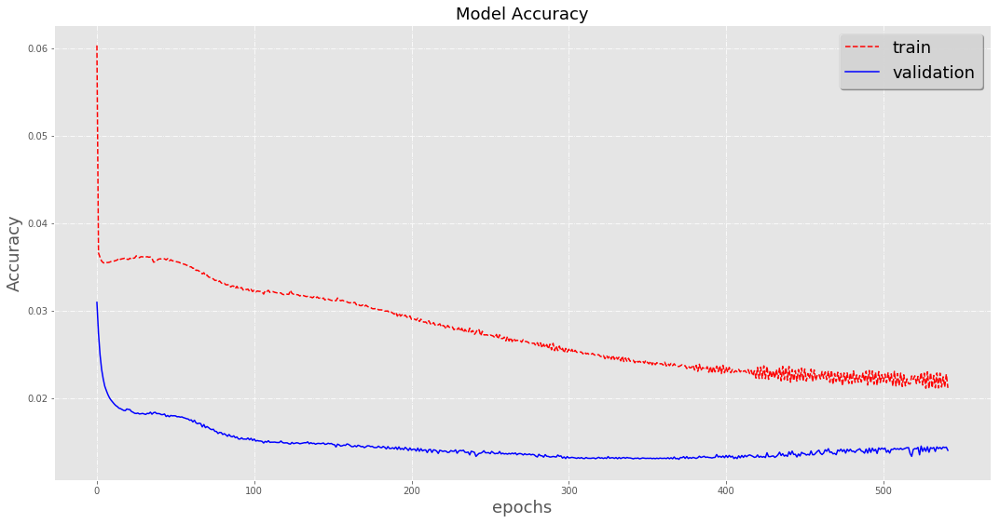


 Prediccion mes 4: 1069950

 mes: 5
Grafica Entrenamiento


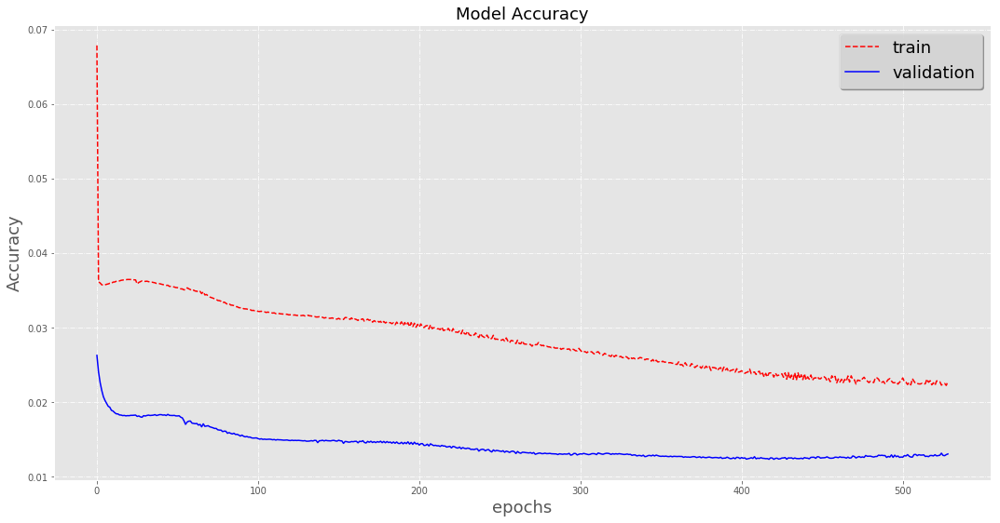


 Prediccion mes 5: 1060014

 mes: 6
Grafica Entrenamiento


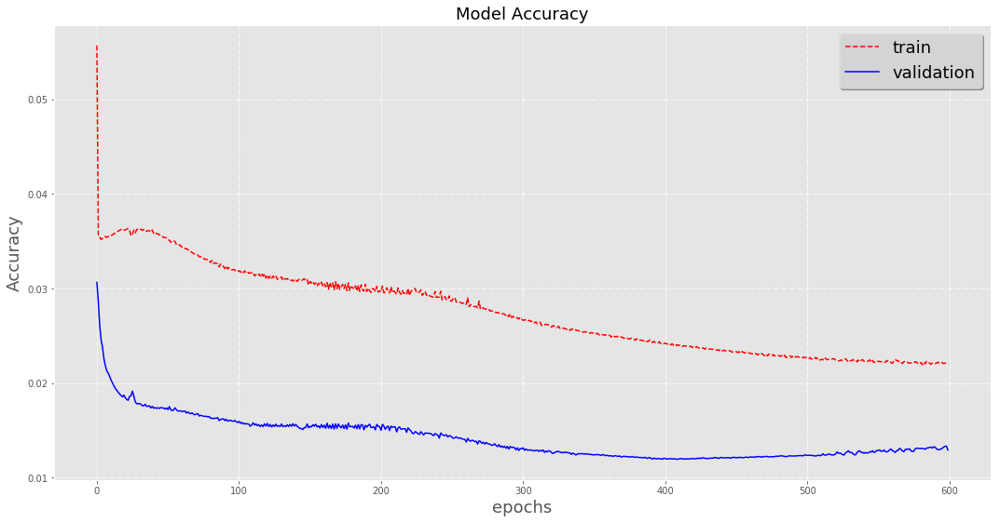


 Prediccion mes 6: 1013850

 mes: 7
Grafica Entrenamiento


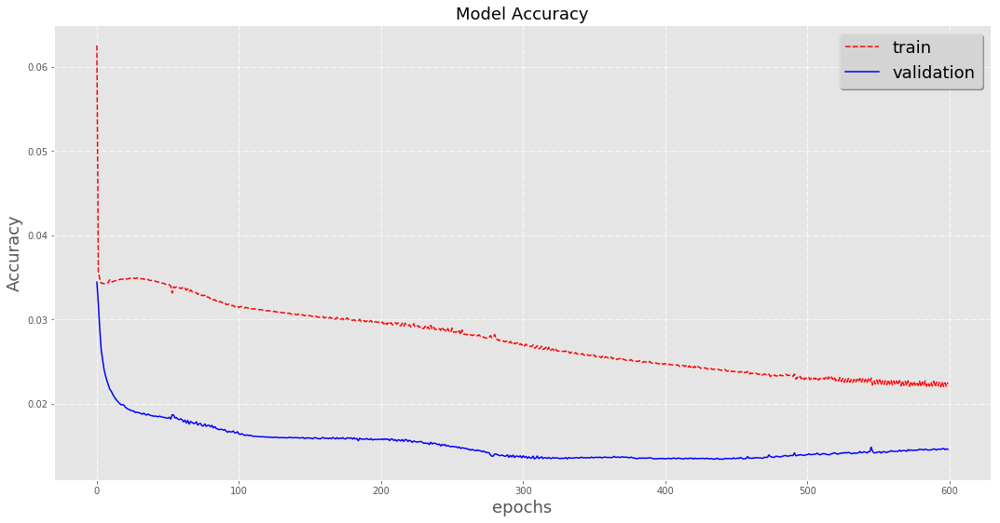


 Prediccion mes 7: 870105

 mes: 8
Grafica Entrenamiento


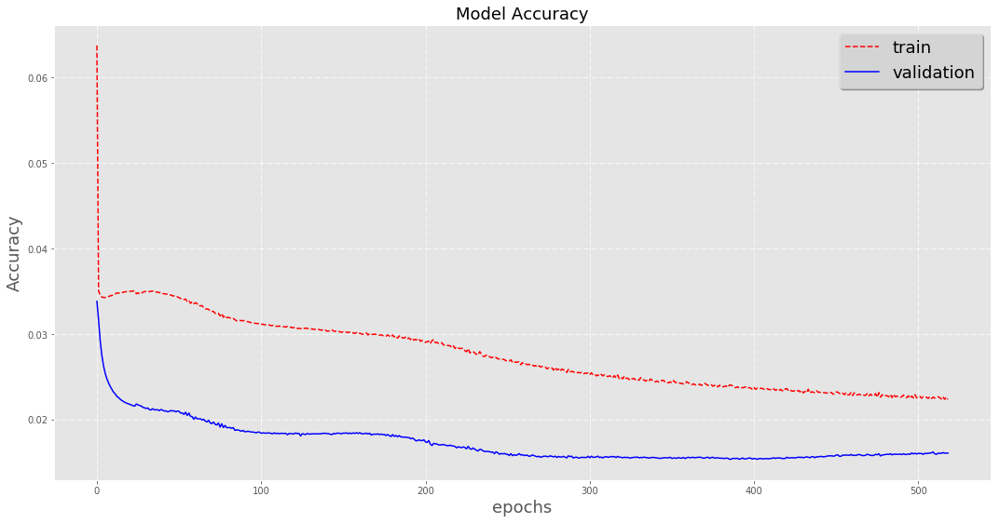


 Prediccion mes 8: 1057420

 mes: 9
Grafica Entrenamiento


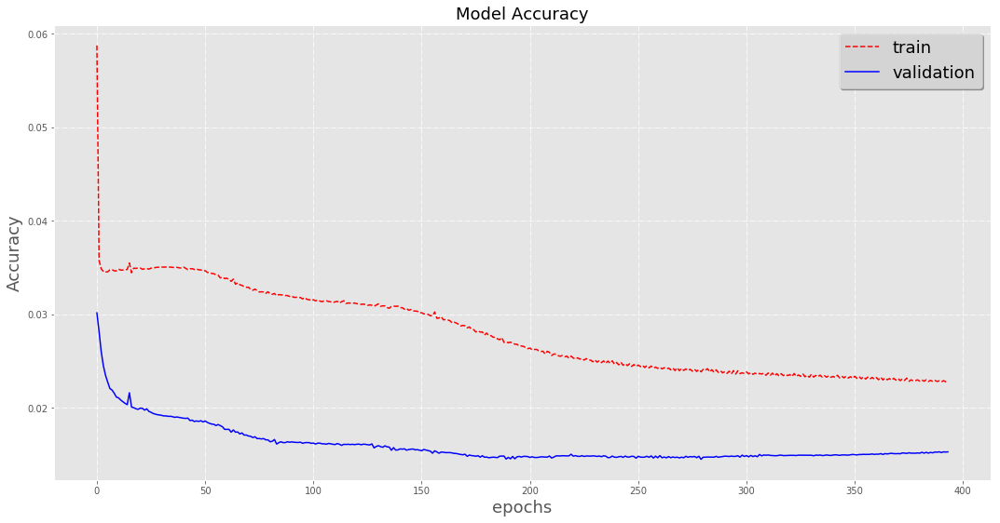


 Prediccion mes 9: 1038666

 mes: 10
Grafica Entrenamiento


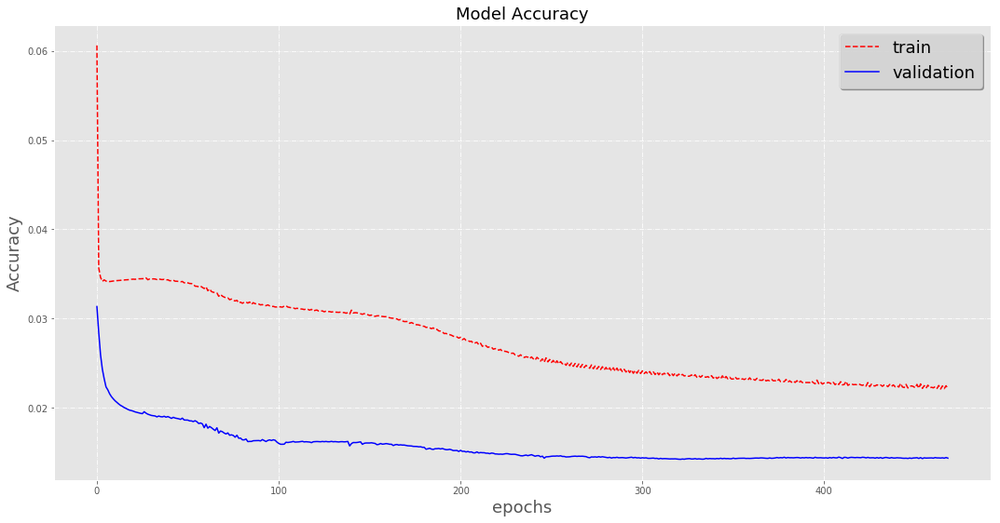


 Prediccion mes 10: 1054828

 mes: 11
Grafica Entrenamiento


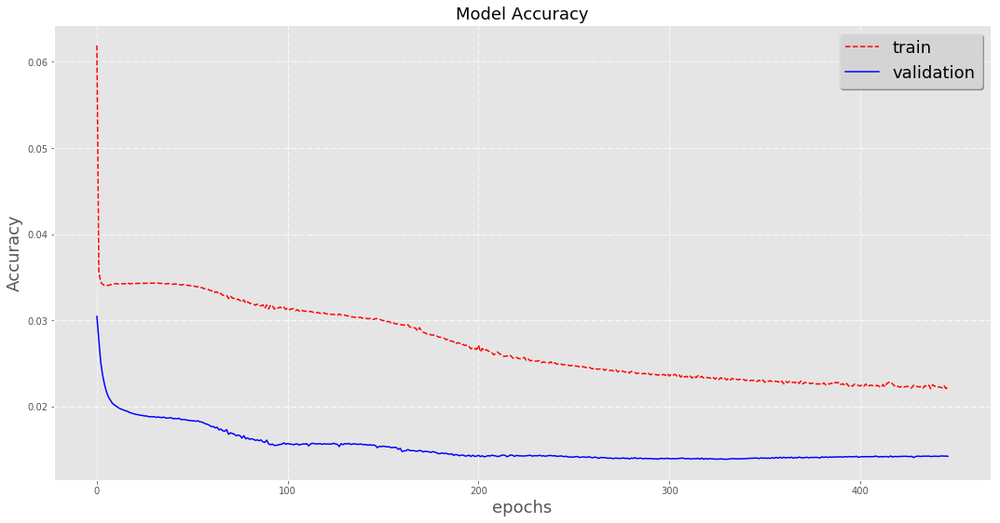


 Prediccion mes 11: 1055585

 mes: 12
Grafica Entrenamiento


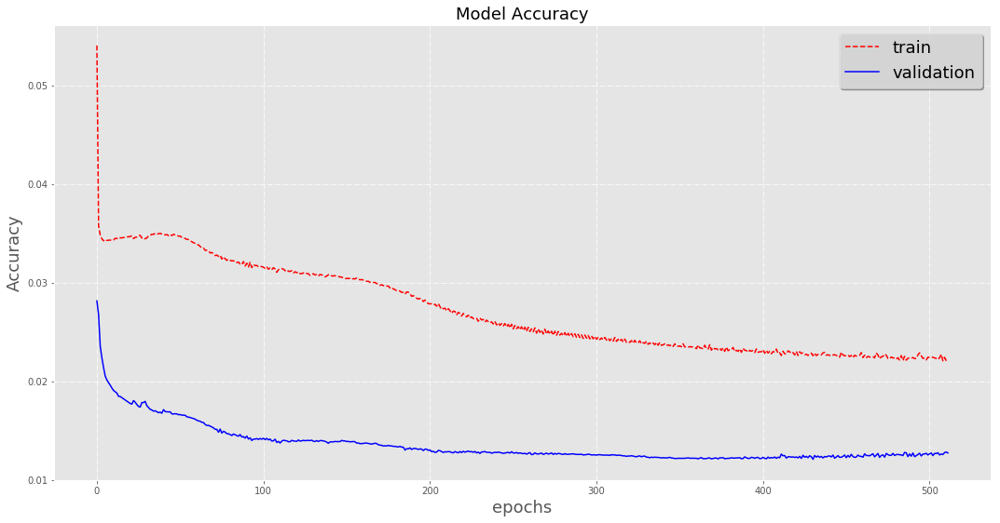


 Prediccion mes 12: 1044160

 Rmse:
[133806.3579059676, 131539.2823328799, 133041.54848197484, 124236.30352419367]

 Mape:
[10.191203506277462, 10.336490961258182, 10.135944077277768, 9.3925606165499]

 Smape:
[1.2005559072781014, 1.1871914918171274, 1.186196705498458, 1.1060900289507425]

 Repeticion: 5

 mes: 1
Grafica Entrenamiento


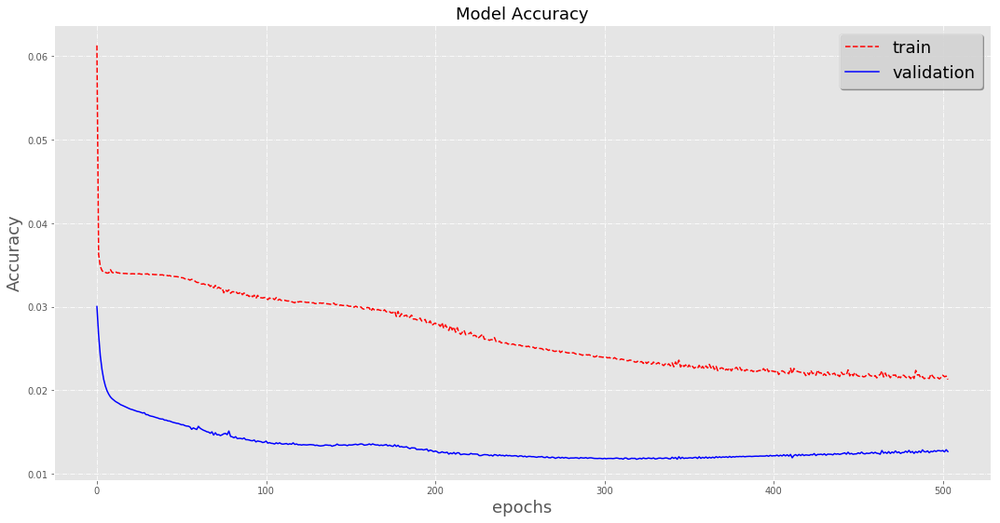


 Prediccion mes 1: 1060521

 mes: 2
Grafica Entrenamiento


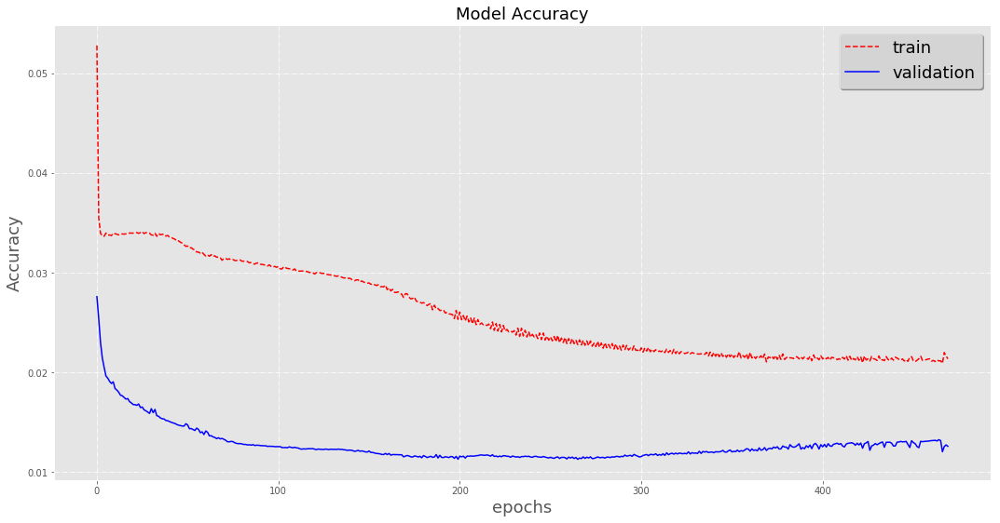


 Prediccion mes 2: 1056223

 mes: 3
Grafica Entrenamiento


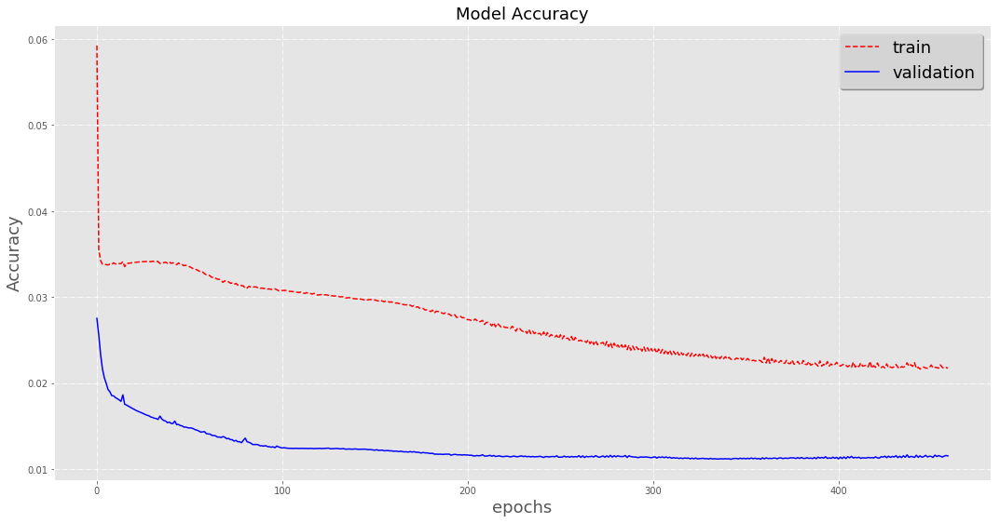


 Prediccion mes 3: 1060212

 mes: 4
Grafica Entrenamiento


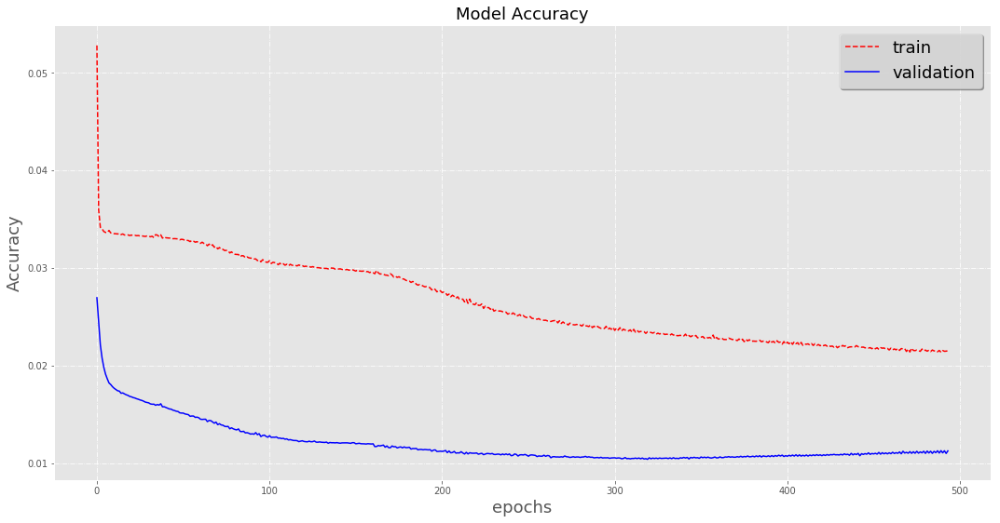


 Prediccion mes 4: 1050122

 mes: 5
Grafica Entrenamiento


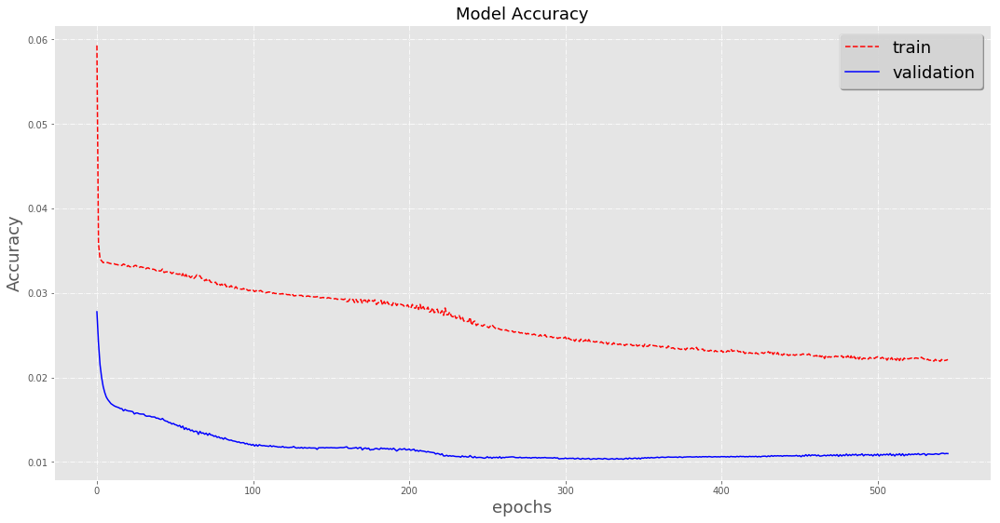


 Prediccion mes 5: 1052948

 mes: 6
Grafica Entrenamiento


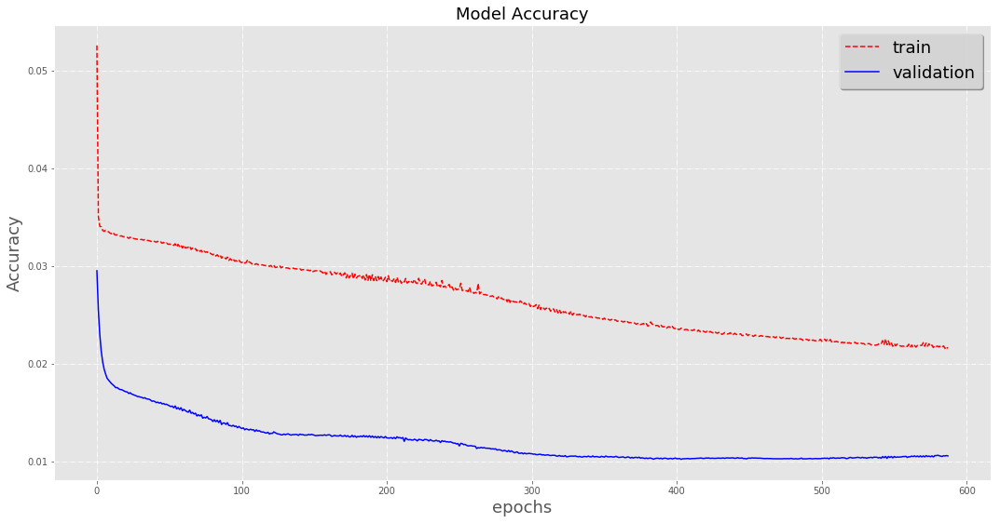


 Prediccion mes 6: 1031826

 mes: 7
Grafica Entrenamiento


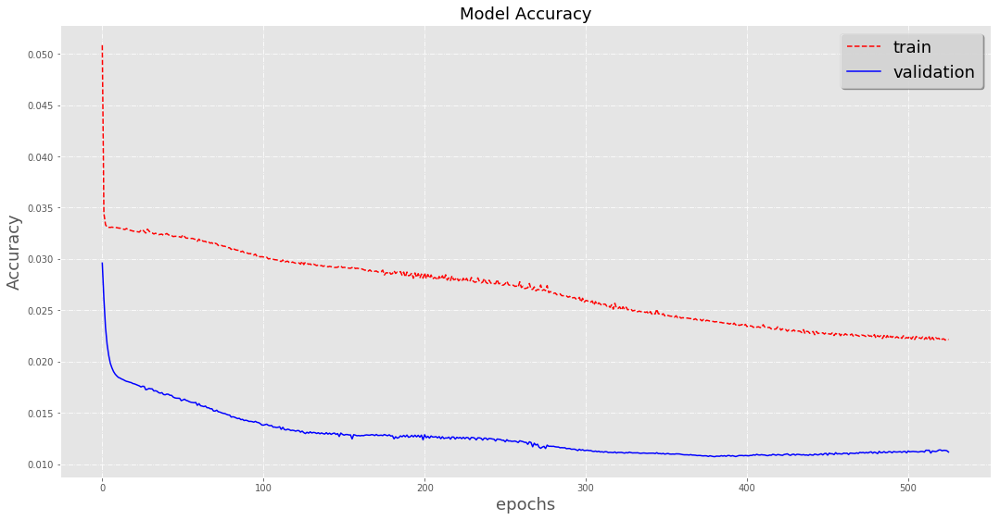


 Prediccion mes 7: 891068

 mes: 8
Grafica Entrenamiento


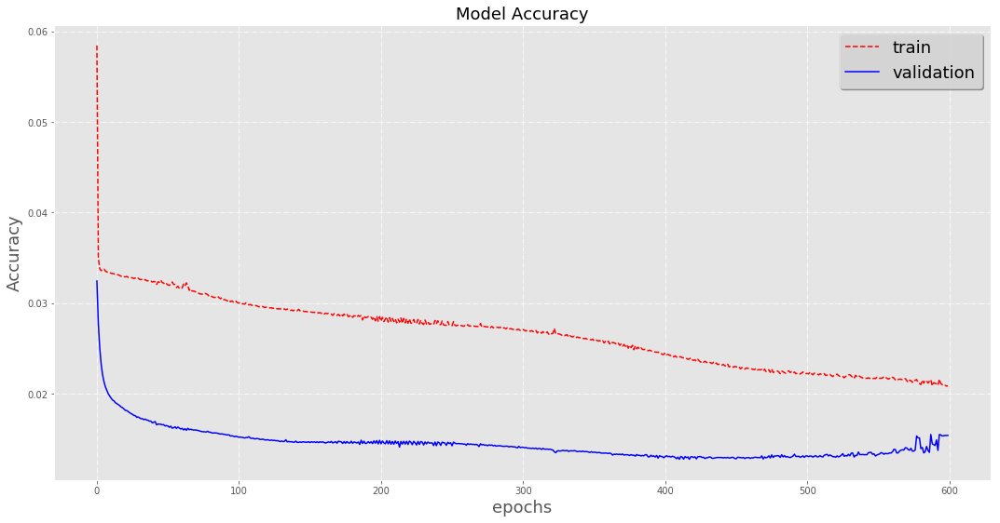


 Prediccion mes 8: 1062177

 mes: 9
Grafica Entrenamiento


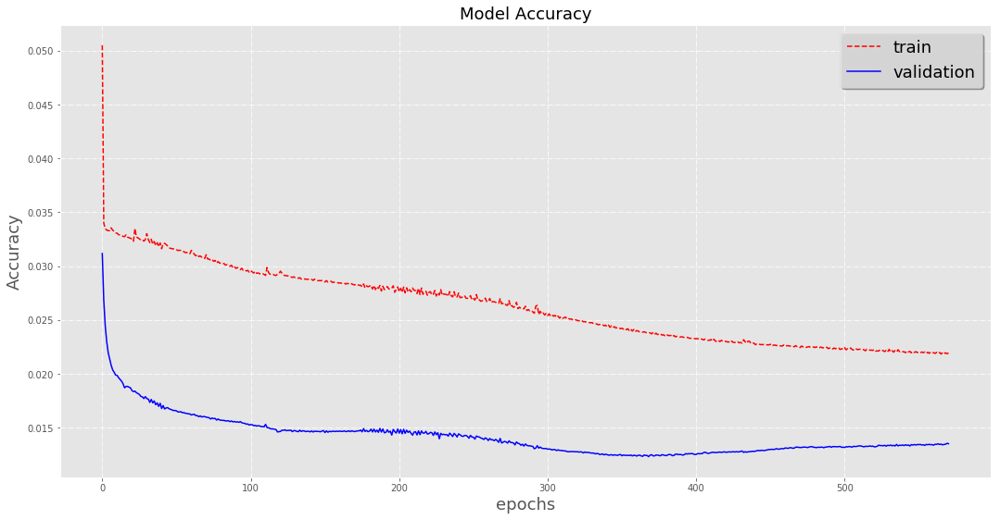


 Prediccion mes 9: 1056174

 mes: 10
Grafica Entrenamiento


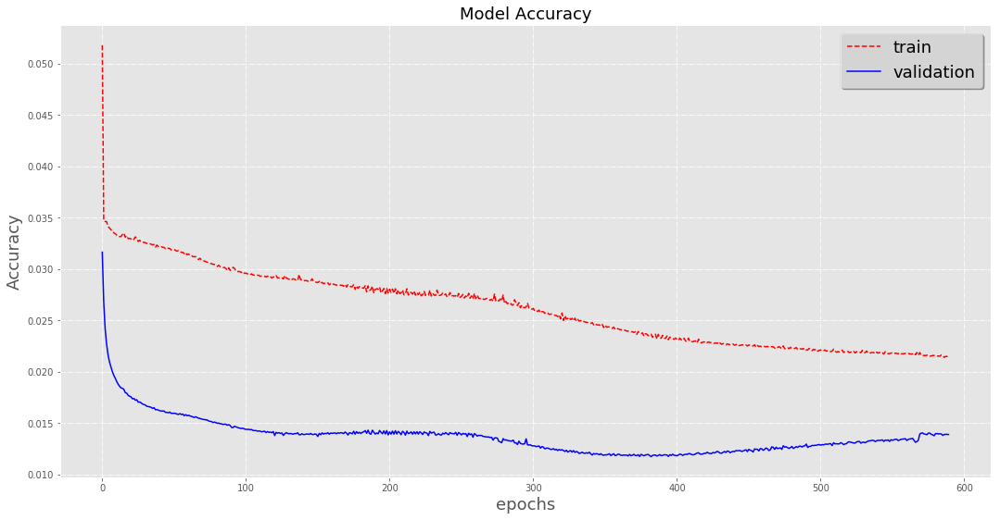


 Prediccion mes 10: 1067397

 mes: 11
Grafica Entrenamiento


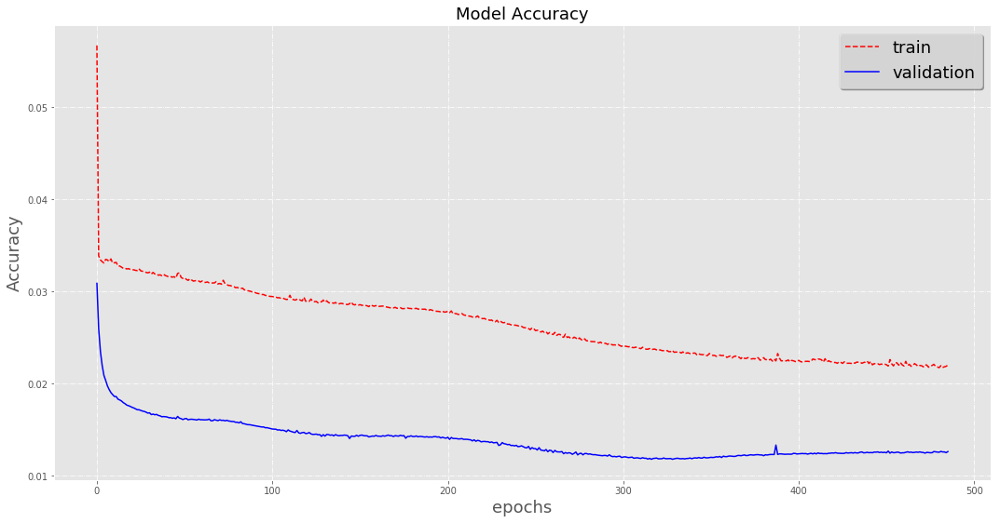


 Prediccion mes 11: 1071623

 mes: 12
Grafica Entrenamiento


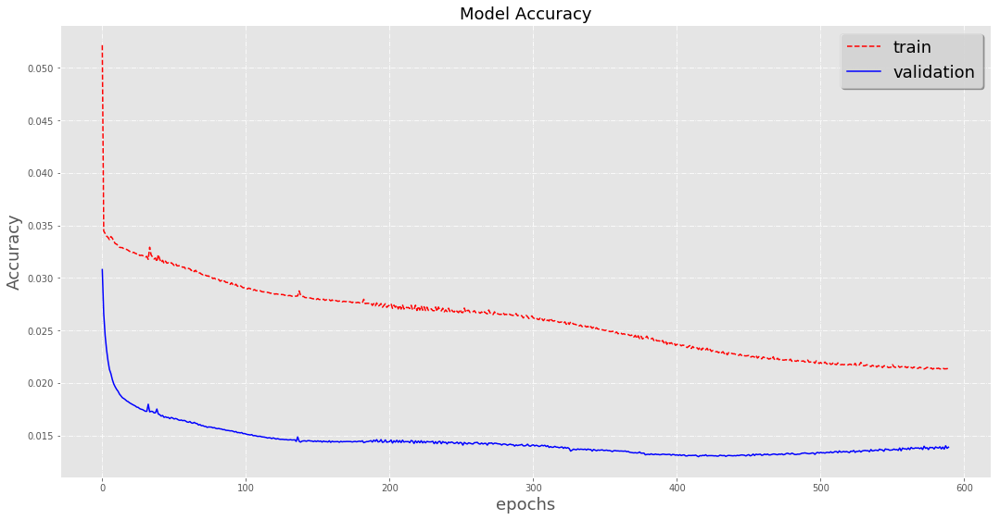


 Prediccion mes 12: 1071418

 Rmse:
[133806.3579059676, 131539.2823328799, 133041.54848197484, 124236.30352419367, 121647.35006617446]

 Mape:
[10.191203506277462, 10.336490961258182, 10.135944077277768, 9.3925606165499, 9.287639435215505]

 Smape:
[1.2005559072781014, 1.1871914918171274, 1.186196705498458, 1.1060900289507425, 1.084863813961006]

 Repeticion: 6

 mes: 1
Grafica Entrenamiento


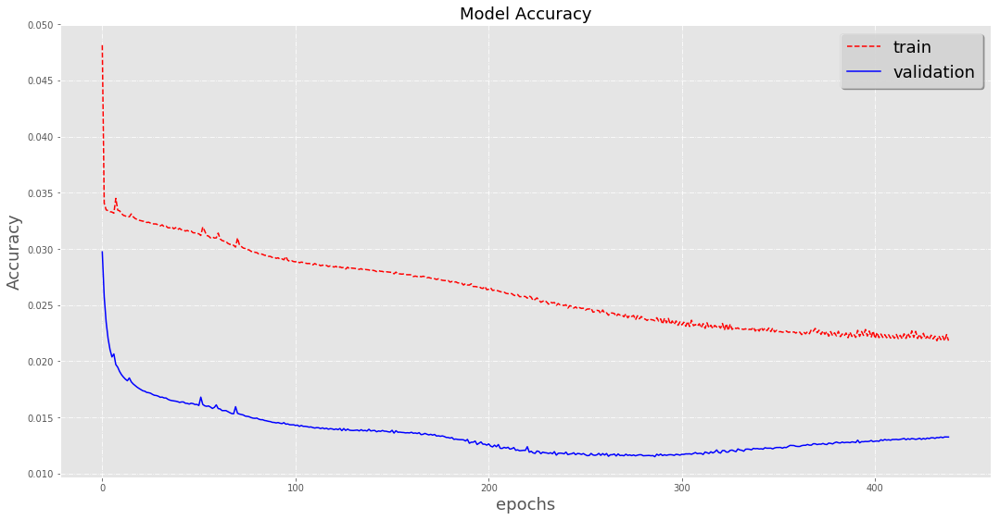


 Prediccion mes 1: 1086744

 mes: 2
Grafica Entrenamiento


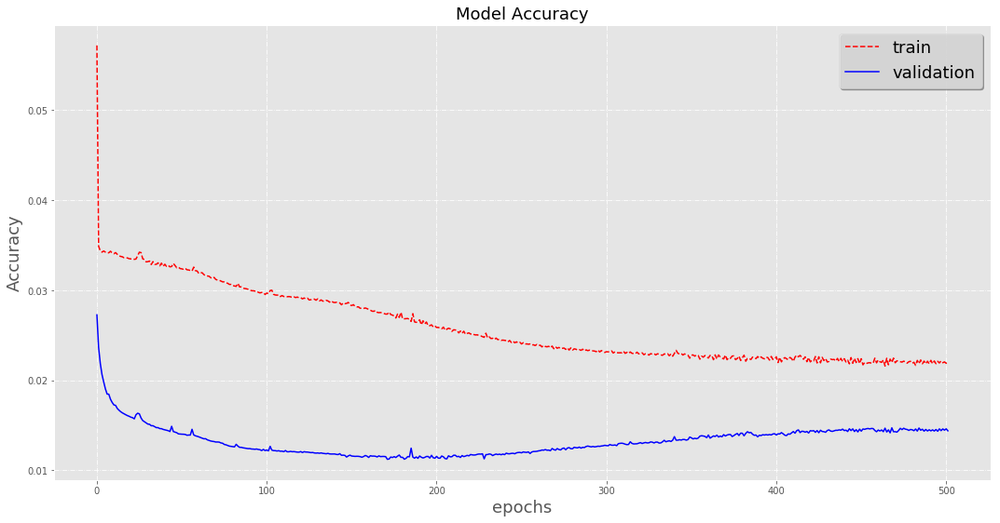


 Prediccion mes 2: 1048944

 mes: 3
Grafica Entrenamiento


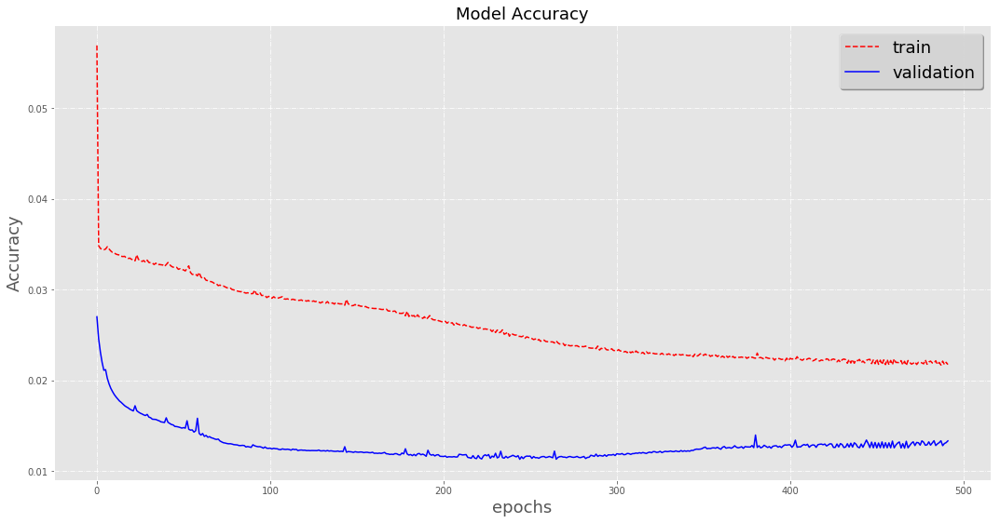


 Prediccion mes 3: 1063182

 mes: 4
Grafica Entrenamiento


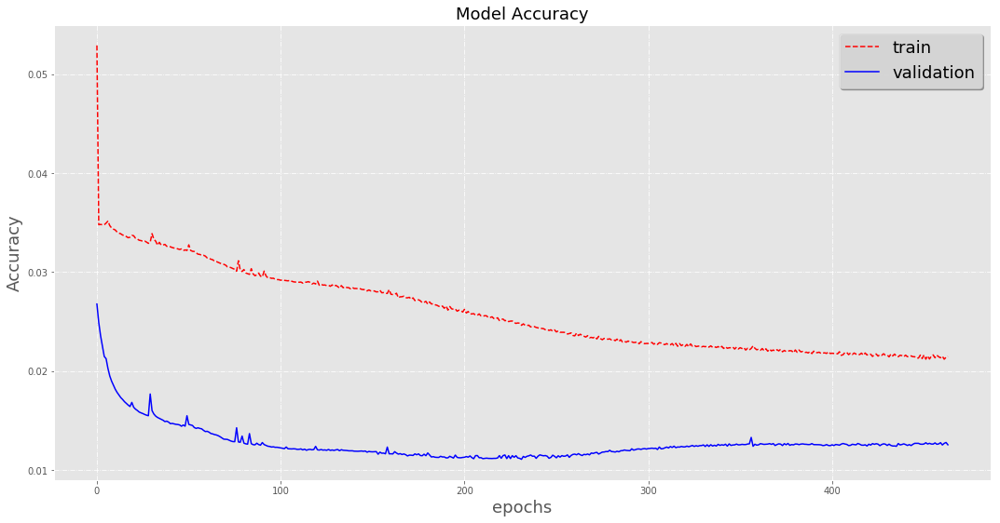


 Prediccion mes 4: 1086427

 mes: 5
Grafica Entrenamiento


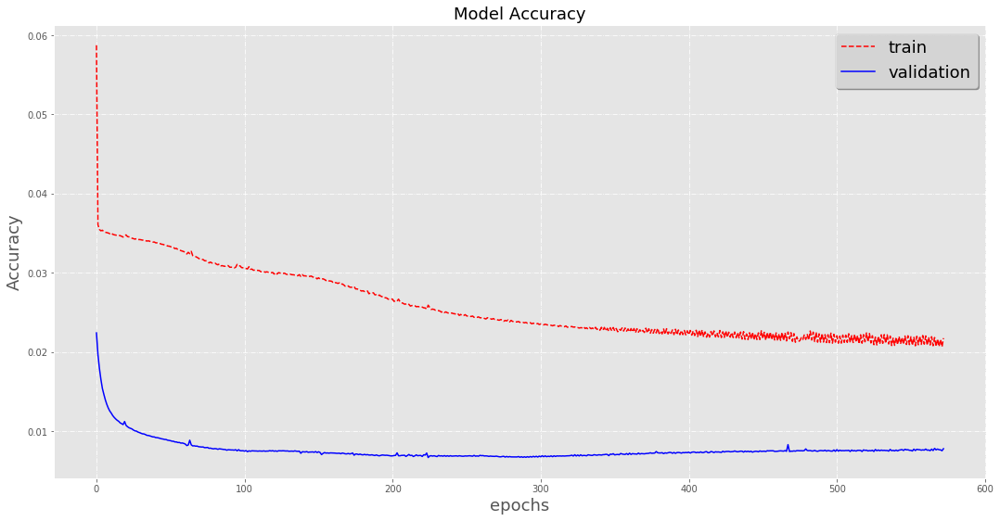


 Prediccion mes 5: 1069868

 mes: 6
Grafica Entrenamiento


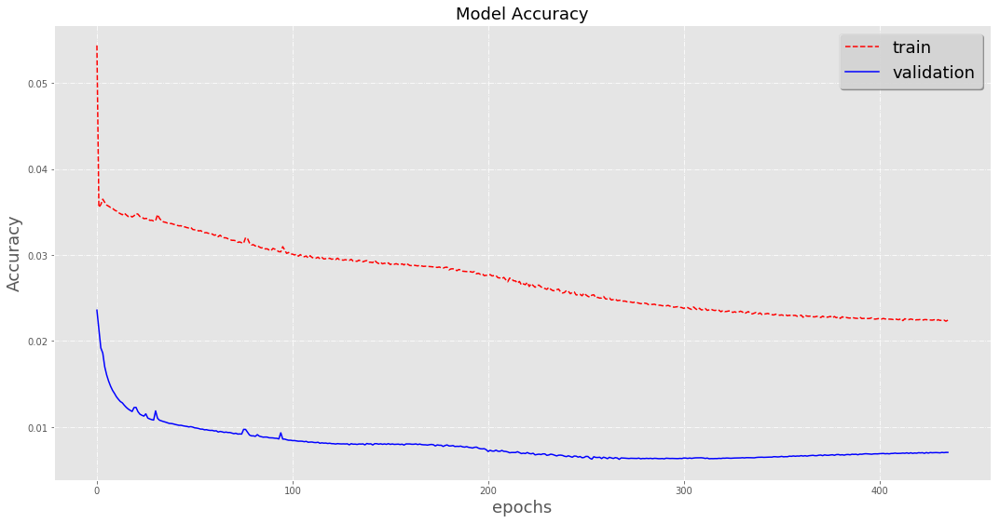


 Prediccion mes 6: 1058260

 mes: 7
Grafica Entrenamiento


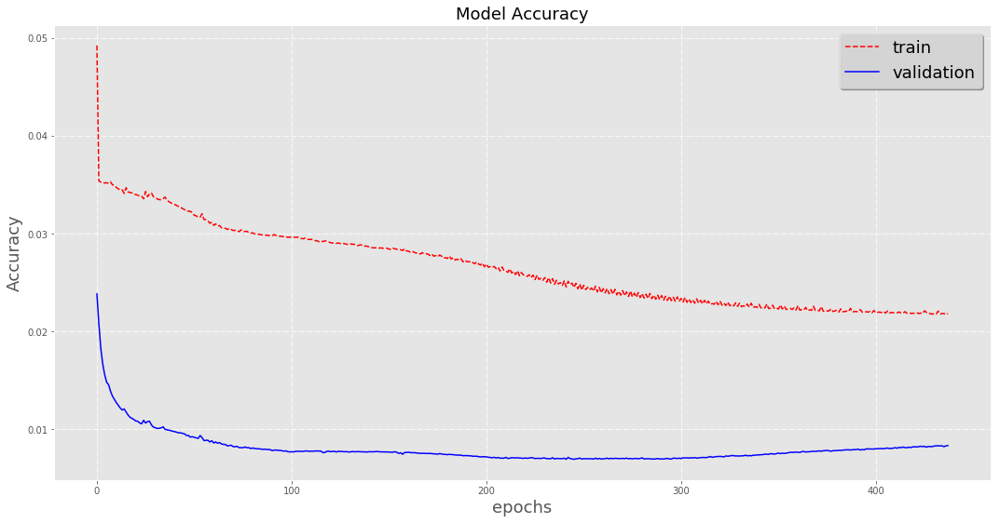


 Prediccion mes 7: 913929

 mes: 8
Grafica Entrenamiento


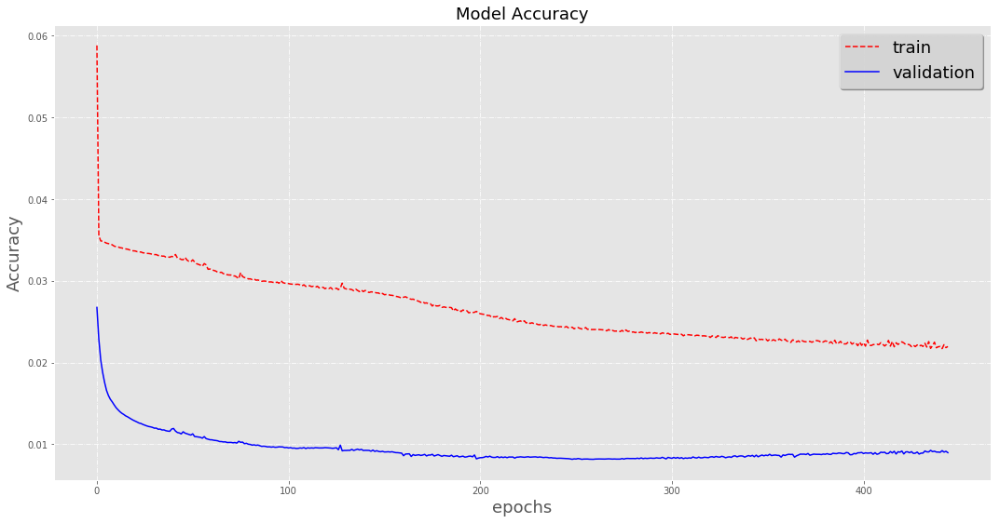


 Prediccion mes 8: 1052947

 mes: 9
Grafica Entrenamiento


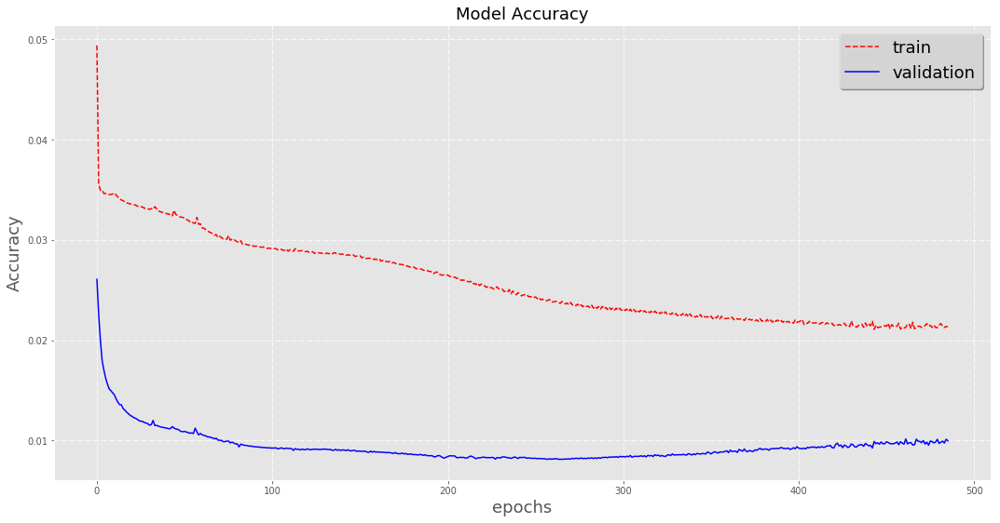


 Prediccion mes 9: 1093927

 mes: 10
Grafica Entrenamiento


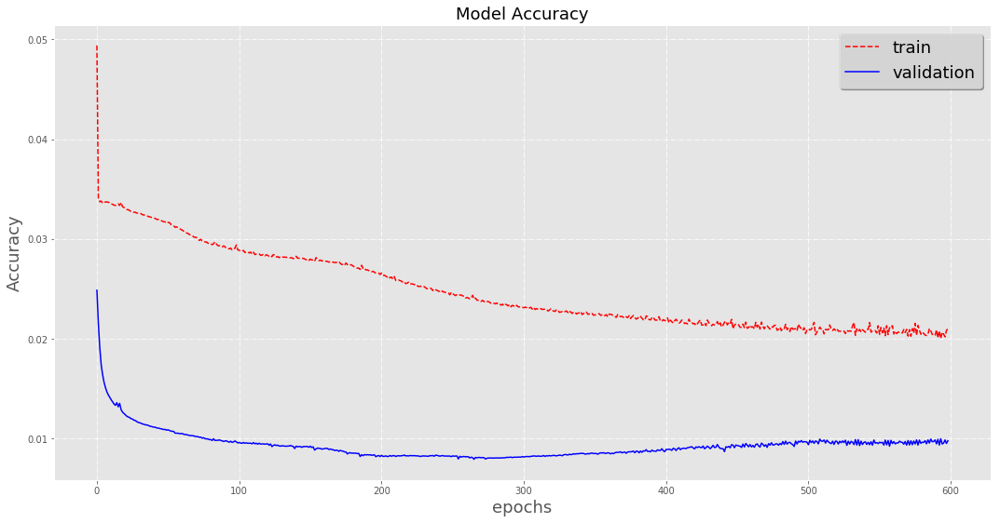


 Prediccion mes 10: 1075047

 mes: 11
Grafica Entrenamiento


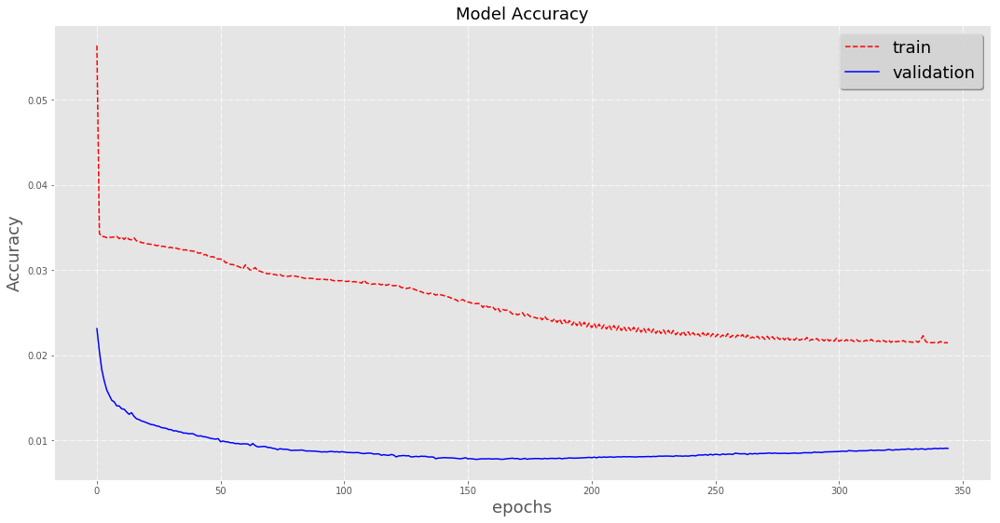


 Prediccion mes 11: 1066657

 mes: 12
Grafica Entrenamiento


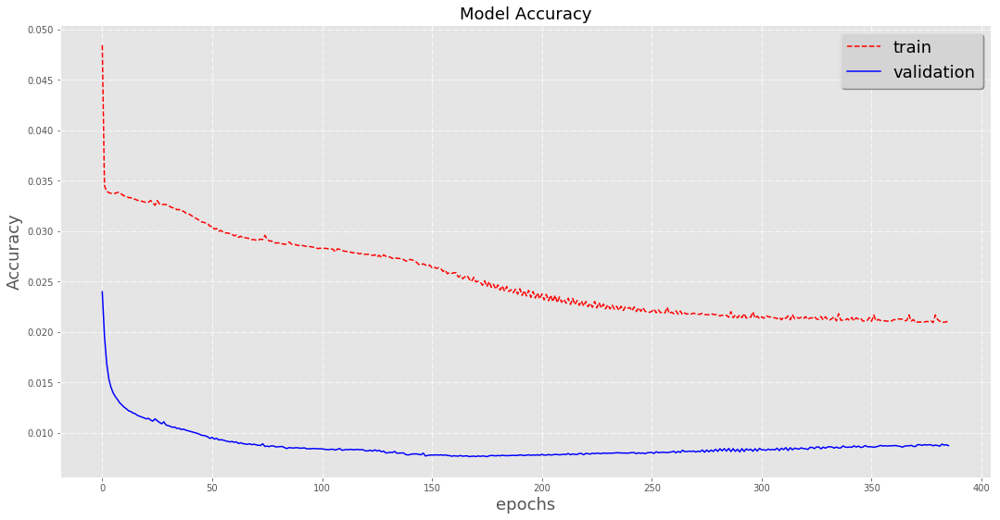


 Prediccion mes 12: 1053684

 Rmse:
[133806.3579059676, 131539.2823328799, 133041.54848197484, 124236.30352419367, 121647.35006617446, 121273.20942294614]

 Mape:
[10.191203506277462, 10.336490961258182, 10.135944077277768, 9.3925606165499, 9.287639435215505, 9.35904463963404]

 Smape:
[1.2005559072781014, 1.1871914918171274, 1.186196705498458, 1.1060900289507425, 1.084863813961006, 1.0799528705603452]

 Repeticion: 7

 mes: 1
Grafica Entrenamiento


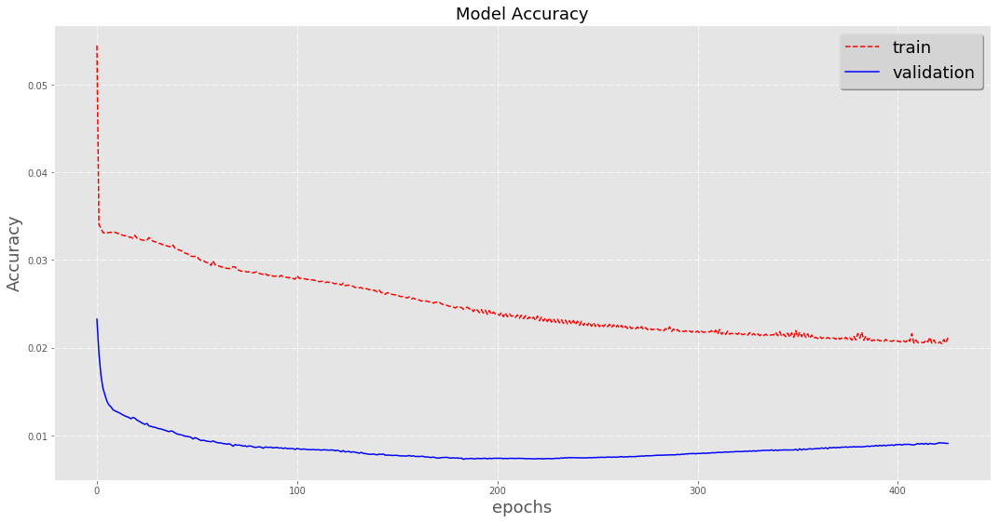


 Prediccion mes 1: 1067966

 mes: 2
Grafica Entrenamiento


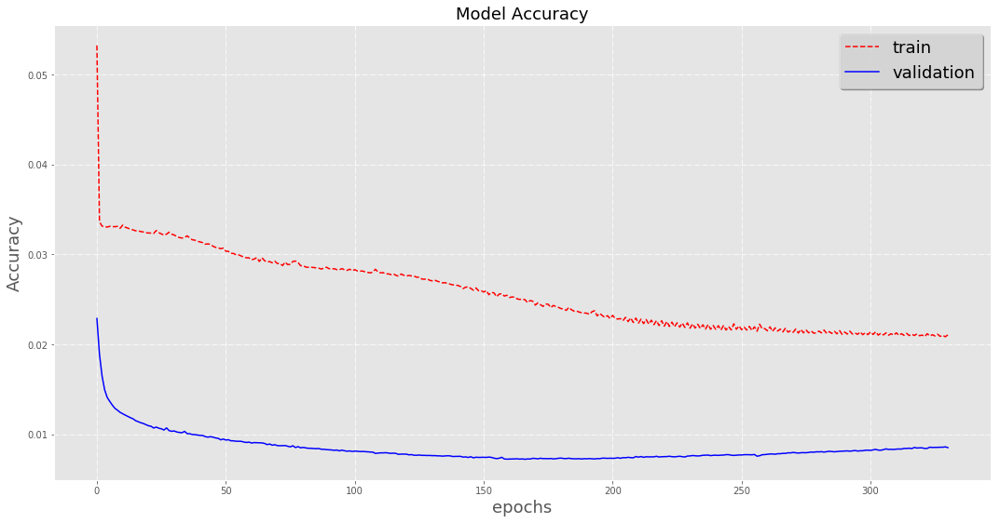


 Prediccion mes 2: 1056802

 mes: 3
Grafica Entrenamiento


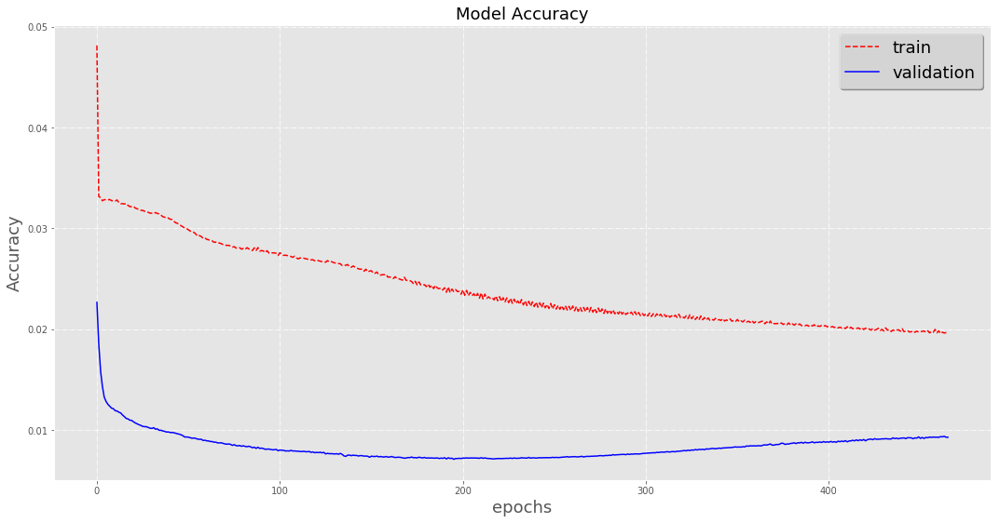


 Prediccion mes 3: 1044826

 mes: 4
Grafica Entrenamiento


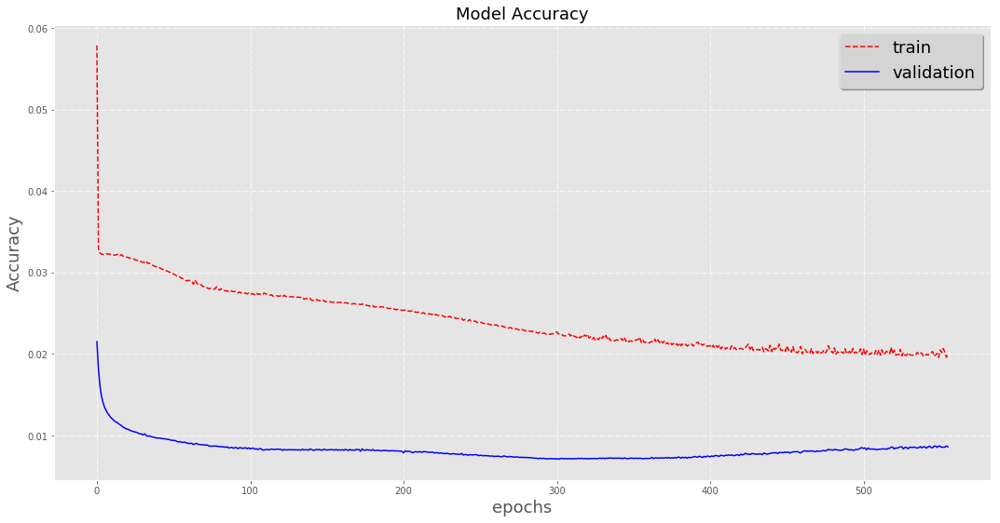


 Prediccion mes 4: 1063544

 mes: 5
Grafica Entrenamiento


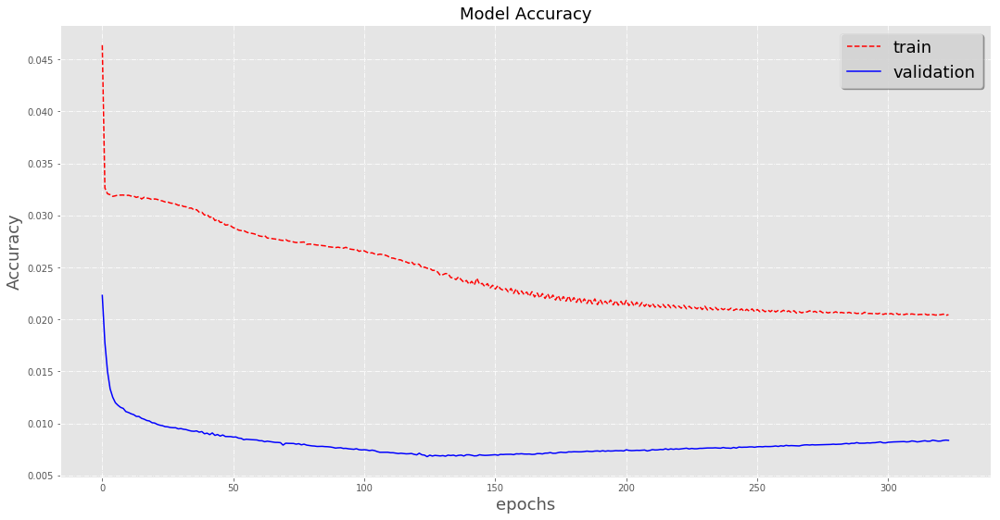


 Prediccion mes 5: 1058220

 mes: 6
Grafica Entrenamiento


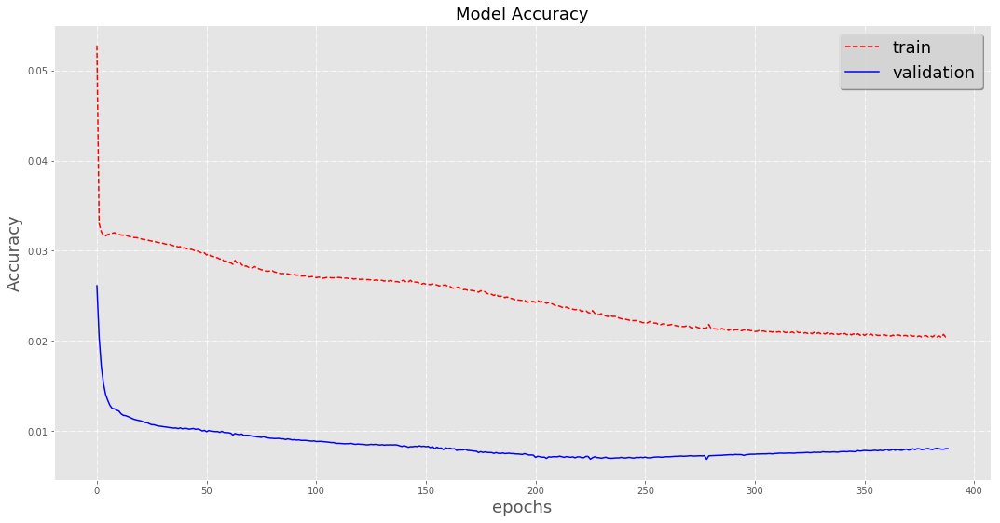


 Prediccion mes 6: 1046925

 mes: 7
Grafica Entrenamiento


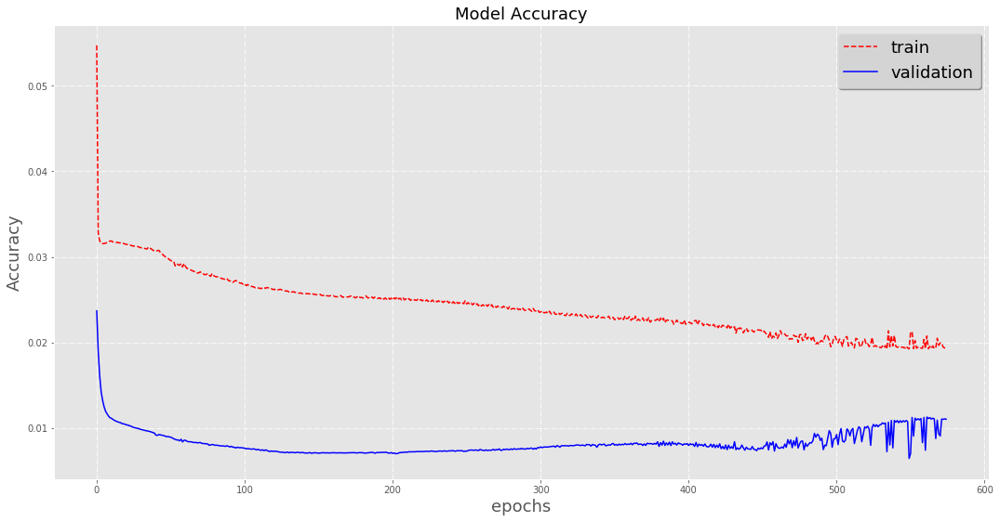


 Prediccion mes 7: 895607

 mes: 8
Grafica Entrenamiento


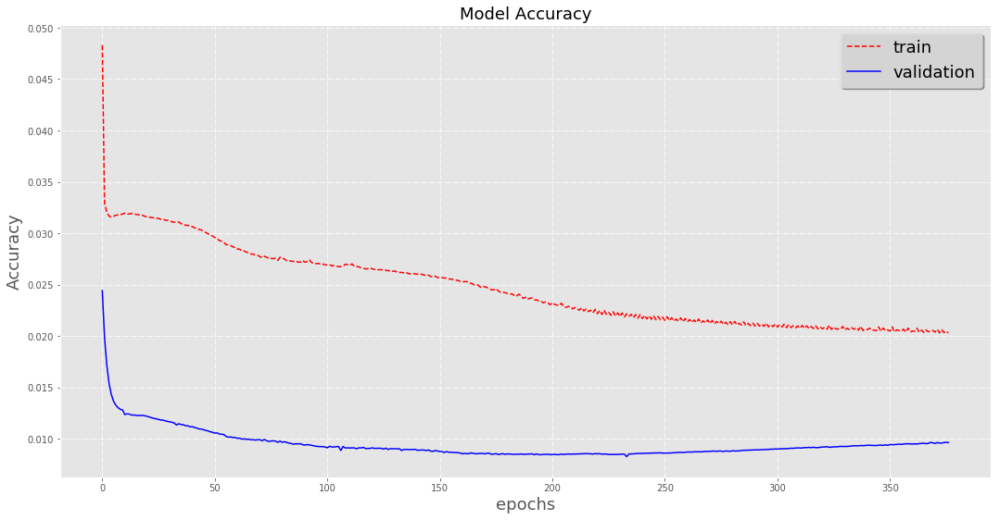


 Prediccion mes 8: 1055799

 mes: 9
Grafica Entrenamiento


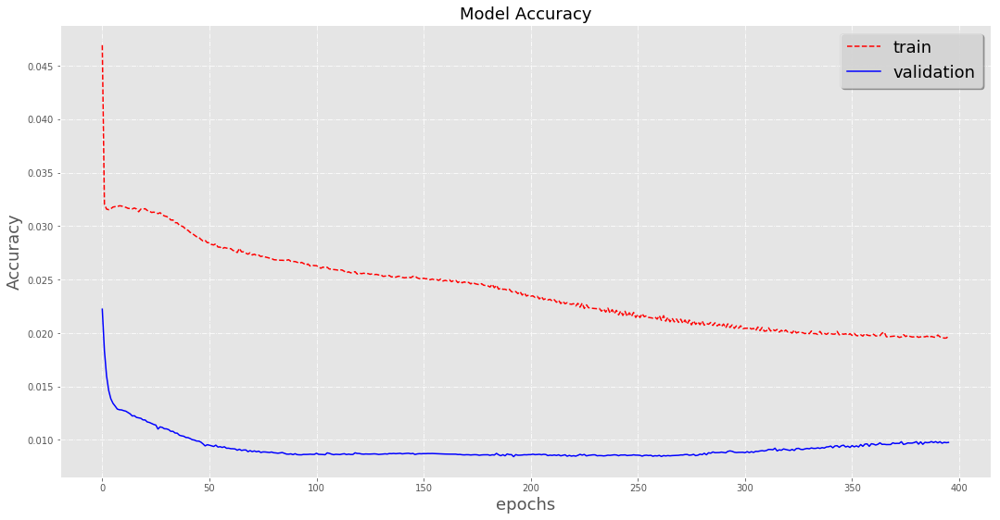


 Prediccion mes 9: 1057249

 mes: 10
Grafica Entrenamiento


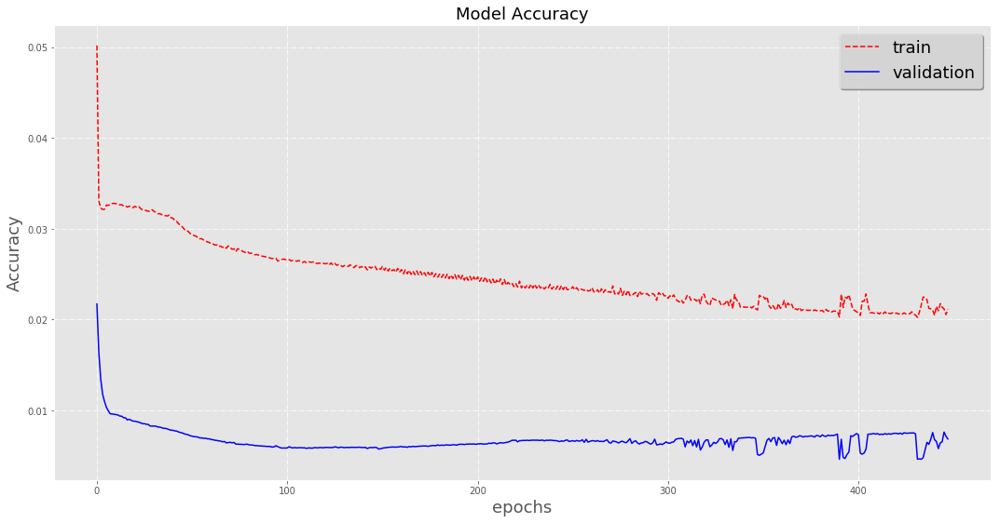


 Prediccion mes 10: 1072047

 mes: 11
Grafica Entrenamiento


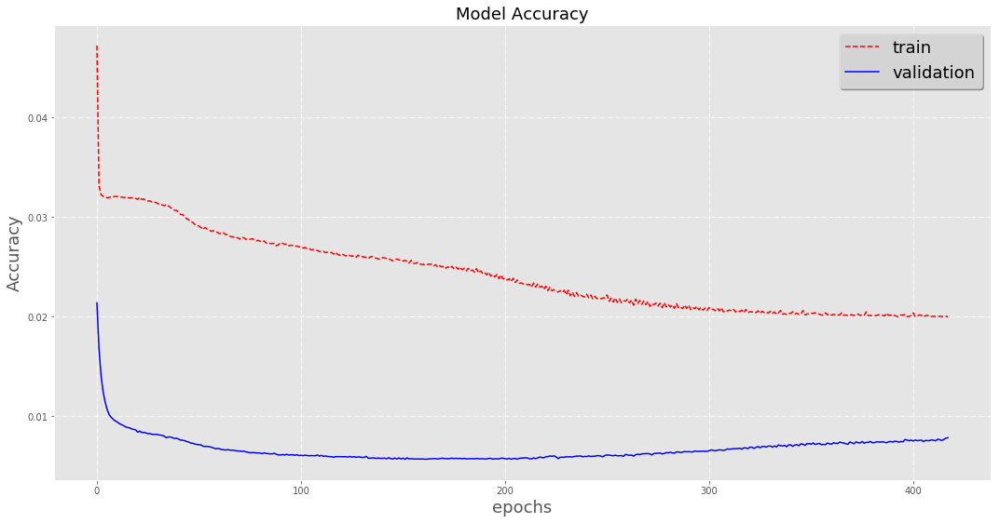


 Prediccion mes 11: 1055335

 mes: 12
Grafica Entrenamiento


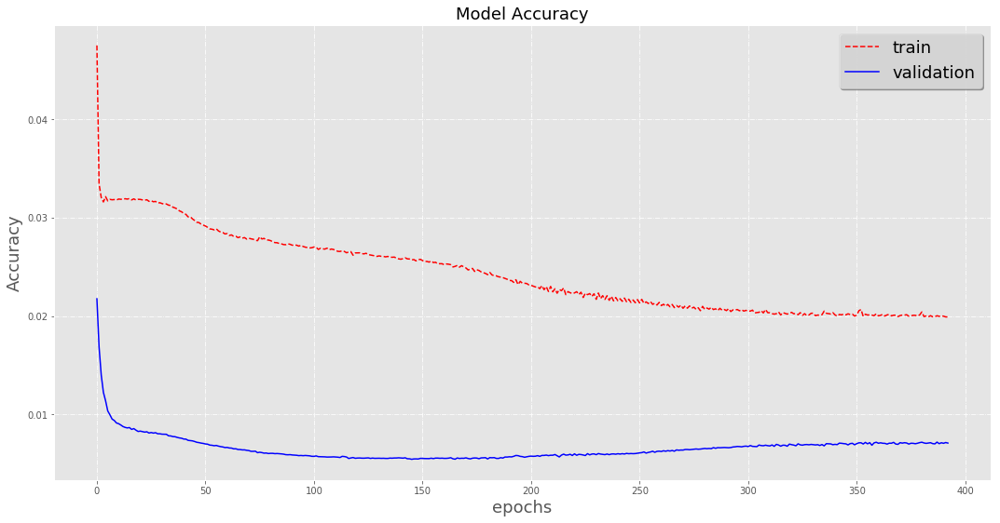


 Prediccion mes 12: 1057565

 Rmse:
[133806.3579059676, 131539.2823328799, 133041.54848197484, 124236.30352419367, 121647.35006617446, 121273.20942294614, 120921.05313950716]

 Mape:
[10.191203506277462, 10.336490961258182, 10.135944077277768, 9.3925606165499, 9.287639435215505, 9.35904463963404, 9.236488681111199]

 Smape:
[1.2005559072781014, 1.1871914918171274, 1.186196705498458, 1.1060900289507425, 1.084863813961006, 1.0799528705603452, 1.0783485021942856]

 Repeticion: 8

 mes: 1
Grafica Entrenamiento


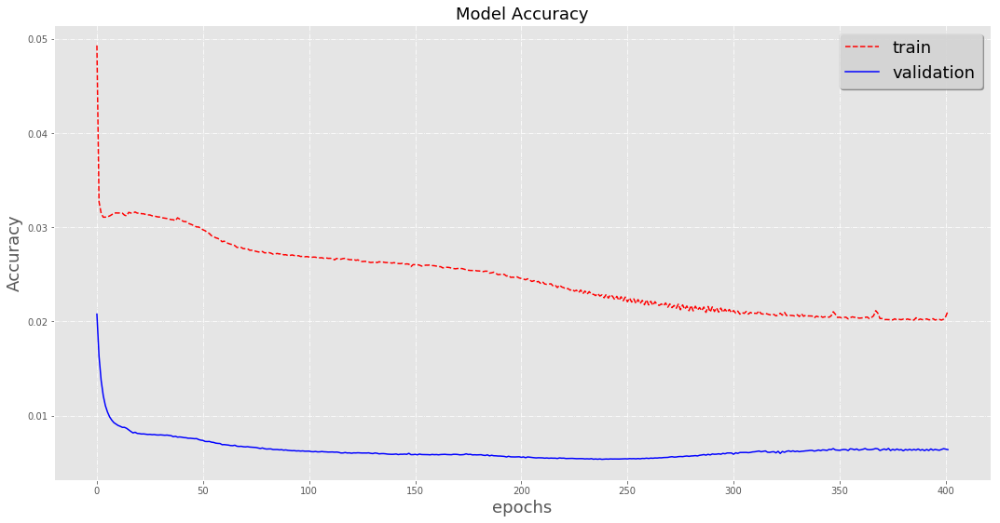


 Prediccion mes 1: 1074774

 mes: 2
Grafica Entrenamiento


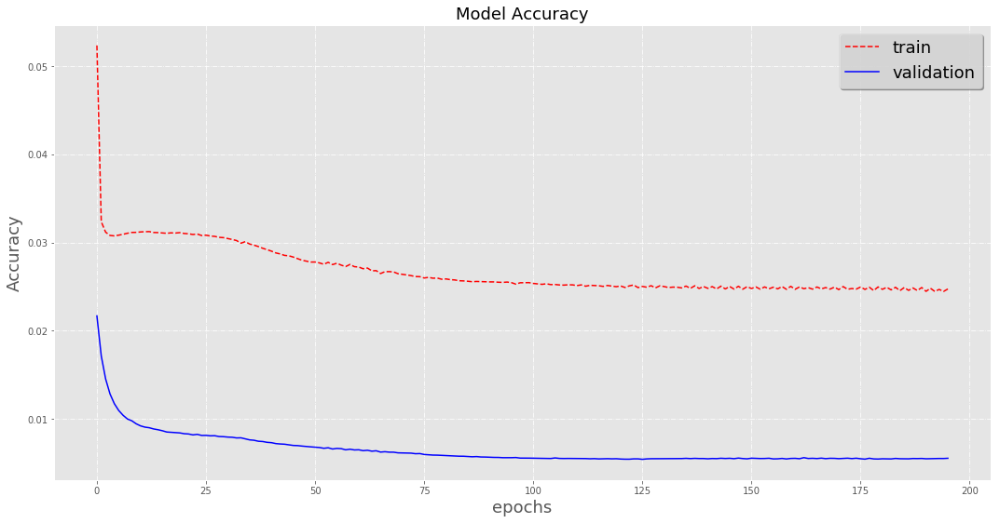


 Prediccion mes 2: 1048049

 mes: 3
Grafica Entrenamiento


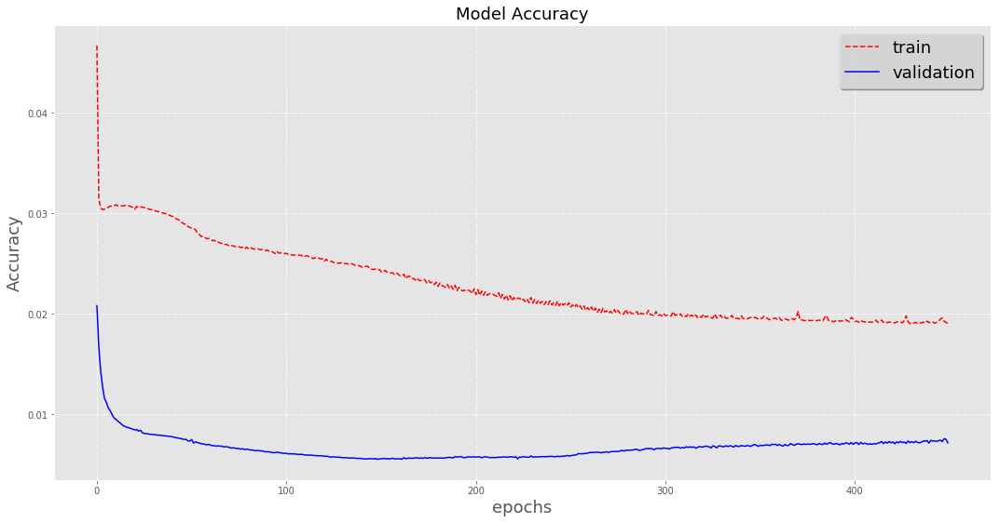


 Prediccion mes 3: 1054796

 mes: 4
Grafica Entrenamiento


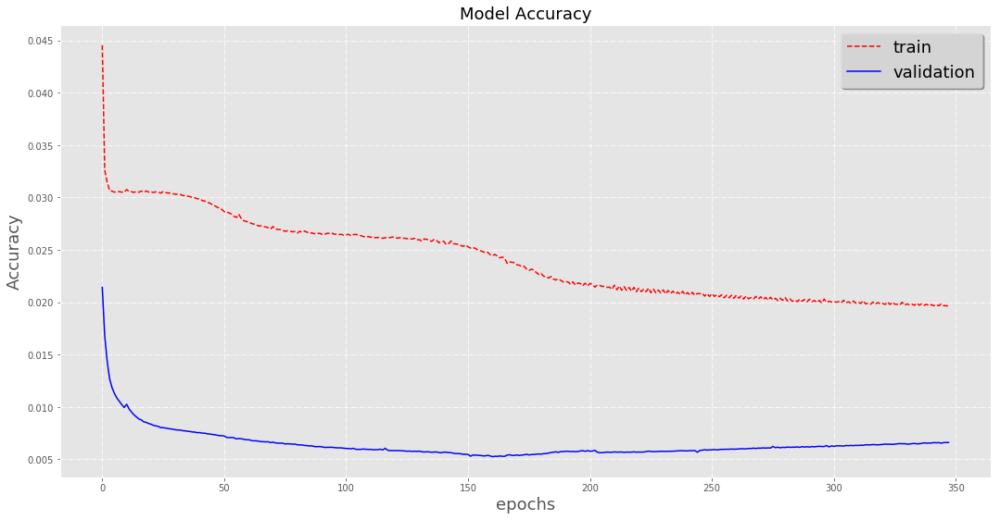


 Prediccion mes 4: 1040569

 mes: 5
Grafica Entrenamiento


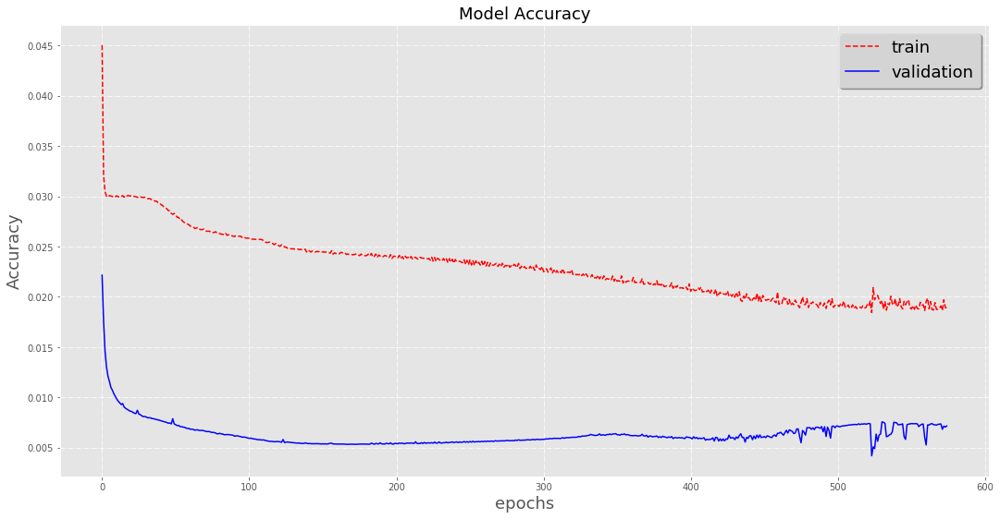


 Prediccion mes 5: 1048929

 mes: 6
Grafica Entrenamiento


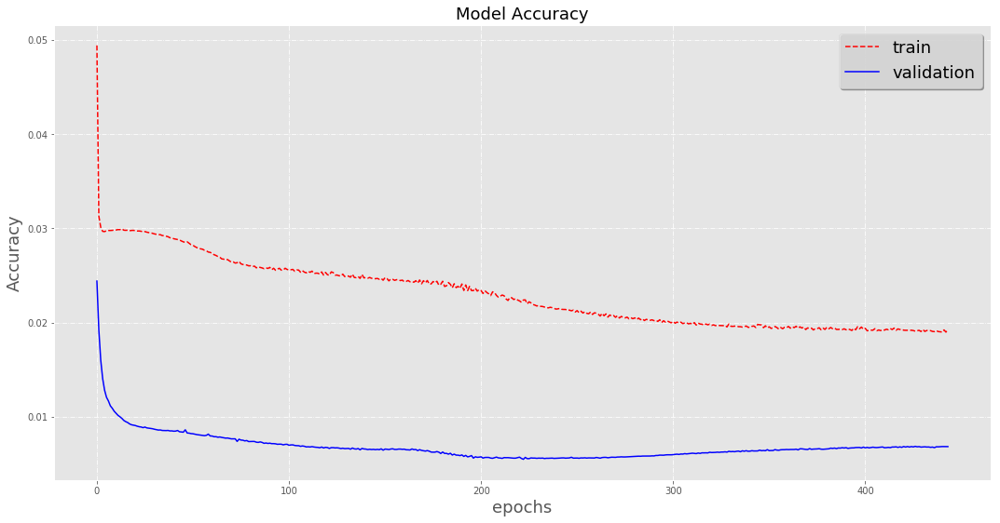


 Prediccion mes 6: 1056539

 mes: 7
Grafica Entrenamiento


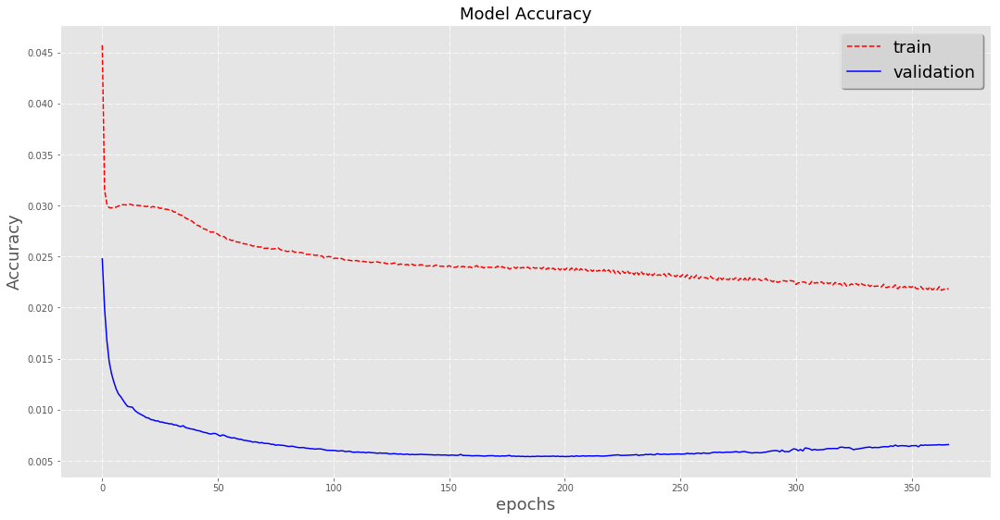


 Prediccion mes 7: 981447

 mes: 8
Grafica Entrenamiento


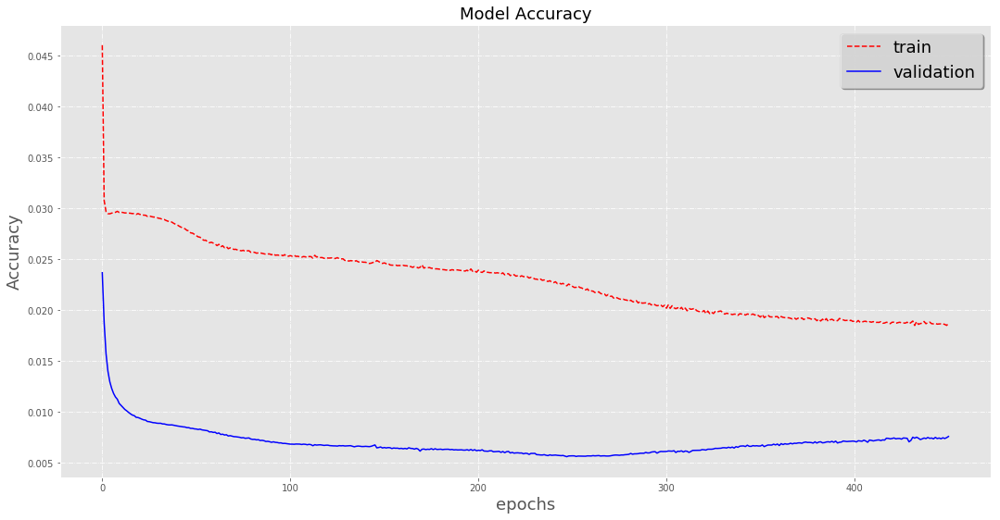


 Prediccion mes 8: 1025925

 mes: 9
Grafica Entrenamiento


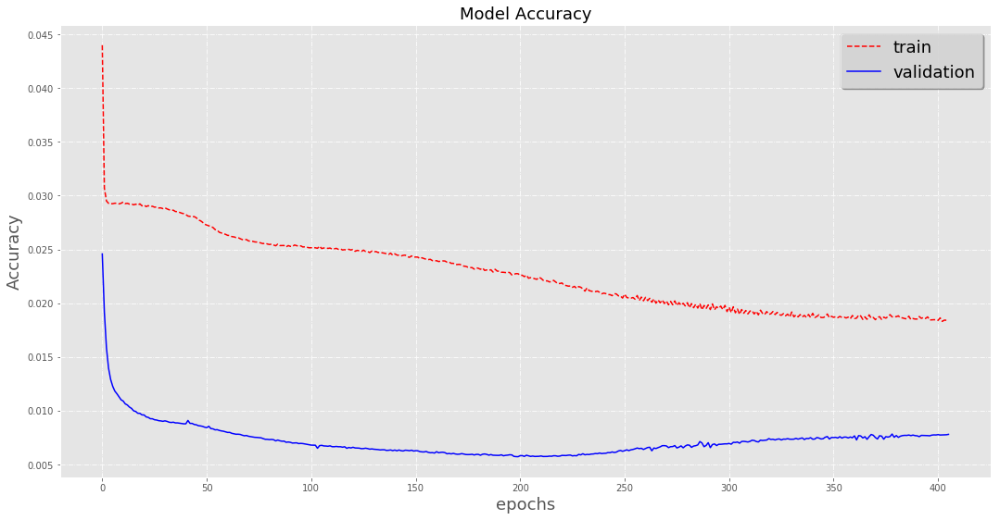


 Prediccion mes 9: 1058681

 mes: 10
Grafica Entrenamiento


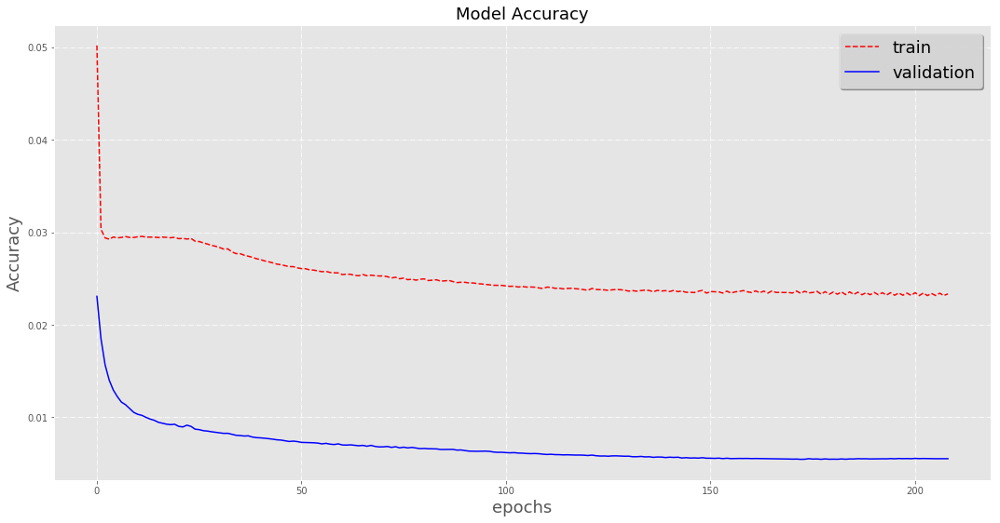


 Prediccion mes 10: 1053371

 mes: 11
Grafica Entrenamiento


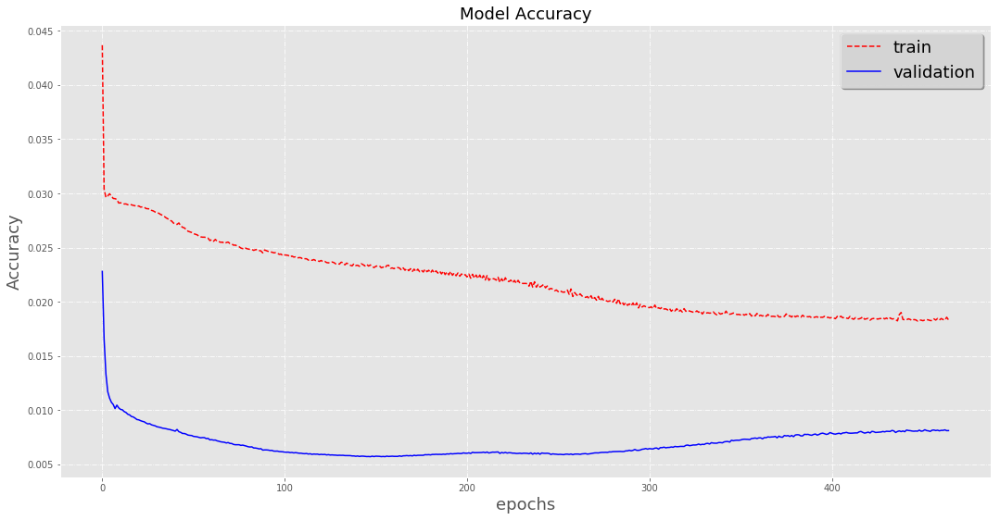


 Prediccion mes 11: 1037167

 mes: 12
Grafica Entrenamiento


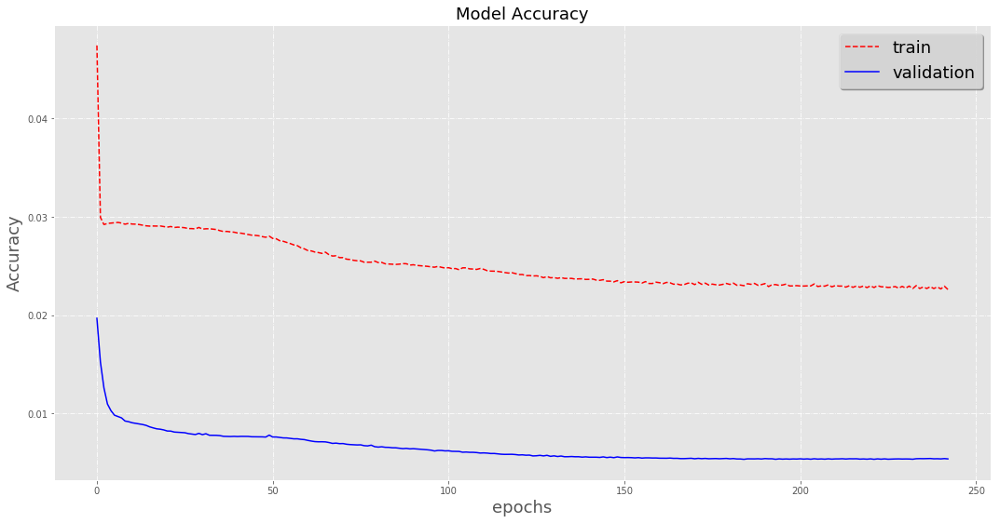


 Prediccion mes 12: 1043579

 Rmse:
[133806.3579059676, 131539.2823328799, 133041.54848197484, 124236.30352419367, 121647.35006617446, 121273.20942294614, 120921.05313950716, 114225.44920415529]

 Mape:
[10.191203506277462, 10.336490961258182, 10.135944077277768, 9.3925606165499, 9.287639435215505, 9.35904463963404, 9.236488681111199, 8.608541449158475]

 Smape:
[1.2005559072781014, 1.1871914918171274, 1.186196705498458, 1.1060900289507425, 1.084863813961006, 1.0799528705603452, 1.0783485021942856, 0.9995943415287645]

 Repeticion: 9

 mes: 1
Grafica Entrenamiento


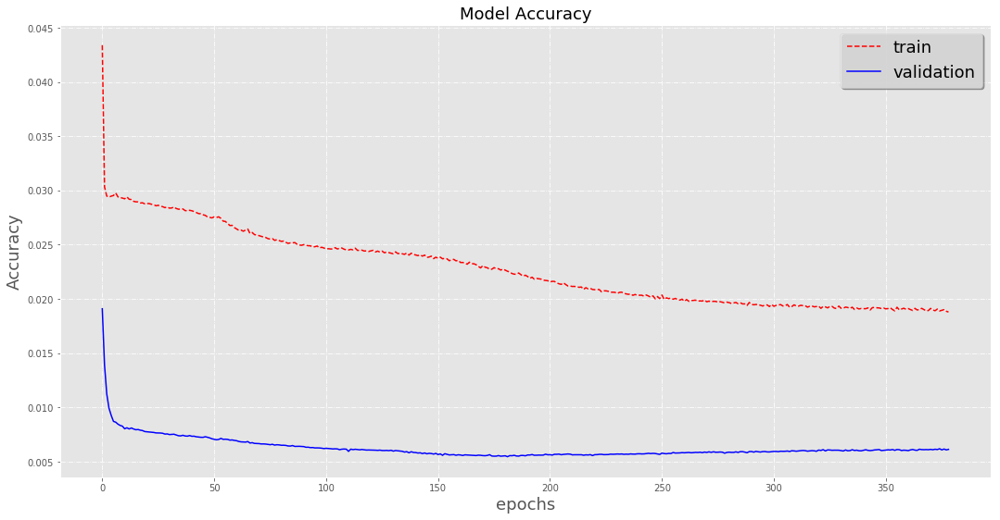


 Prediccion mes 1: 1045190

 mes: 2
Grafica Entrenamiento


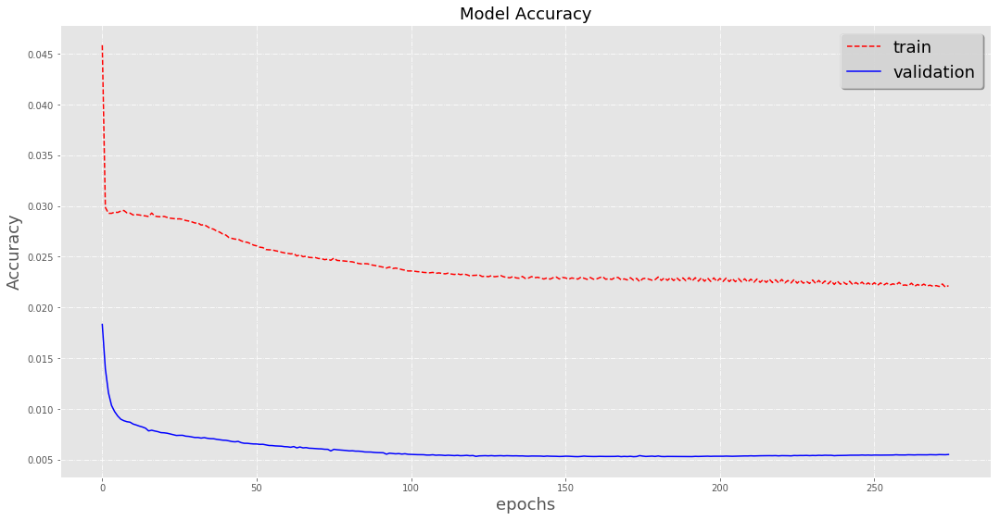


 Prediccion mes 2: 1034546

 mes: 3
Grafica Entrenamiento


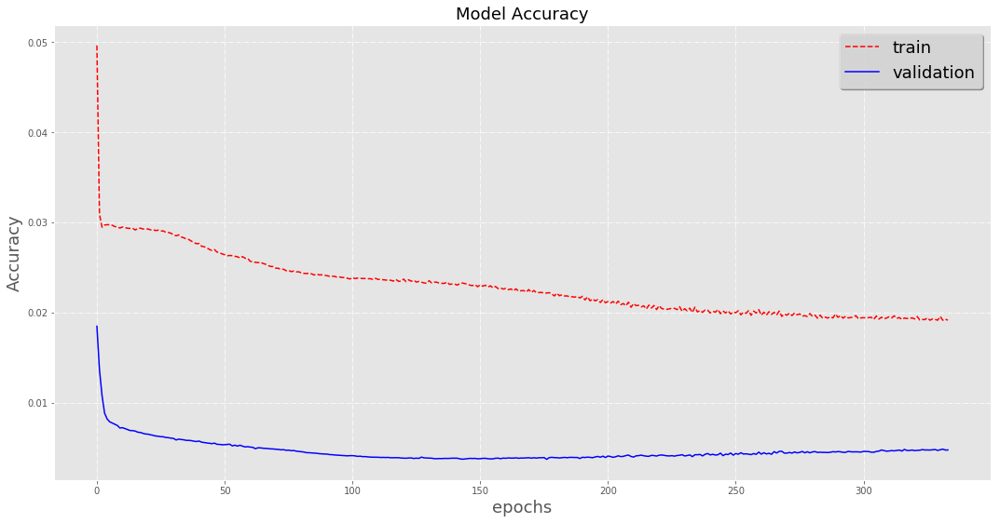


 Prediccion mes 3: 1054783

 mes: 4
Grafica Entrenamiento


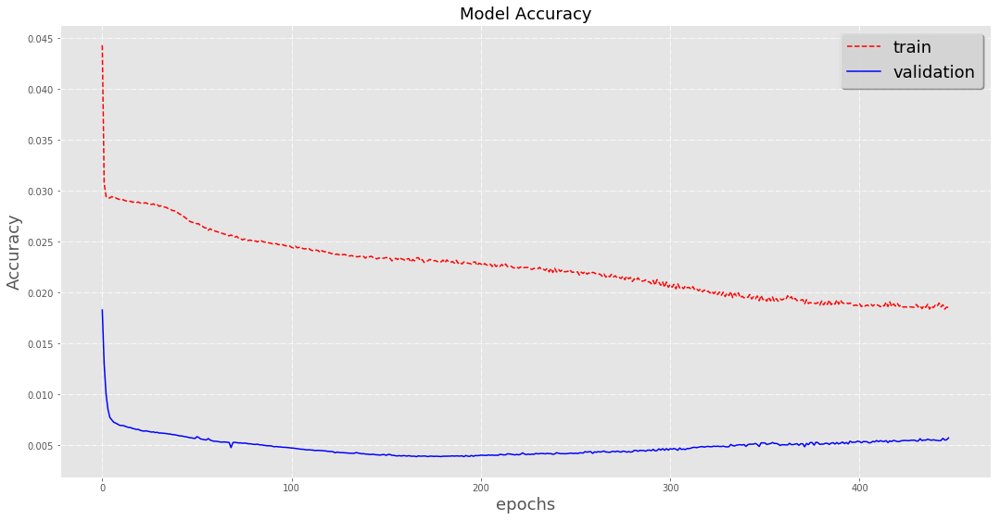


 Prediccion mes 4: 1038311

 mes: 5
Grafica Entrenamiento


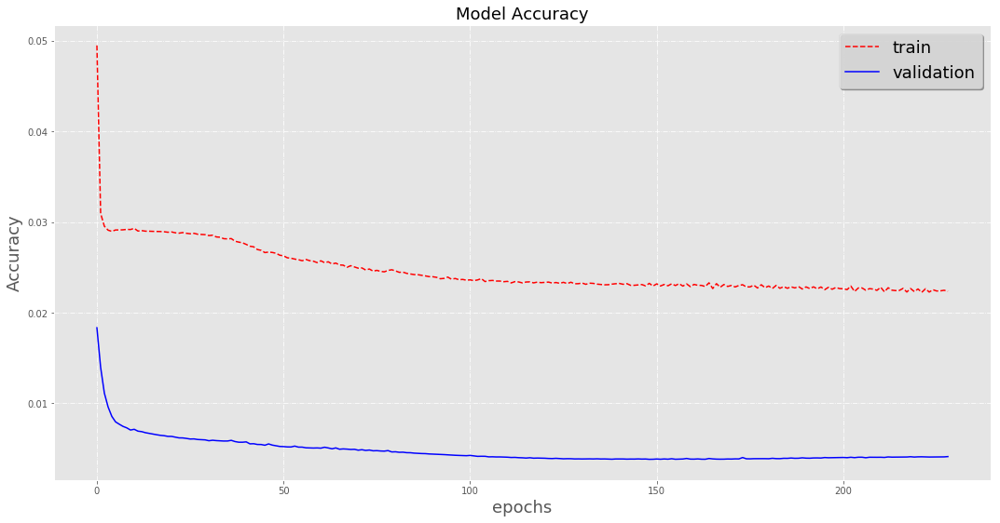


 Prediccion mes 5: 1037024

 mes: 6
Grafica Entrenamiento


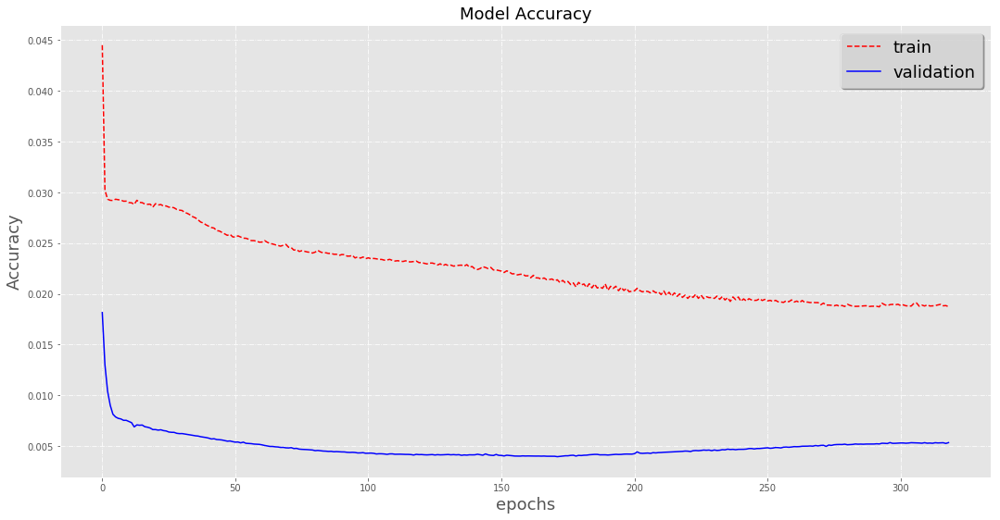


 Prediccion mes 6: 1055735

 mes: 7
Grafica Entrenamiento


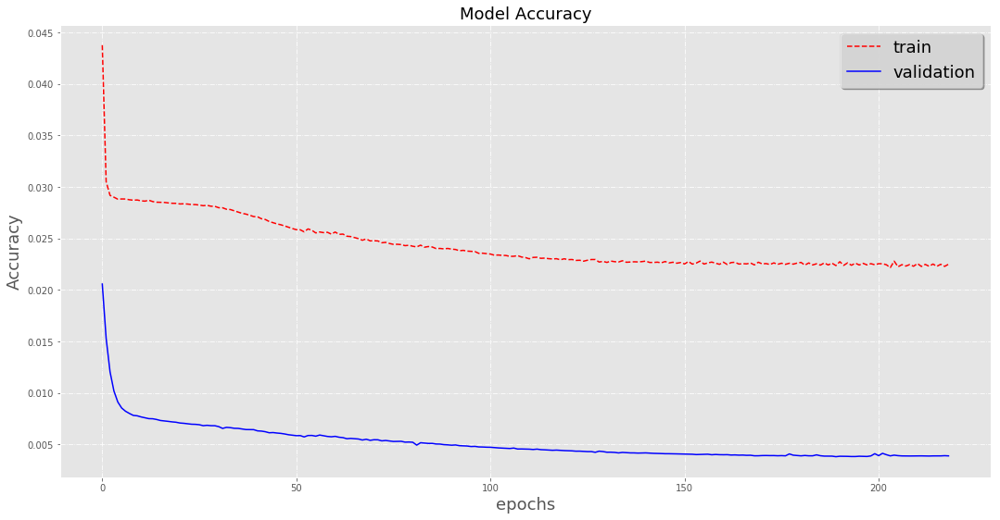


 Prediccion mes 7: 1018348

 mes: 8
Grafica Entrenamiento


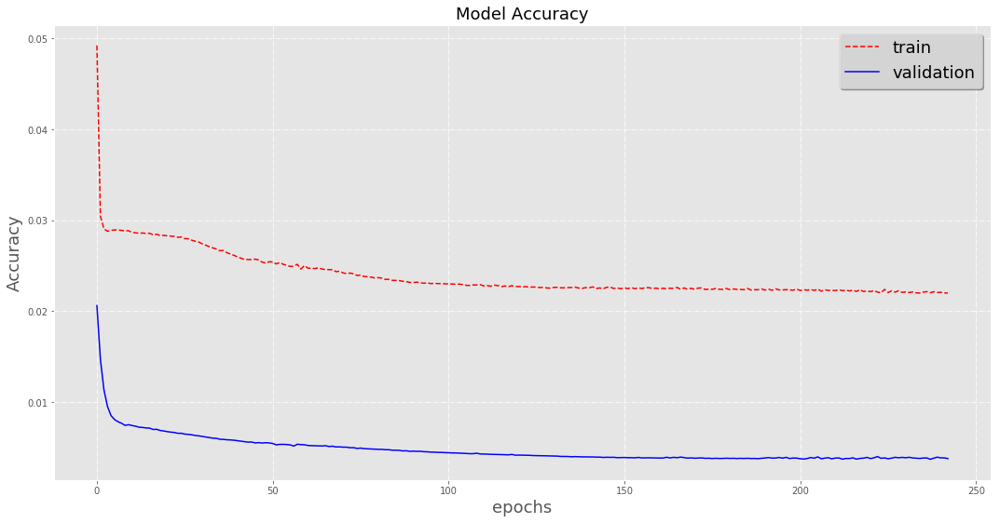


 Prediccion mes 8: 1033488

 mes: 9
Grafica Entrenamiento


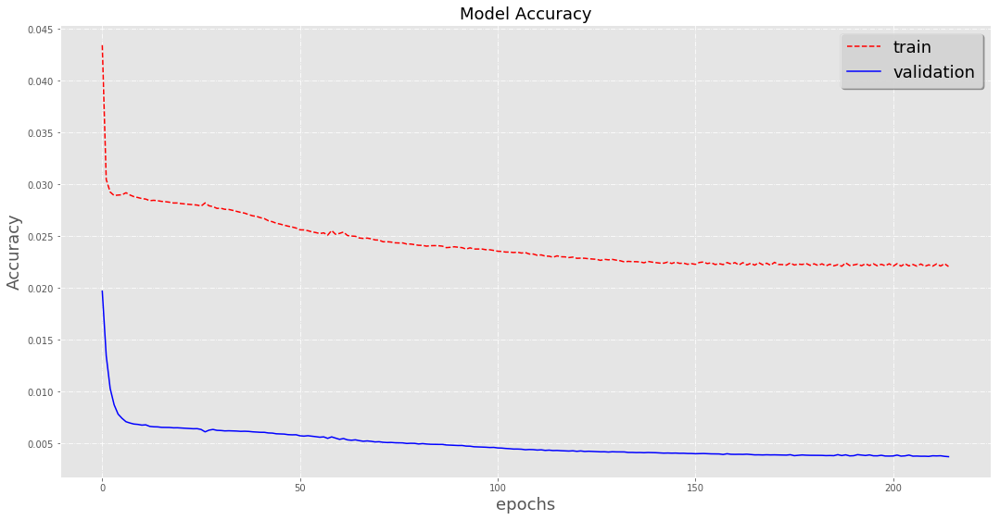


 Prediccion mes 9: 1036520

 mes: 10
Grafica Entrenamiento


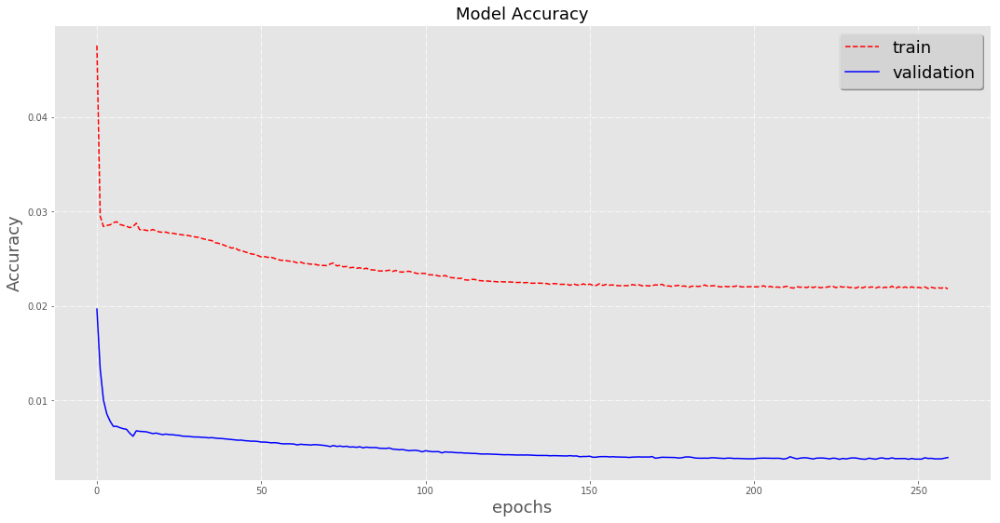


 Prediccion mes 10: 1049499

 mes: 11
Grafica Entrenamiento


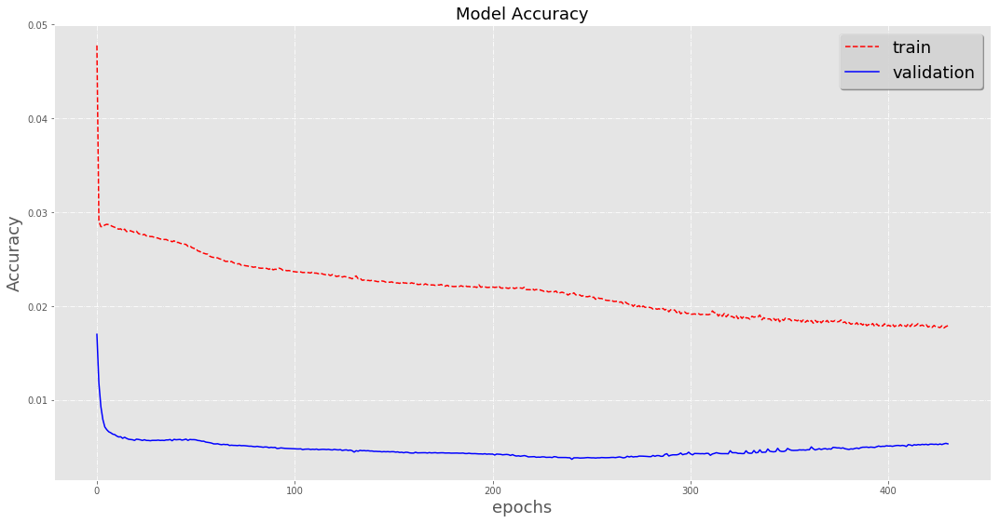


 Prediccion mes 11: 1037237

 mes: 12
Grafica Entrenamiento


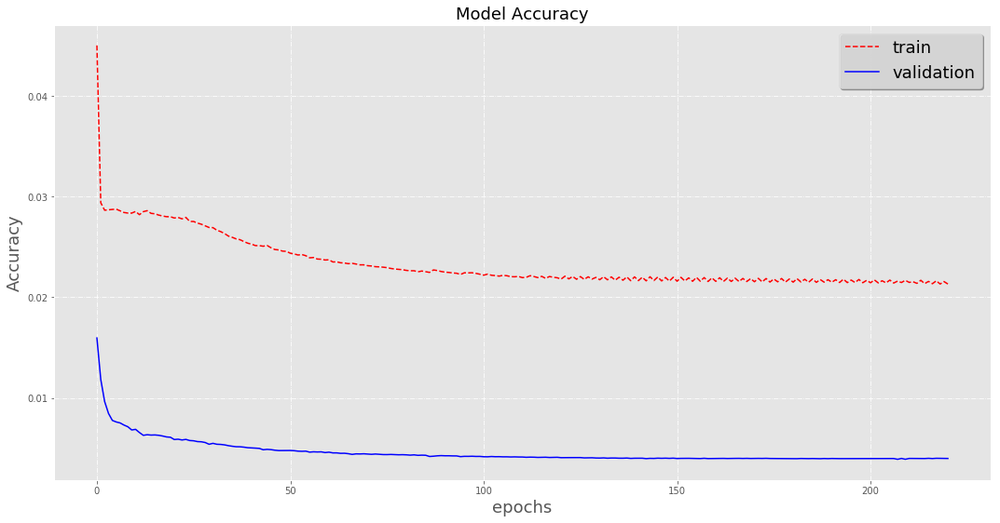


 Prediccion mes 12: 1040159

 Rmse:
[133806.3579059676, 131539.2823328799, 133041.54848197484, 124236.30352419367, 121647.35006617446, 121273.20942294614, 120921.05313950716, 114225.44920415529, 112582.91325304446]

 Mape:
[10.191203506277462, 10.336490961258182, 10.135944077277768, 9.3925606165499, 9.287639435215505, 9.35904463963404, 9.236488681111199, 8.608541449158475, 8.434058896339002]

 Smape:
[1.2005559072781014, 1.1871914918171274, 1.186196705498458, 1.1060900289507425, 1.084863813961006, 1.0799528705603452, 1.0783485021942856, 0.9995943415287645, 0.9819893707913875]

 Repeticion: 10

 mes: 1
Grafica Entrenamiento


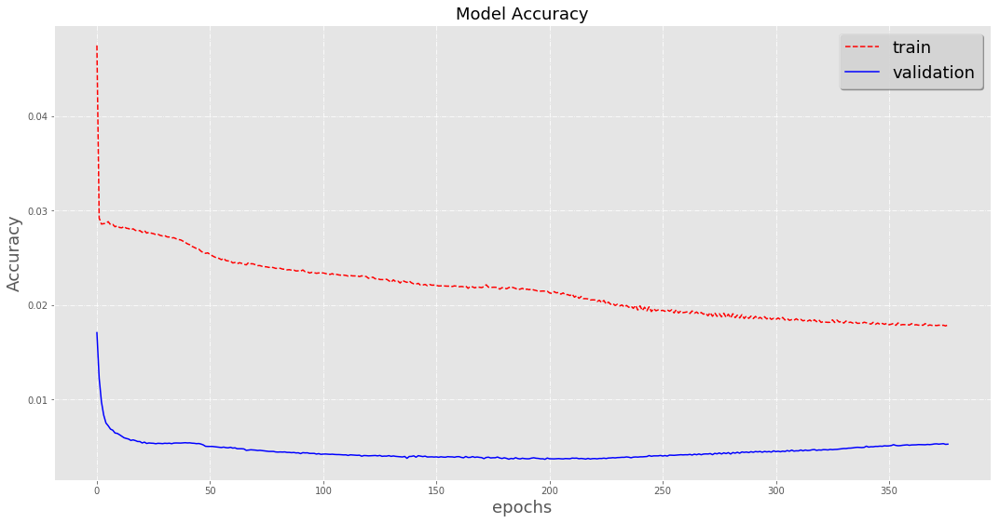


 Prediccion mes 1: 1035798

 mes: 2
Grafica Entrenamiento


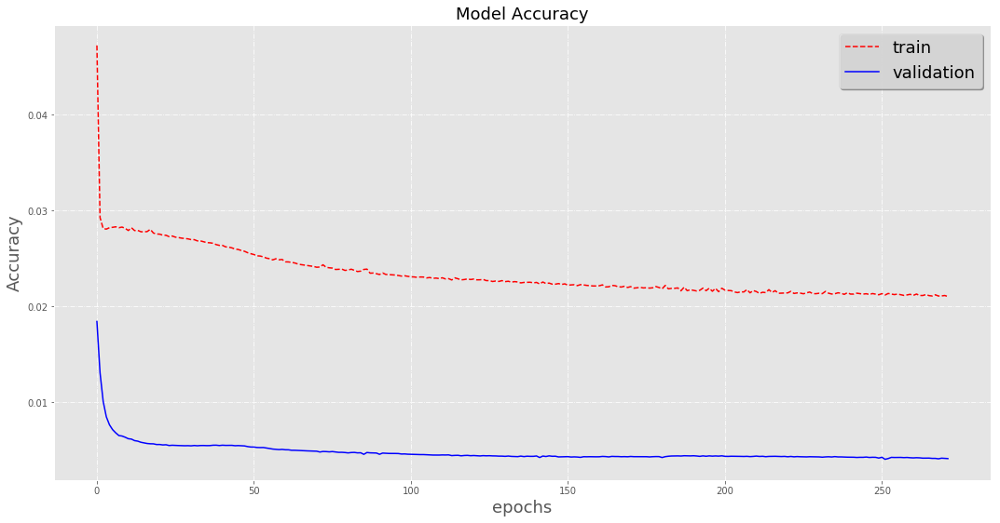


 Prediccion mes 2: 1036327

 mes: 3
Grafica Entrenamiento


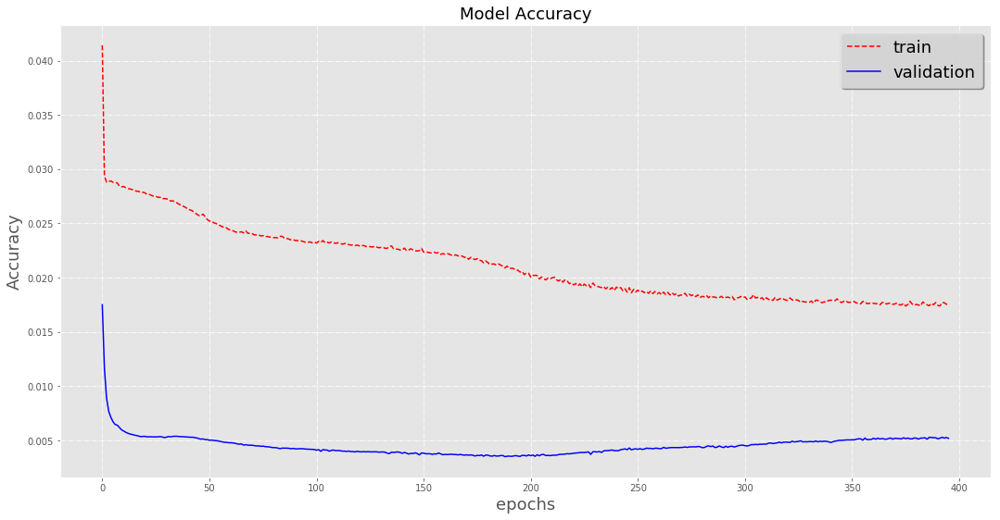


 Prediccion mes 3: 1048952

 mes: 4
Grafica Entrenamiento


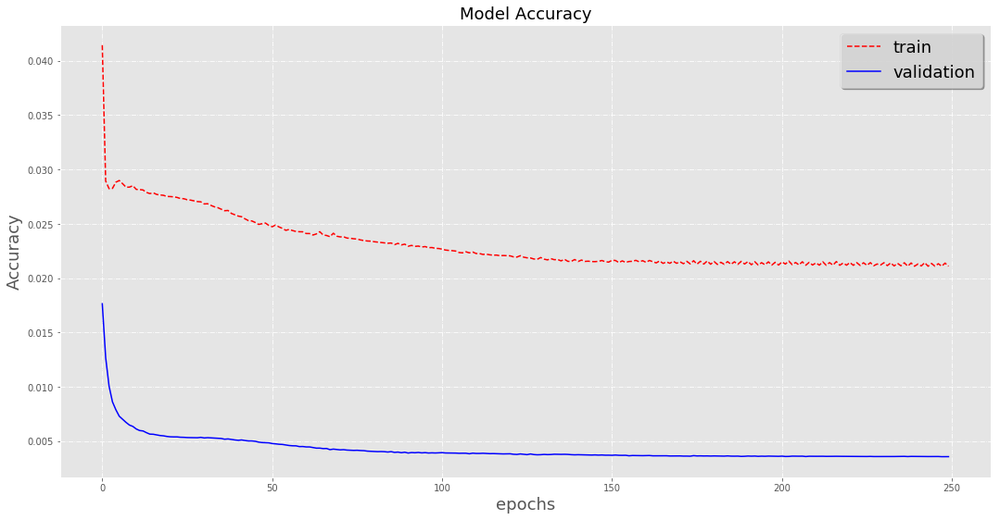


 Prediccion mes 4: 1050730

 mes: 5
Grafica Entrenamiento


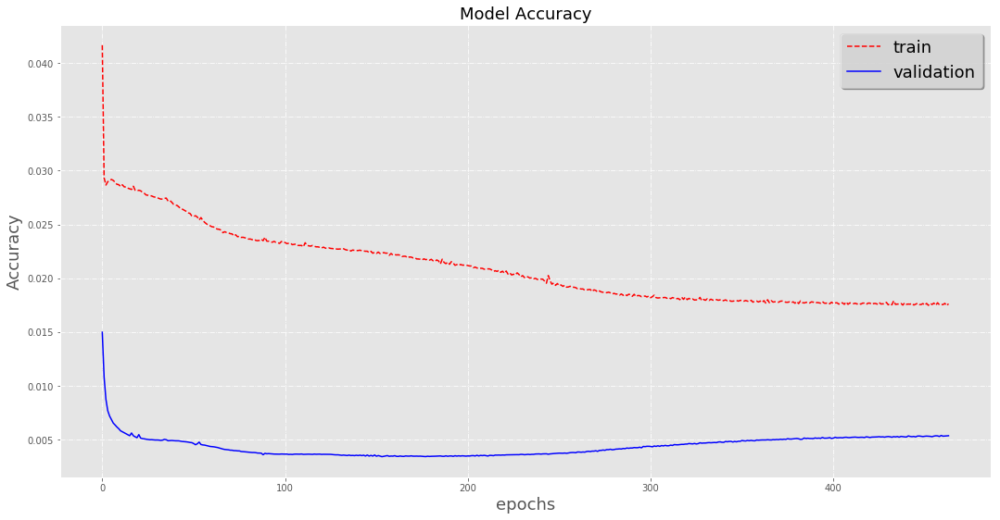


 Prediccion mes 5: 1028596

 mes: 6
Grafica Entrenamiento


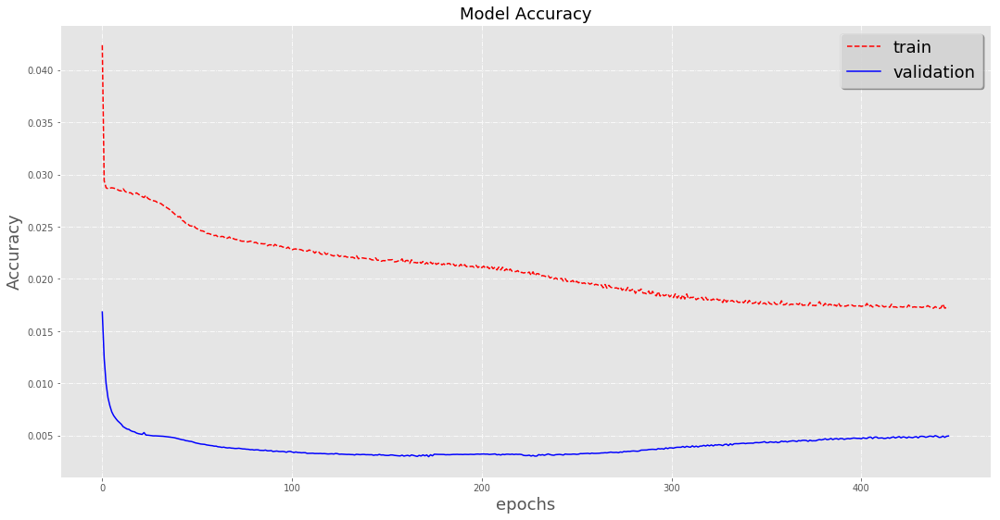


 Prediccion mes 6: 1056583

 mes: 7
Grafica Entrenamiento


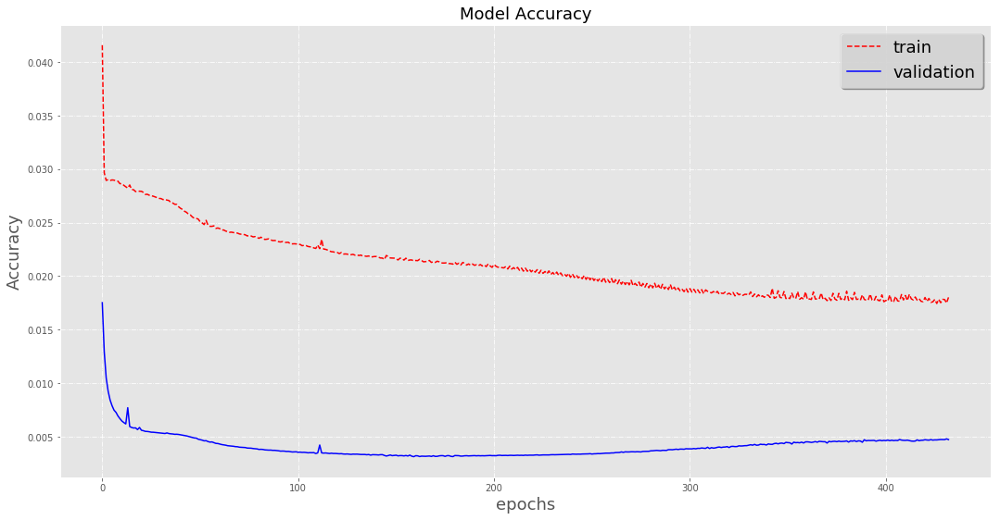


 Prediccion mes 7: 943717

 mes: 8
Grafica Entrenamiento


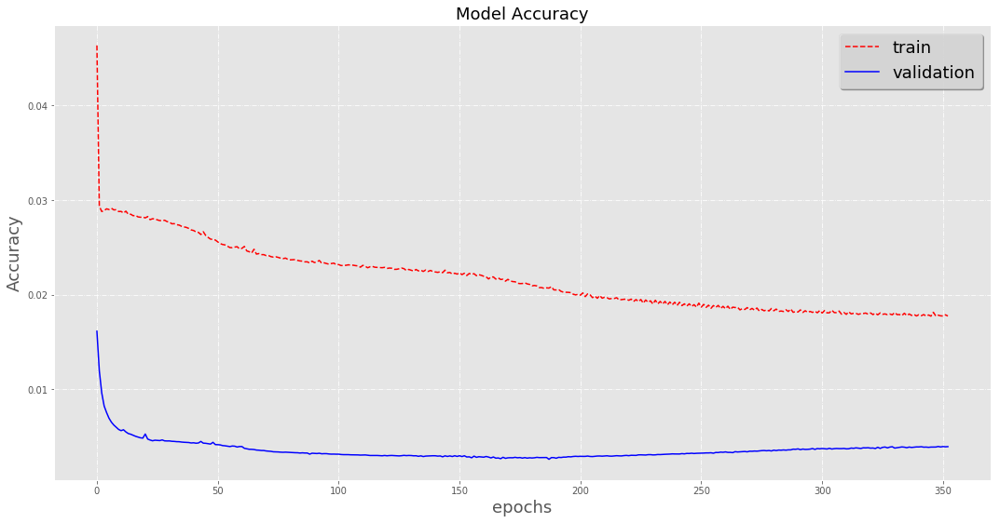


 Prediccion mes 8: 1034478

 mes: 9
Grafica Entrenamiento


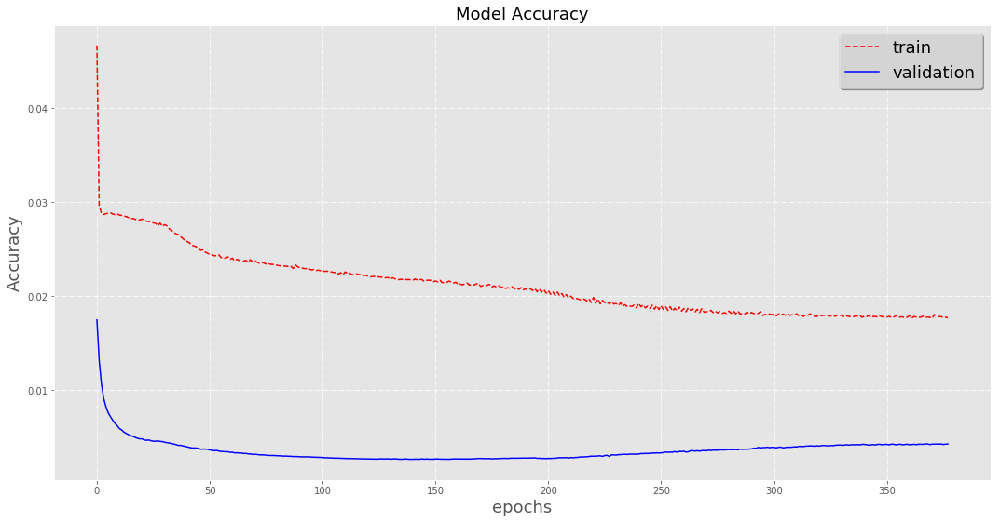


 Prediccion mes 9: 1050452

 mes: 10
Grafica Entrenamiento


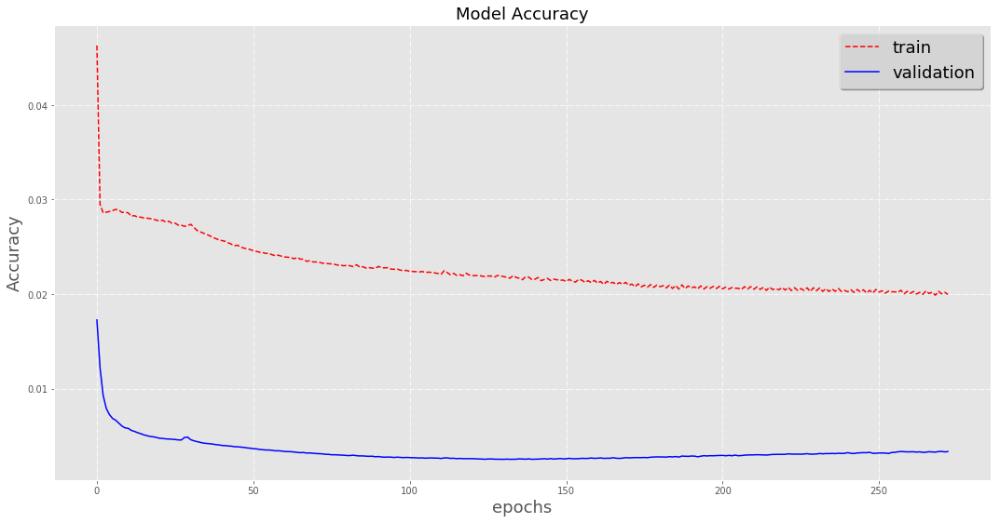


 Prediccion mes 10: 1044859

 mes: 11
Grafica Entrenamiento


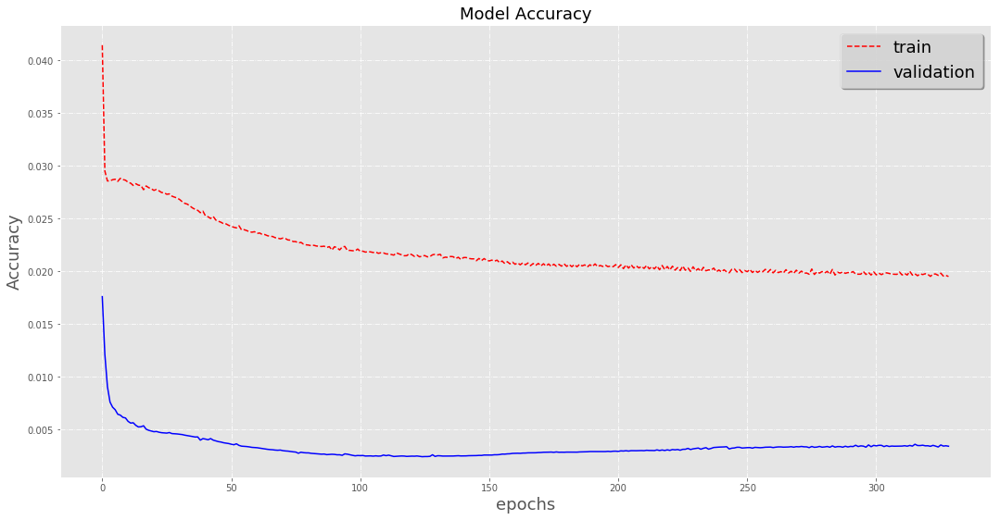


 Prediccion mes 11: 1044197

 mes: 12
Grafica Entrenamiento


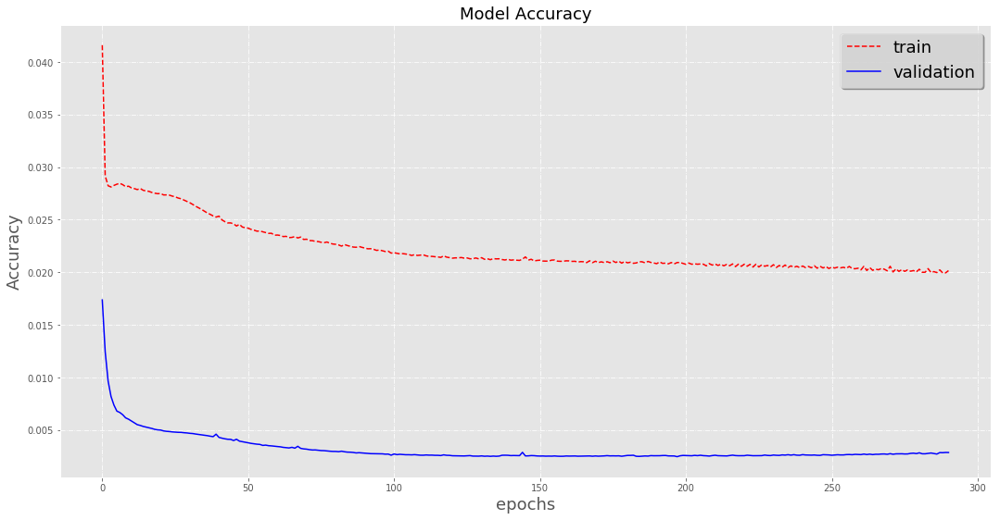


 Prediccion mes 12: 1038359

 Rmse:
[133806.3579059676, 131539.2823328799, 133041.54848197484, 124236.30352419367, 121647.35006617446, 121273.20942294614, 120921.05313950716, 114225.44920415529, 112582.91325304446, 116064.75348368617]

 Mape:
[10.191203506277462, 10.336490961258182, 10.135944077277768, 9.3925606165499, 9.287639435215505, 9.35904463963404, 9.236488681111199, 8.608541449158475, 8.434058896339002, 8.74516280501611]

 Smape:
[1.2005559072781014, 1.1871914918171274, 1.186196705498458, 1.1060900289507425, 1.084863813961006, 1.0799528705603452, 1.0783485021942856, 0.9995943415287645, 0.9819893707913875, 1.02612788287539]

 Repeticion: 11

 mes: 1
Grafica Entrenamiento


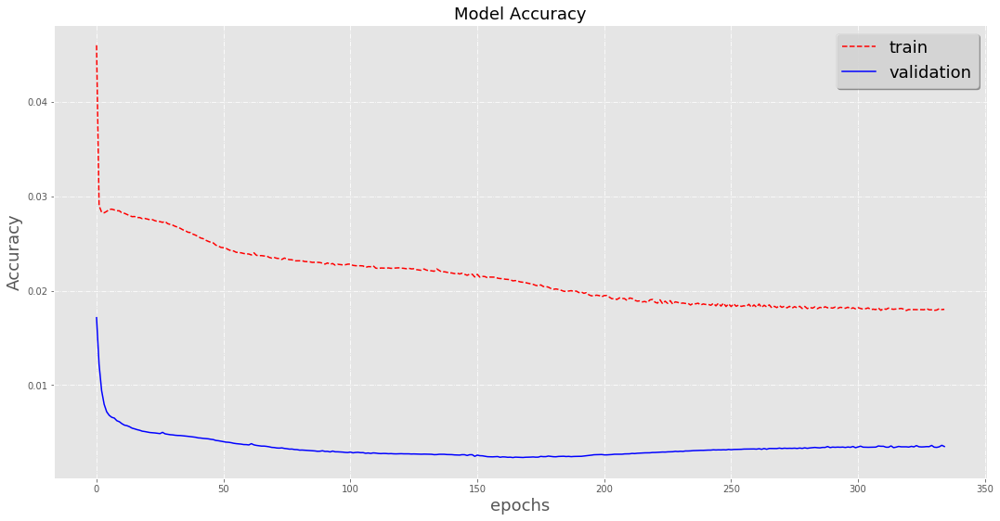


 Prediccion mes 1: 1059471

 mes: 2
Grafica Entrenamiento


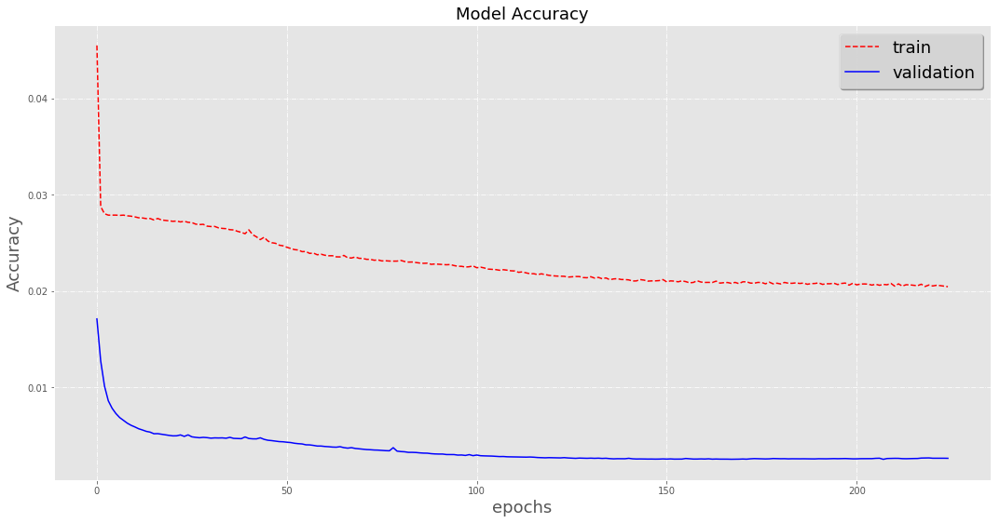


 Prediccion mes 2: 1038277

 mes: 3
Grafica Entrenamiento


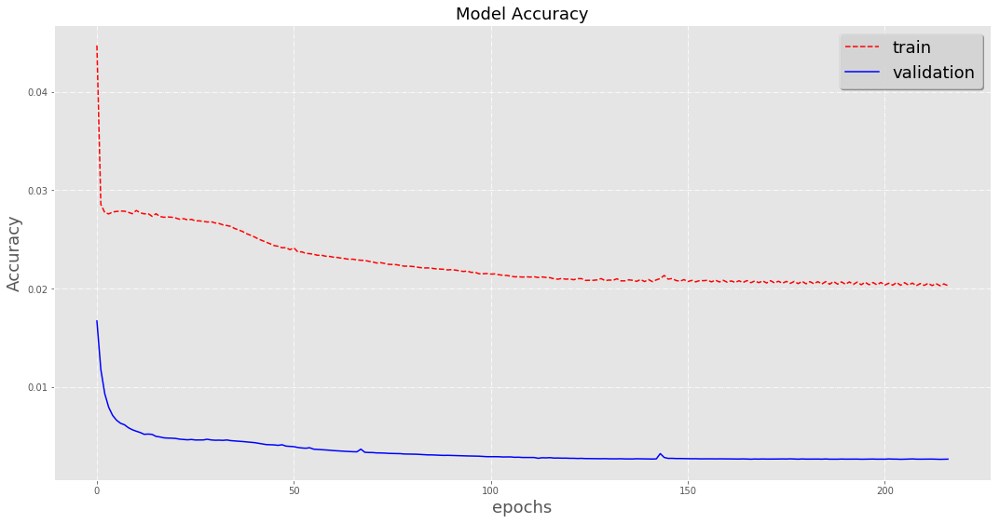


 Prediccion mes 3: 1042286

 mes: 4
Grafica Entrenamiento


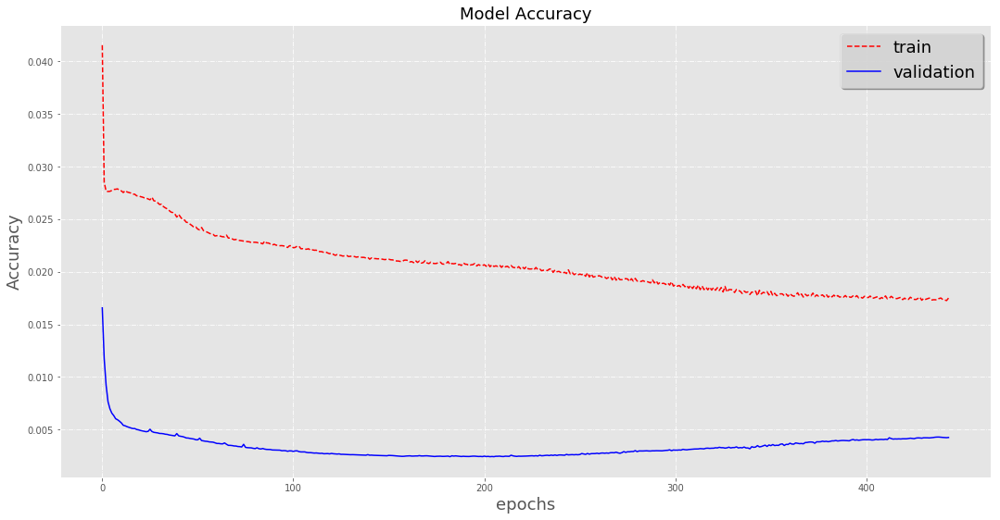


 Prediccion mes 4: 1063557

 mes: 5
Grafica Entrenamiento


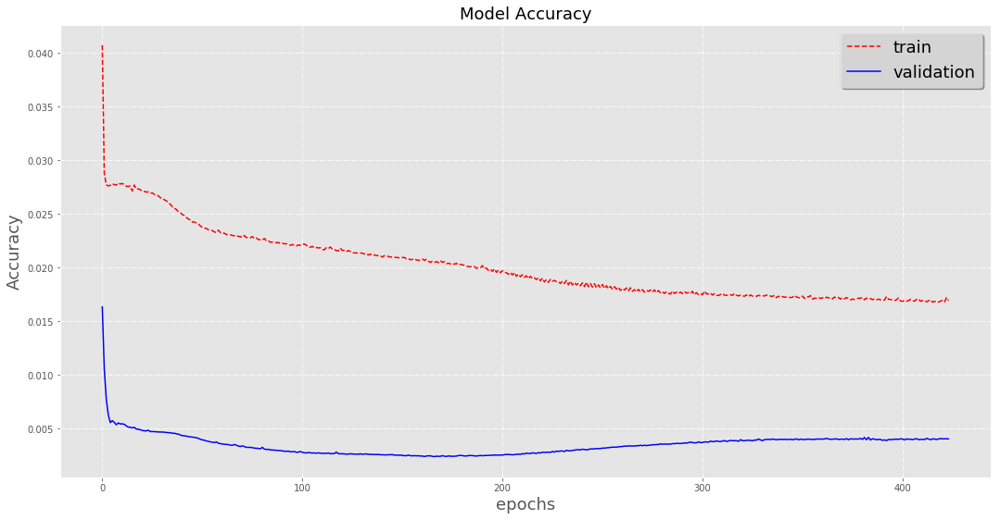


 Prediccion mes 5: 1043207

 mes: 6
Grafica Entrenamiento


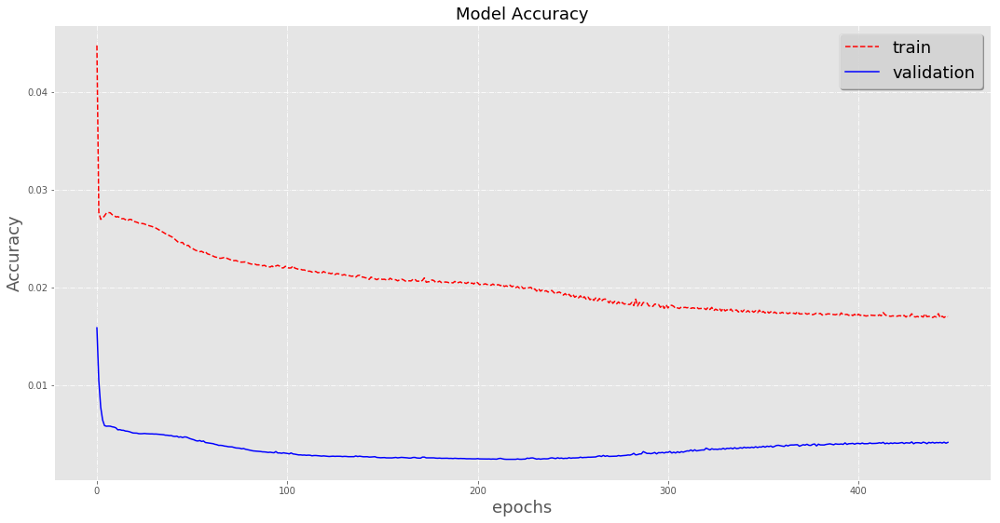


 Prediccion mes 6: 1059165

 mes: 7
Grafica Entrenamiento


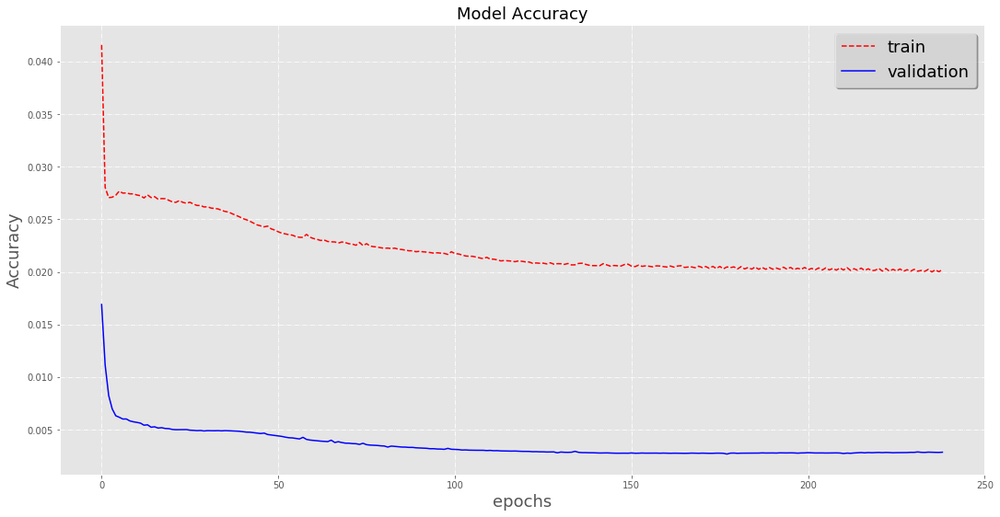


 Prediccion mes 7: 1018443

 mes: 8
Grafica Entrenamiento


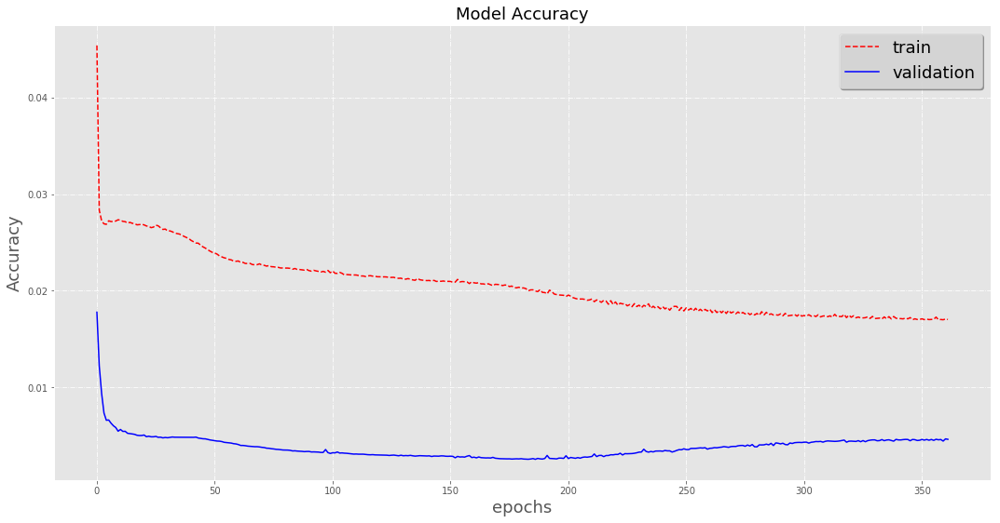


 Prediccion mes 8: 1041287

 mes: 9
Grafica Entrenamiento


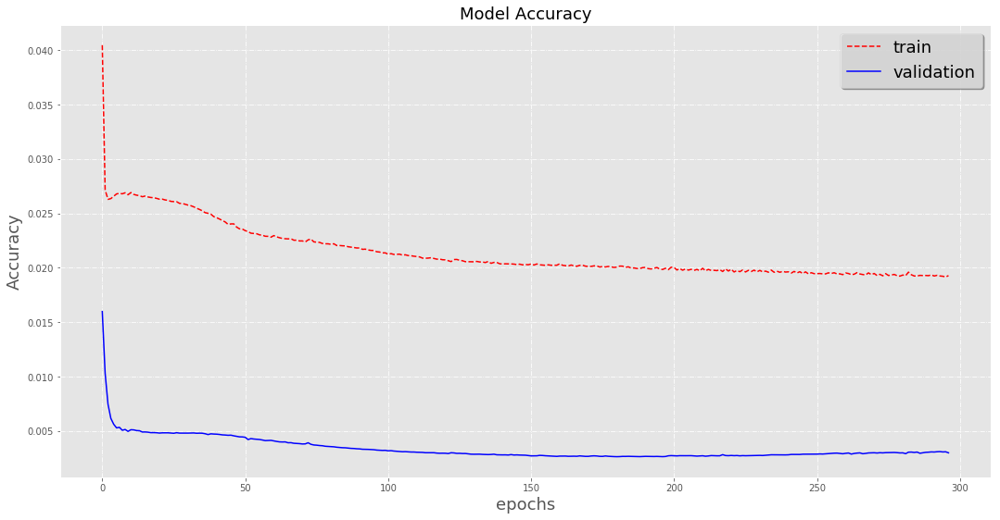


 Prediccion mes 9: 1057645

 mes: 10
Grafica Entrenamiento


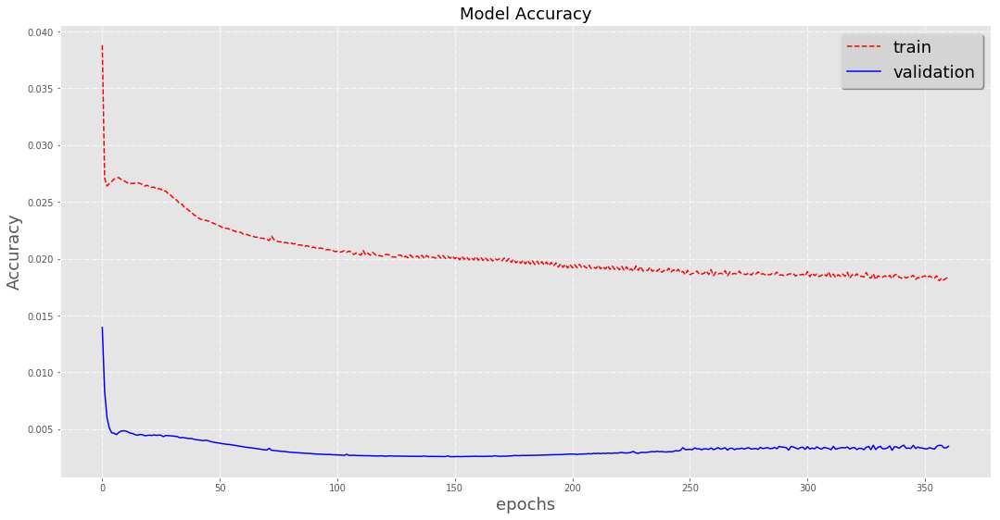


 Prediccion mes 10: 1055487

 mes: 11
Grafica Entrenamiento


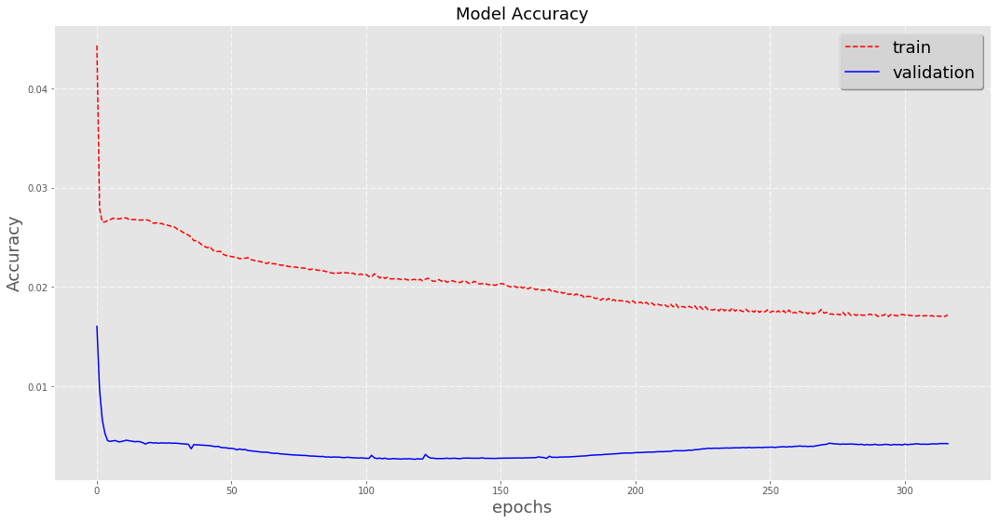


 Prediccion mes 11: 1062119

 mes: 12
Grafica Entrenamiento


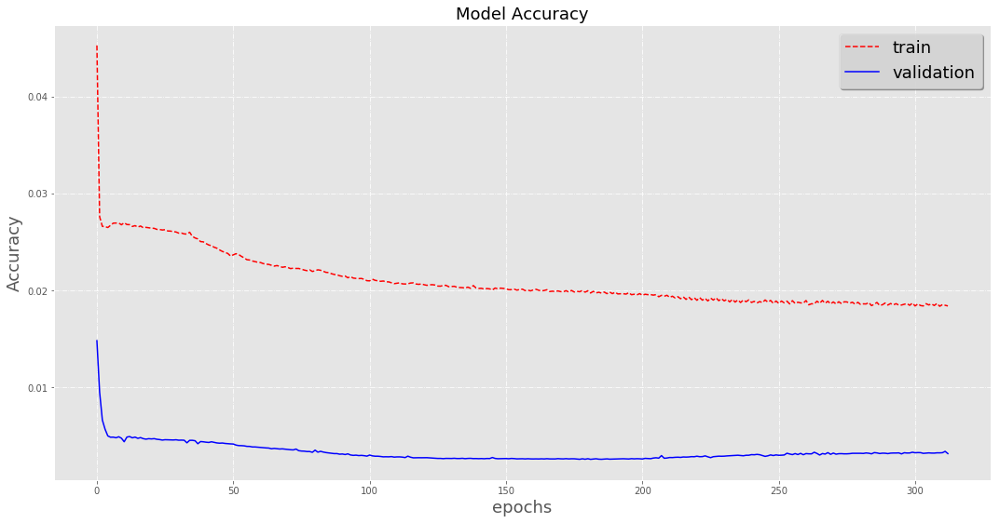


 Prediccion mes 12: 1055137

 Rmse:
[133806.3579059676, 131539.2823328799, 133041.54848197484, 124236.30352419367, 121647.35006617446, 121273.20942294614, 120921.05313950716, 114225.44920415529, 112582.91325304446, 116064.75348368617, 112893.40392605156]

 Mape:
[10.191203506277462, 10.336490961258182, 10.135944077277768, 9.3925606165499, 9.287639435215505, 9.35904463963404, 9.236488681111199, 8.608541449158475, 8.434058896339002, 8.74516280501611, 8.55565982409462]

 Smape:
[1.2005559072781014, 1.1871914918171274, 1.186196705498458, 1.1060900289507425, 1.084863813961006, 1.0799528705603452, 1.0783485021942856, 0.9995943415287645, 0.9819893707913875, 1.02612788287539, 0.9871135503994168]

 Repeticion: 12

 mes: 1
Grafica Entrenamiento


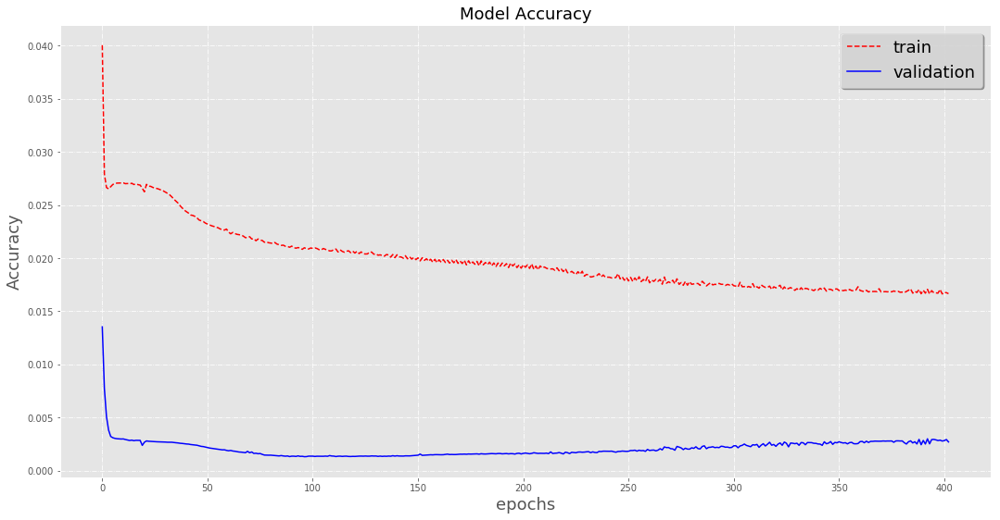


 Prediccion mes 1: 1073469

 mes: 2
Grafica Entrenamiento


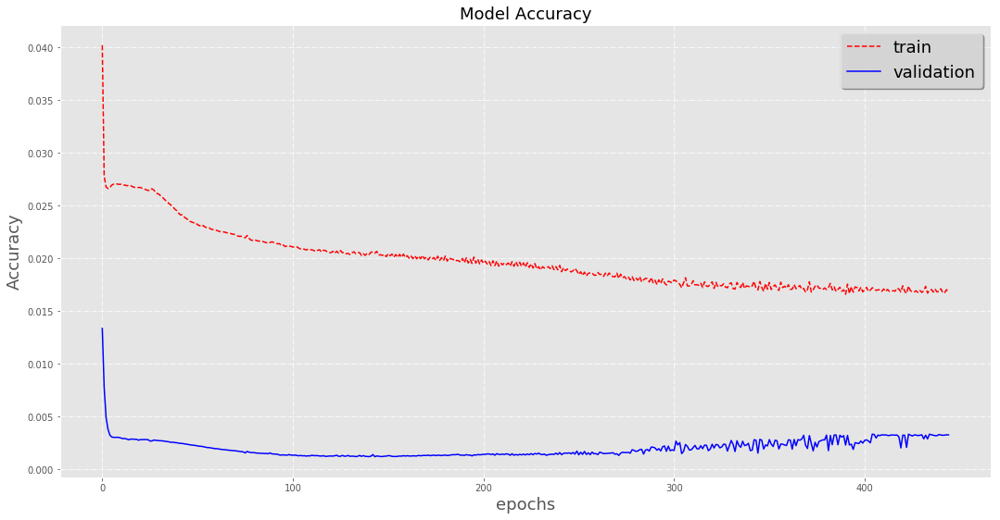


 Prediccion mes 2: 1063414

 mes: 3
Grafica Entrenamiento


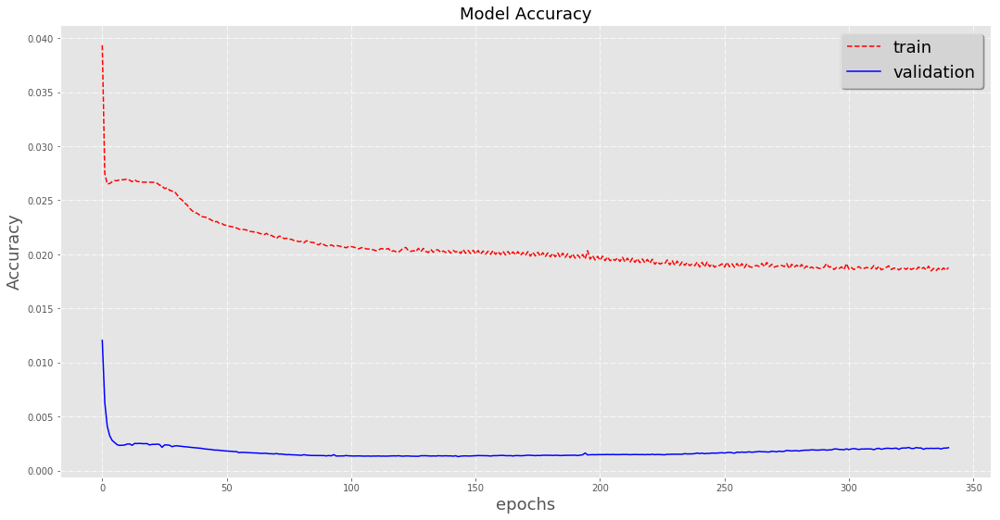


 Prediccion mes 3: 1061060

 mes: 4
Grafica Entrenamiento


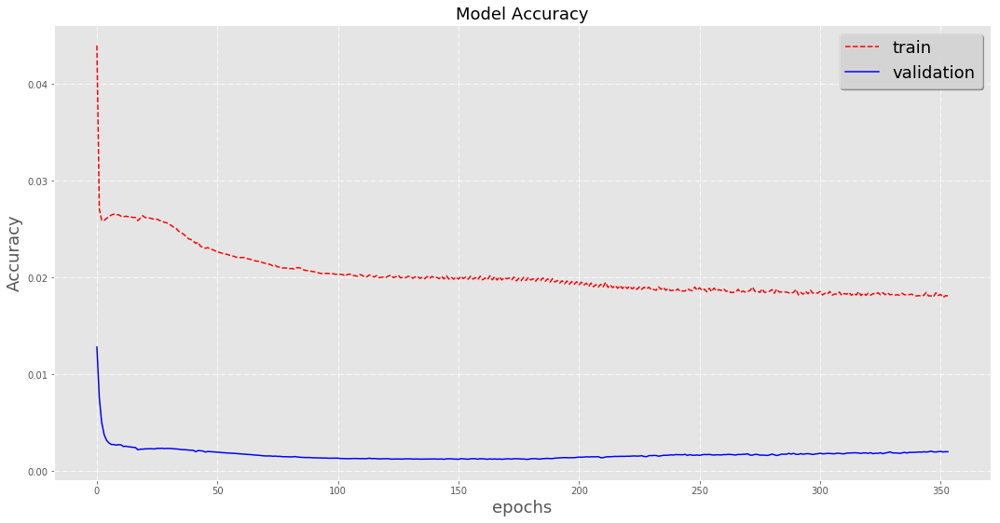


 Prediccion mes 4: 1057284

 mes: 5
Grafica Entrenamiento


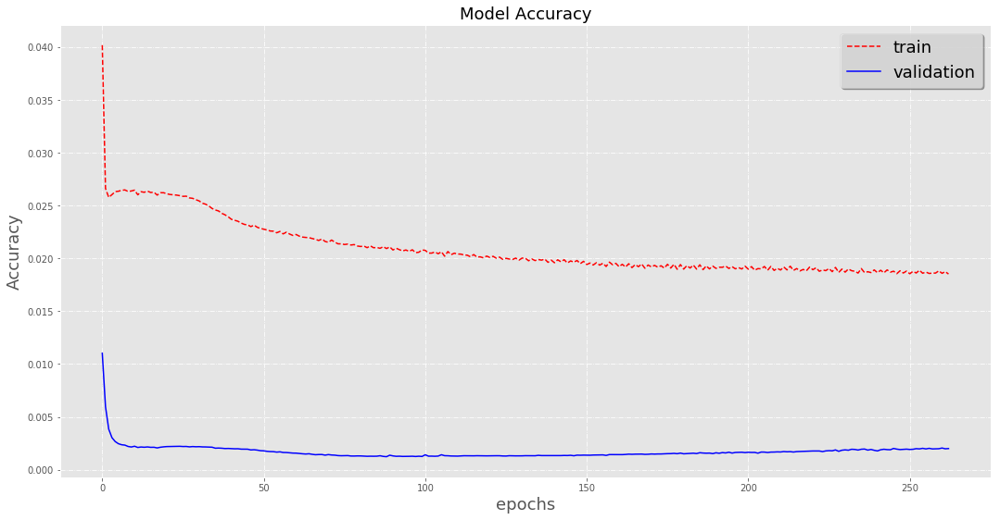


 Prediccion mes 5: 1042763

 mes: 6
Grafica Entrenamiento


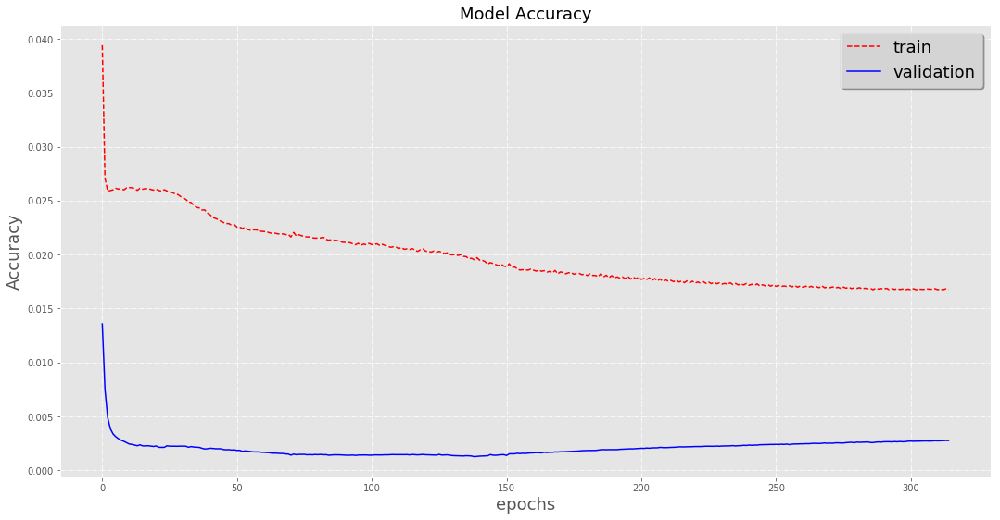


 Prediccion mes 6: 1050568

 mes: 7
Grafica Entrenamiento


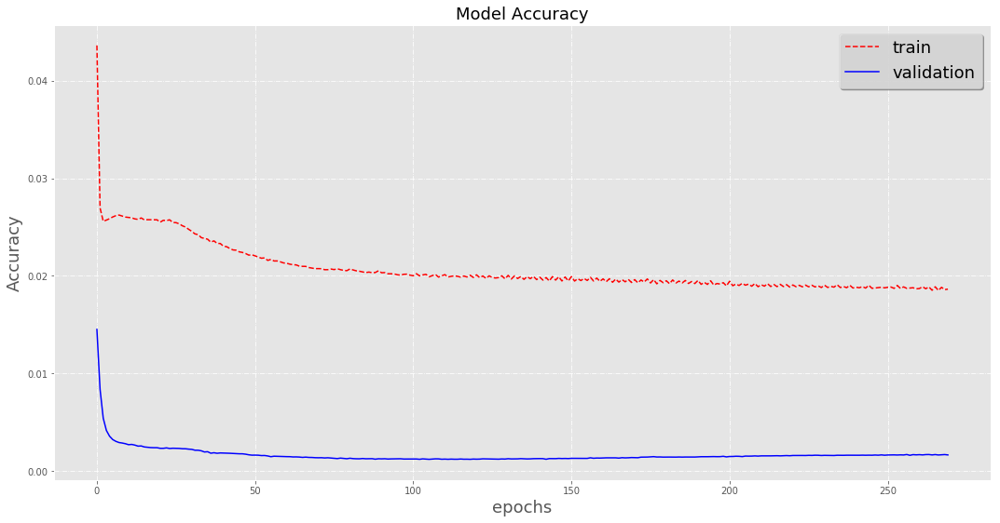


 Prediccion mes 7: 1016257

 mes: 8
Grafica Entrenamiento


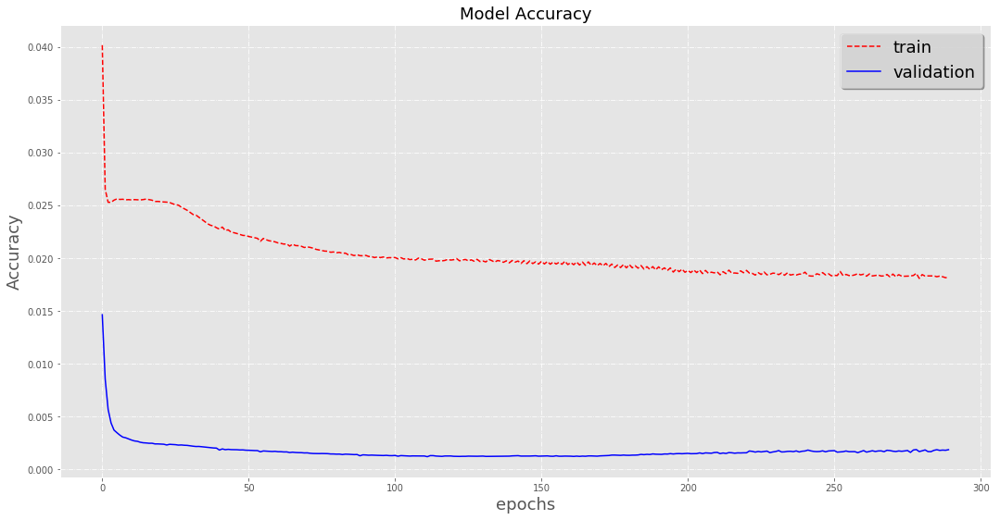


 Prediccion mes 8: 1044483

 mes: 9
Grafica Entrenamiento


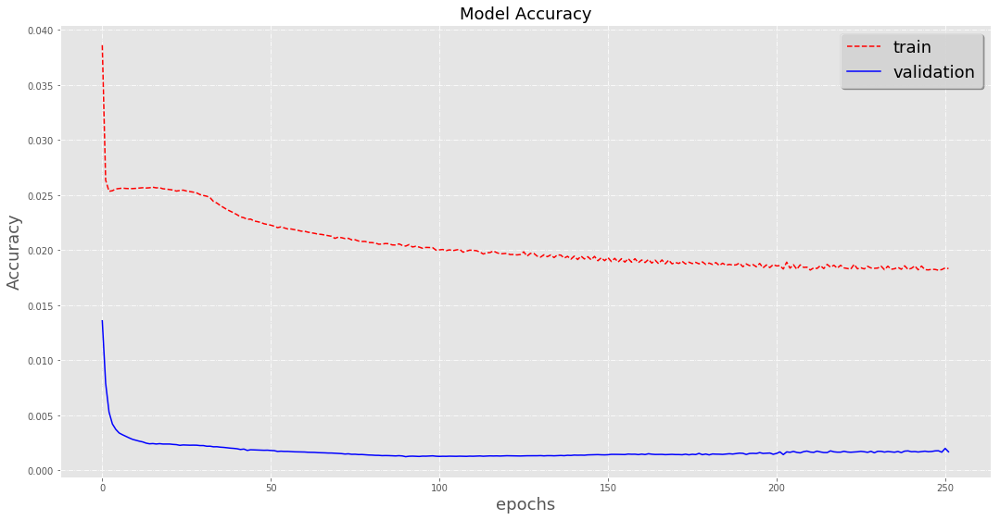


 Prediccion mes 9: 1069866

 mes: 10
Grafica Entrenamiento


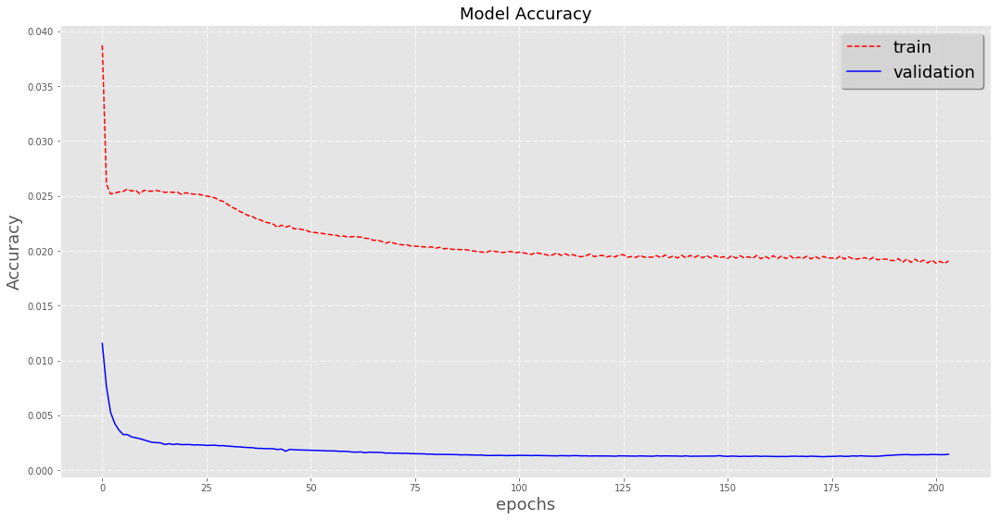


 Prediccion mes 10: 1056820

 mes: 11
Grafica Entrenamiento


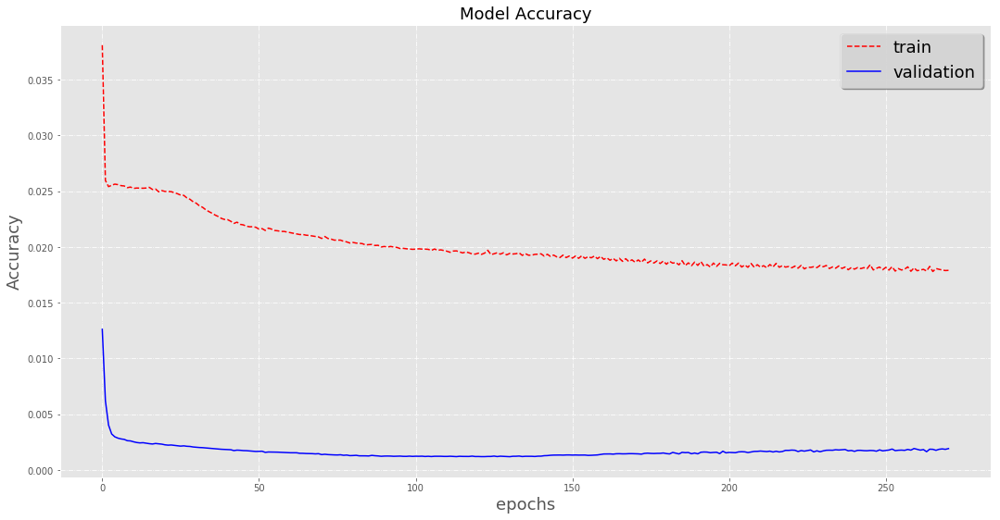


 Prediccion mes 11: 1045539

 mes: 12
Grafica Entrenamiento


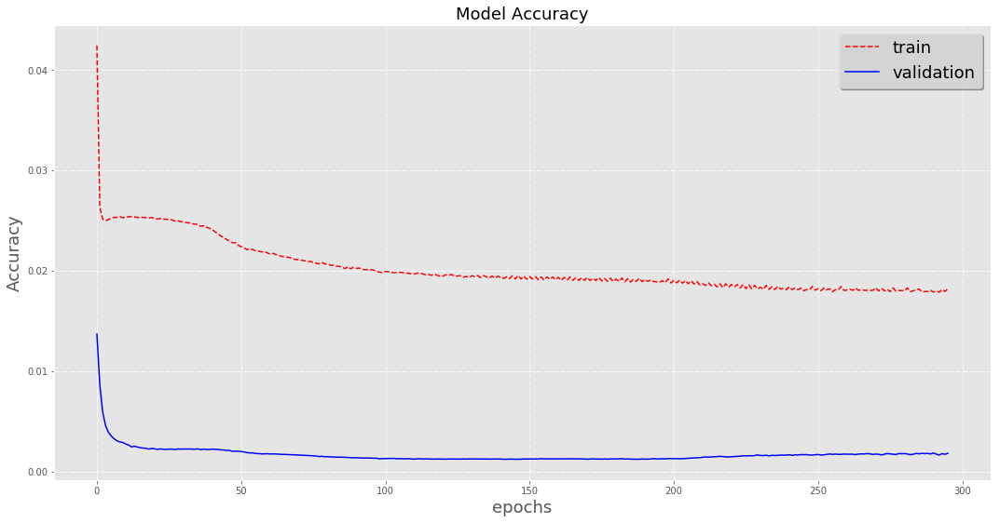


 Prediccion mes 12: 1049378

 Rmse:
[133806.3579059676, 131539.2823328799, 133041.54848197484, 124236.30352419367, 121647.35006617446, 121273.20942294614, 120921.05313950716, 114225.44920415529, 112582.91325304446, 116064.75348368617, 112893.40392605156, 113273.40859307839]

 Mape:
[10.191203506277462, 10.336490961258182, 10.135944077277768, 9.3925606165499, 9.287639435215505, 9.35904463963404, 9.236488681111199, 8.608541449158475, 8.434058896339002, 8.74516280501611, 8.55565982409462, 8.615418700494653]

 Smape:
[1.2005559072781014, 1.1871914918171274, 1.186196705498458, 1.1060900289507425, 1.084863813961006, 1.0799528705603452, 1.0783485021942856, 0.9995943415287645, 0.9819893707913875, 1.02612788287539, 0.9871135503994168, 0.9913787093146469]

 Repeticion: 13

 mes: 1
Grafica Entrenamiento


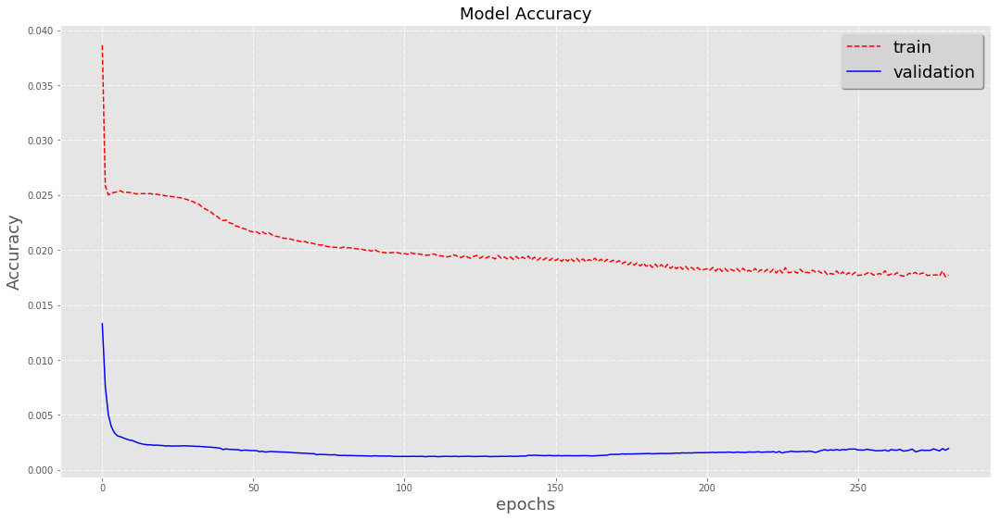


 Prediccion mes 1: 1058483

 mes: 2
Grafica Entrenamiento


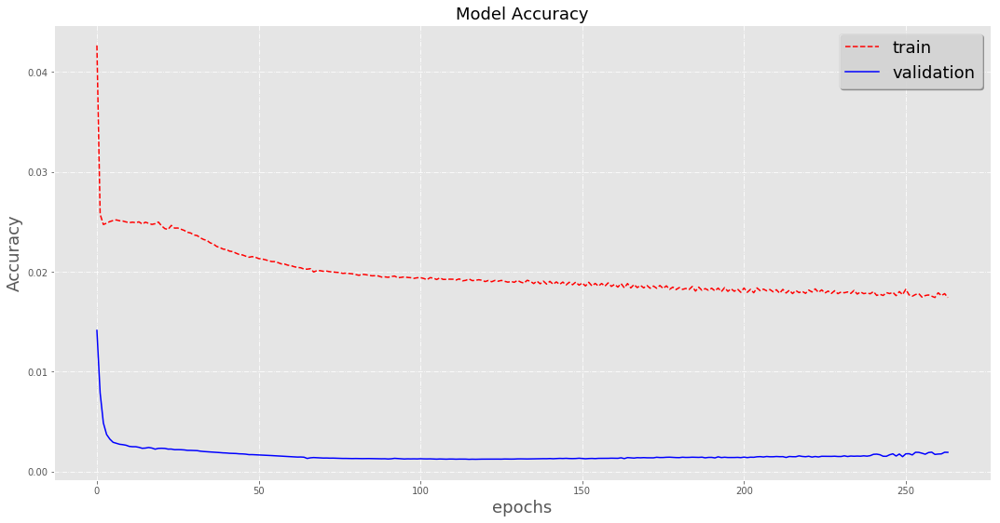


 Prediccion mes 2: 1068153

 mes: 3
Grafica Entrenamiento


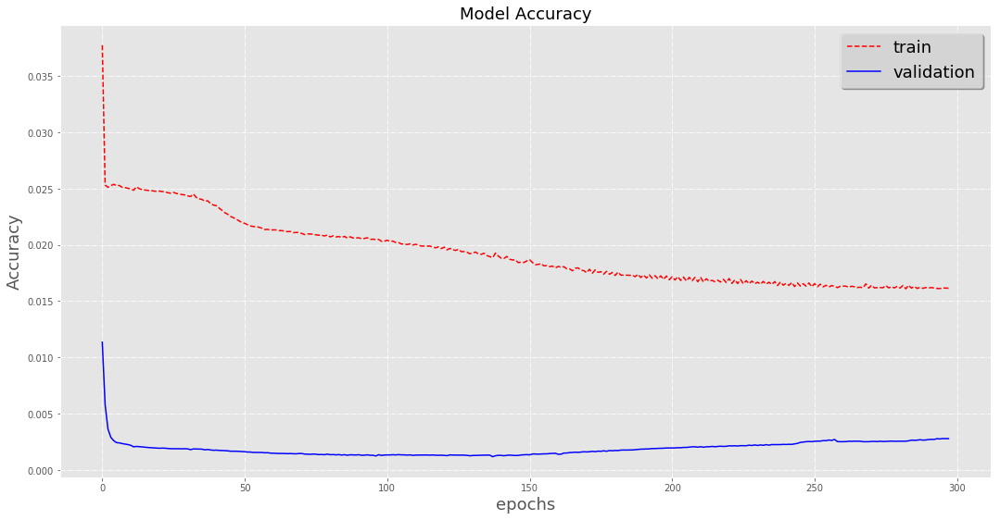


 Prediccion mes 3: 1054195

 mes: 4
Grafica Entrenamiento


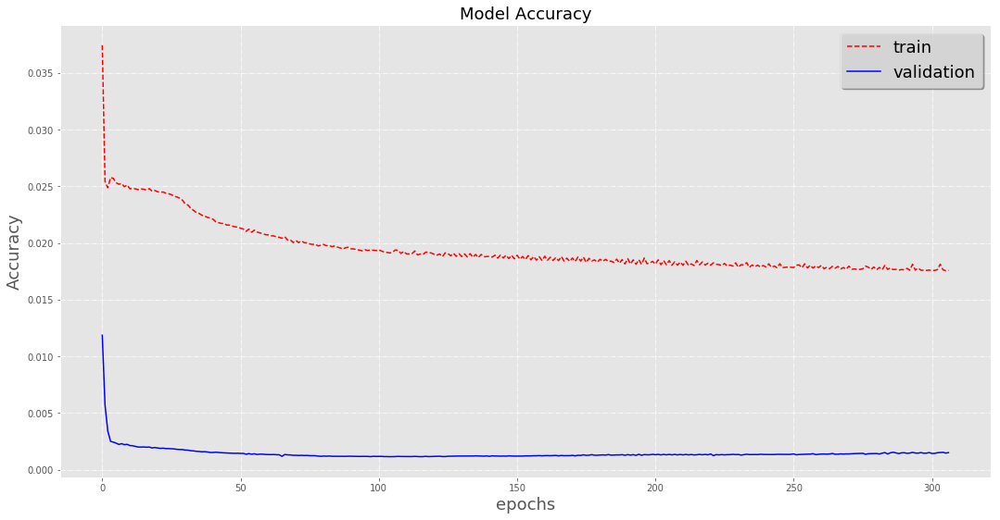


 Prediccion mes 4: 1058579

 mes: 5
Grafica Entrenamiento


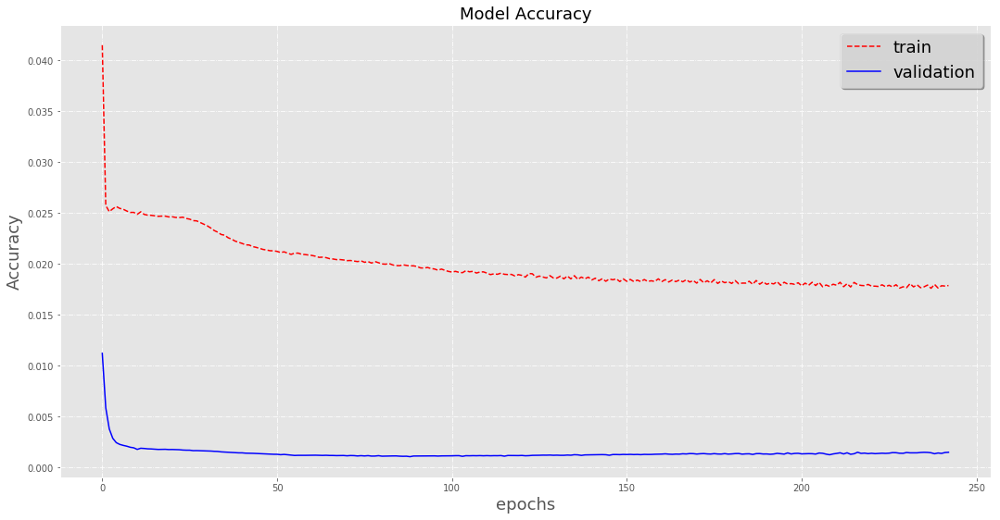


 Prediccion mes 5: 1048086

 mes: 6
Grafica Entrenamiento


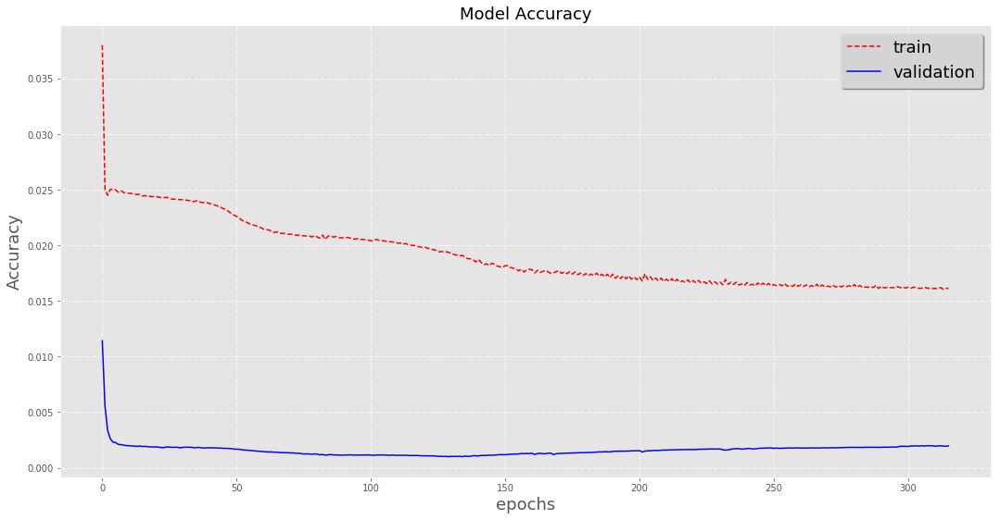


 Prediccion mes 6: 1051734

 mes: 7
Grafica Entrenamiento


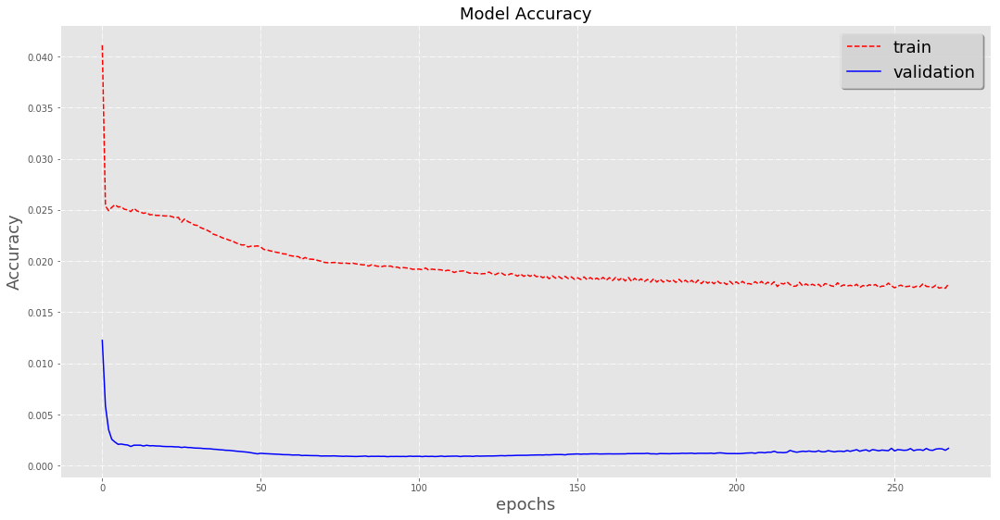


 Prediccion mes 7: 1004191

 mes: 8
Grafica Entrenamiento


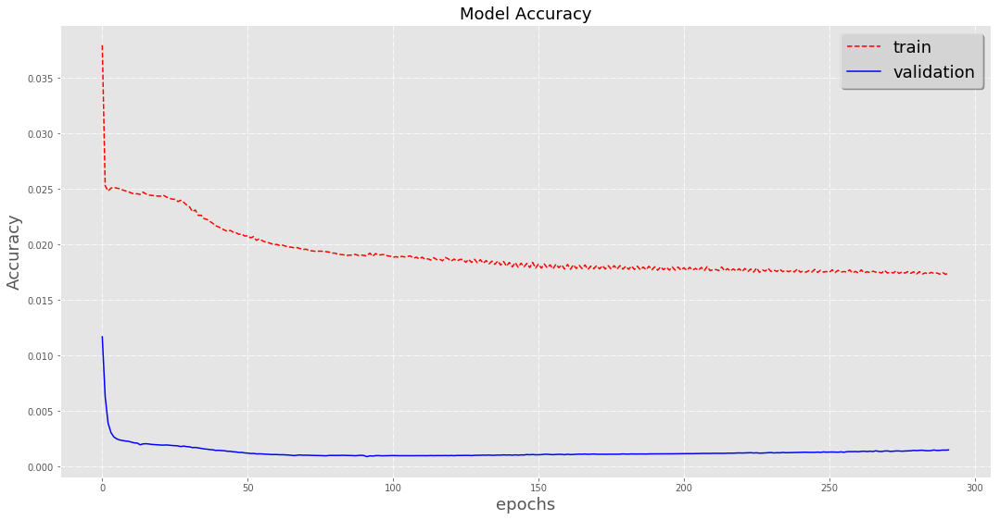


 Prediccion mes 8: 1031164

 mes: 9
Grafica Entrenamiento


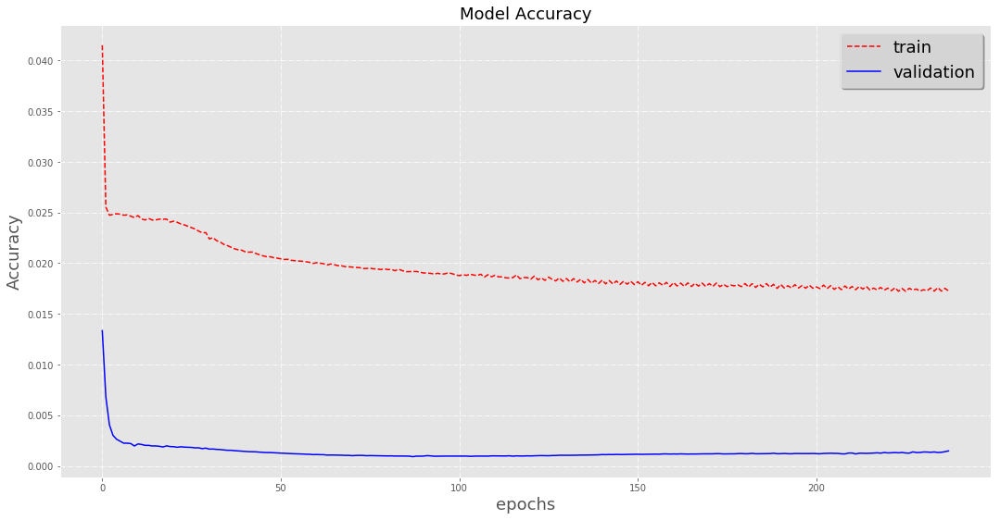


 Prediccion mes 9: 1064175

 mes: 10
Grafica Entrenamiento


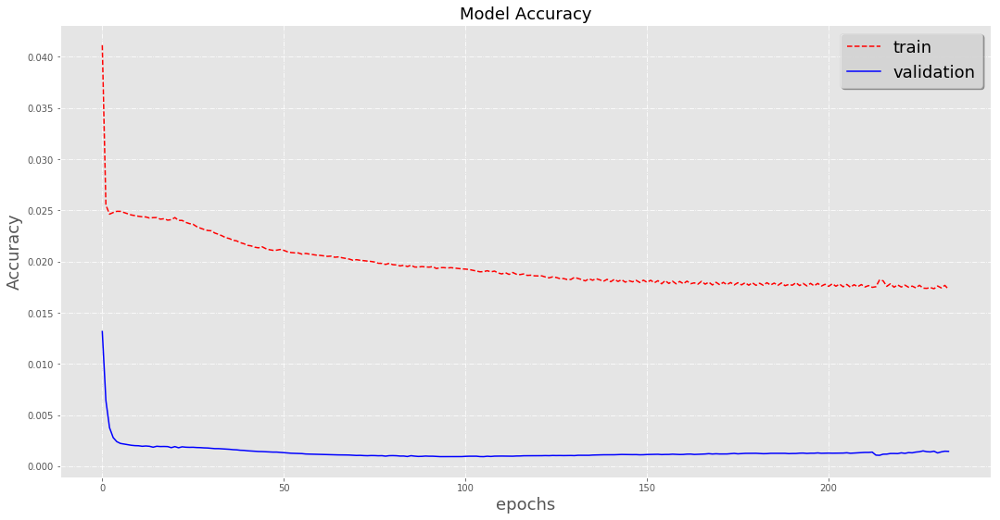


 Prediccion mes 10: 1051254

 mes: 11
Grafica Entrenamiento


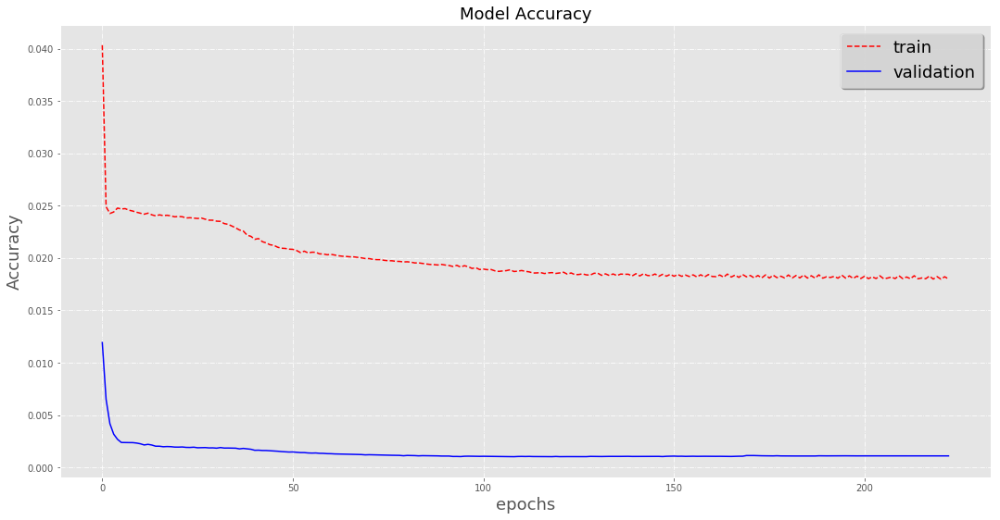


 Prediccion mes 11: 1053086

 mes: 12
Grafica Entrenamiento


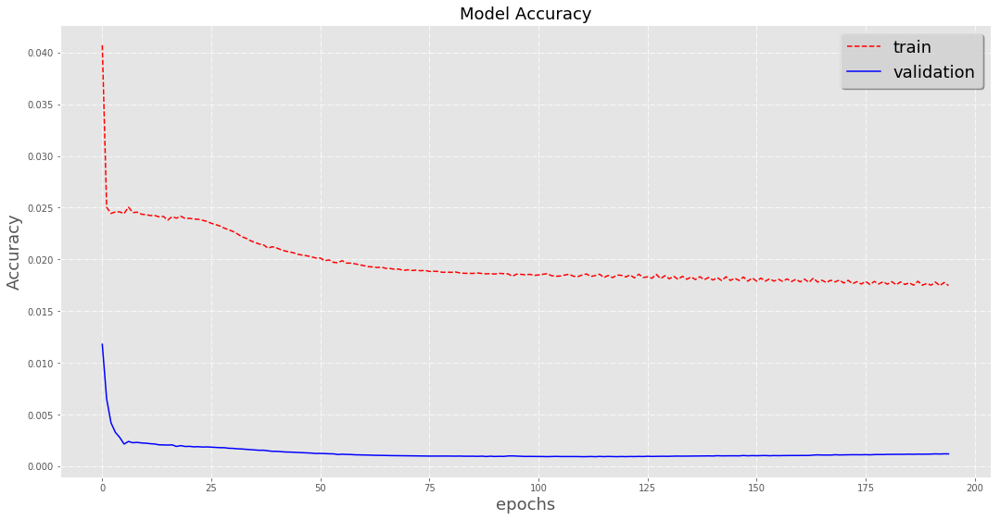


 Prediccion mes 12: 1049790

 Rmse:
[133806.3579059676, 131539.2823328799, 133041.54848197484, 124236.30352419367, 121647.35006617446, 121273.20942294614, 120921.05313950716, 114225.44920415529, 112582.91325304446, 116064.75348368617, 112893.40392605156, 113273.40859307839, 113333.99838668945]

 Mape:
[10.191203506277462, 10.336490961258182, 10.135944077277768, 9.3925606165499, 9.287639435215505, 9.35904463963404, 9.236488681111199, 8.608541449158475, 8.434058896339002, 8.74516280501611, 8.55565982409462, 8.615418700494653, 8.59003759084837]

 Smape:
[1.2005559072781014, 1.1871914918171274, 1.186196705498458, 1.1060900289507425, 1.084863813961006, 1.0799528705603452, 1.0783485021942856, 0.9995943415287645, 0.9819893707913875, 1.02612788287539, 0.9871135503994168, 0.9913787093146469, 0.991533021020125]

 Repeticion: 14

 mes: 1
Grafica Entrenamiento


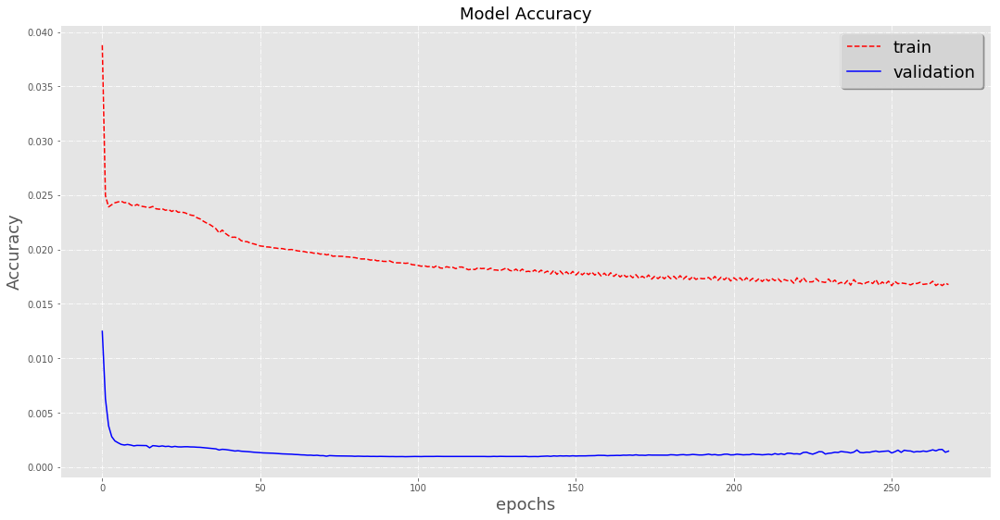


 Prediccion mes 1: 1060486

 mes: 2
Grafica Entrenamiento


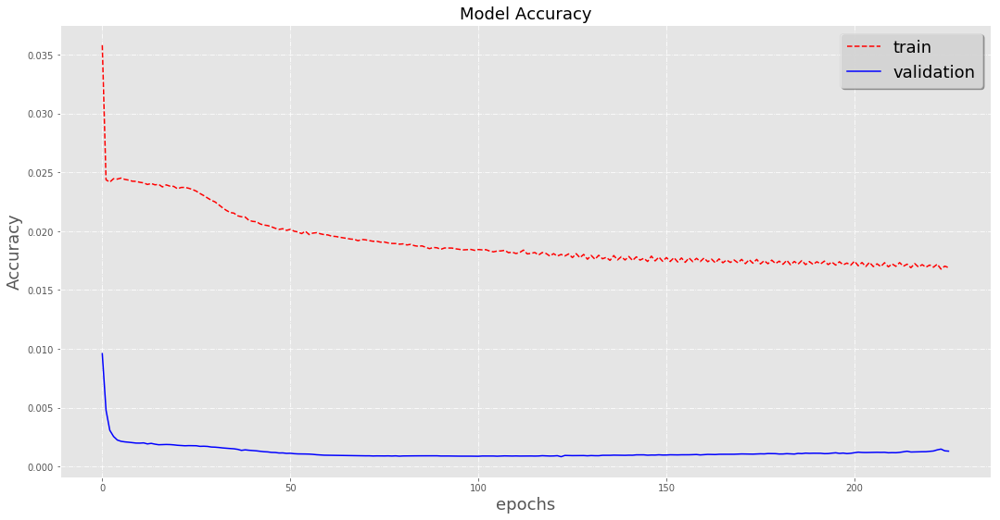


 Prediccion mes 2: 1067559

 mes: 3
Grafica Entrenamiento


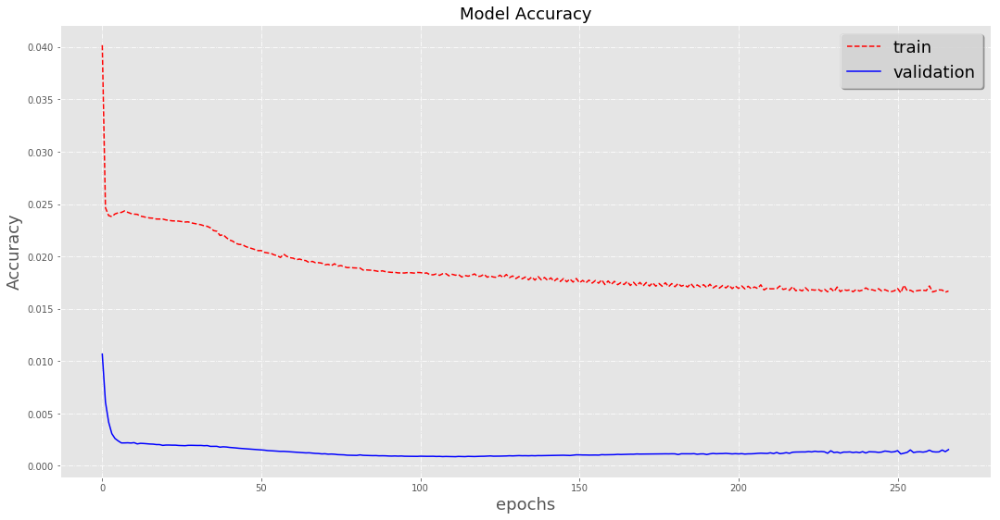


 Prediccion mes 3: 1057560

 mes: 4
Grafica Entrenamiento


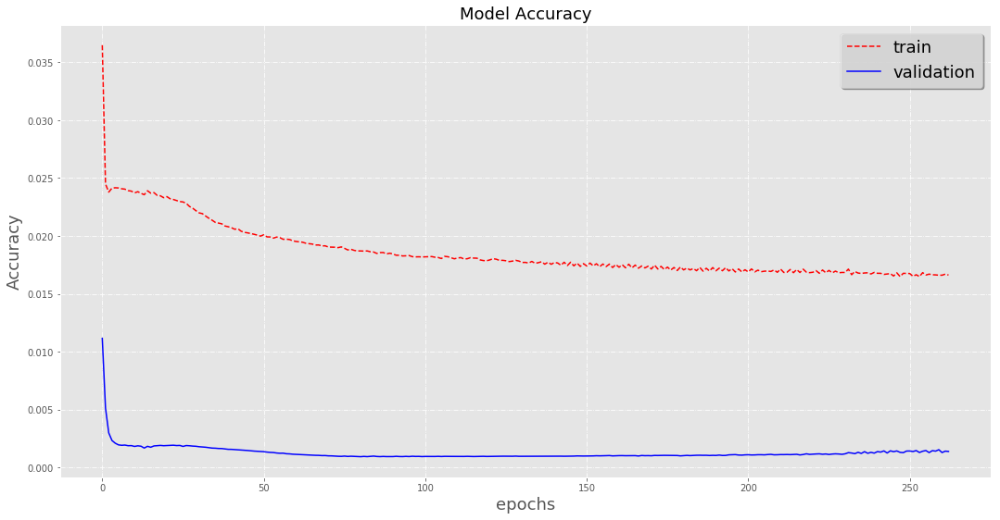


 Prediccion mes 4: 1046676

 mes: 5
Grafica Entrenamiento


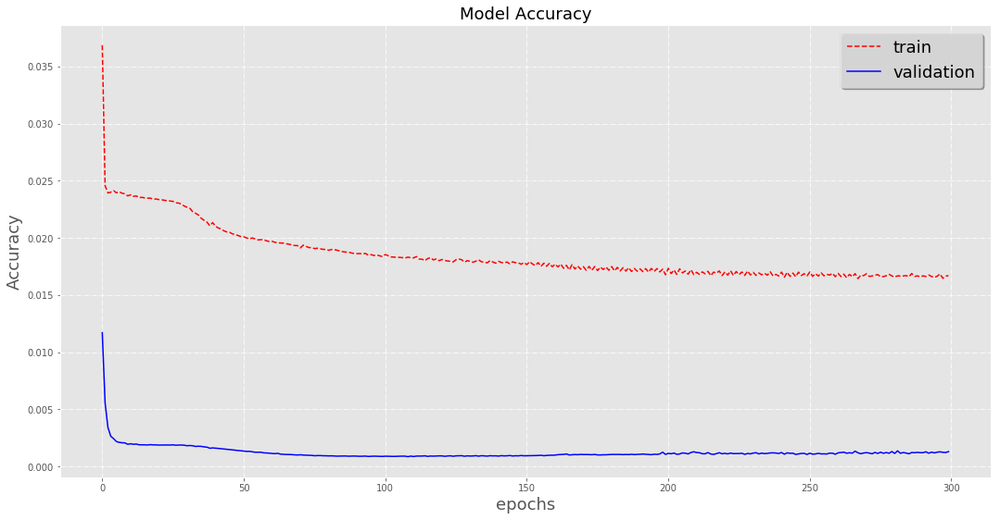


 Prediccion mes 5: 1044804

 mes: 6
Grafica Entrenamiento


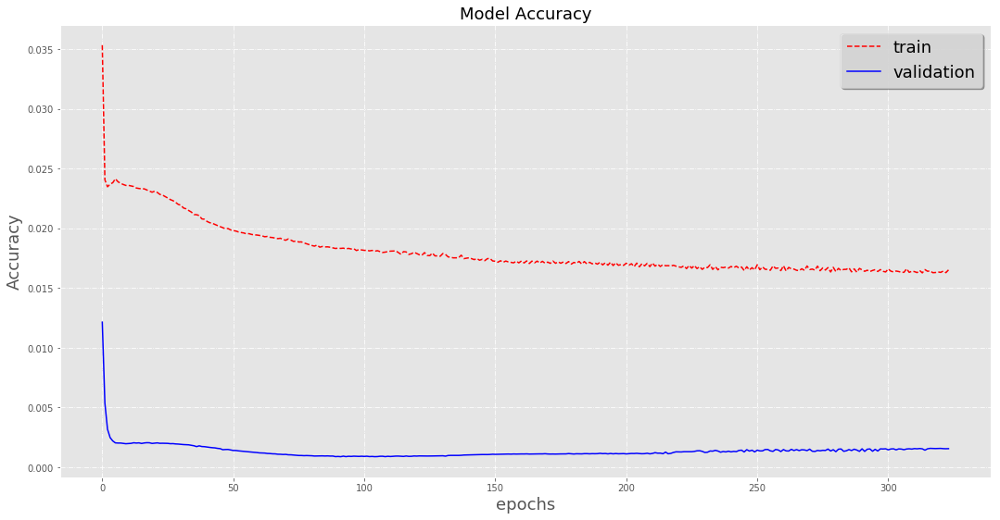


 Prediccion mes 6: 1004716

 mes: 7
Grafica Entrenamiento


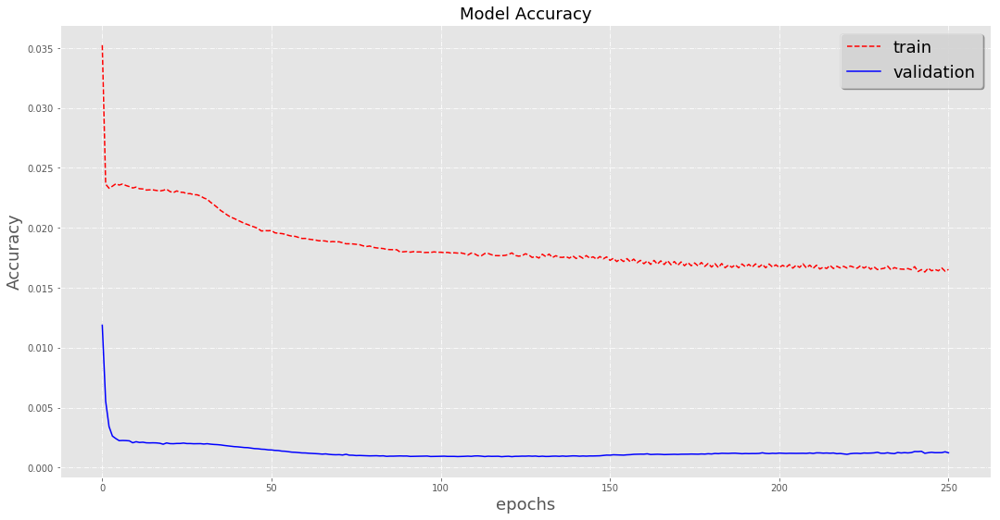


 Prediccion mes 7: 1022150

 mes: 8
Grafica Entrenamiento


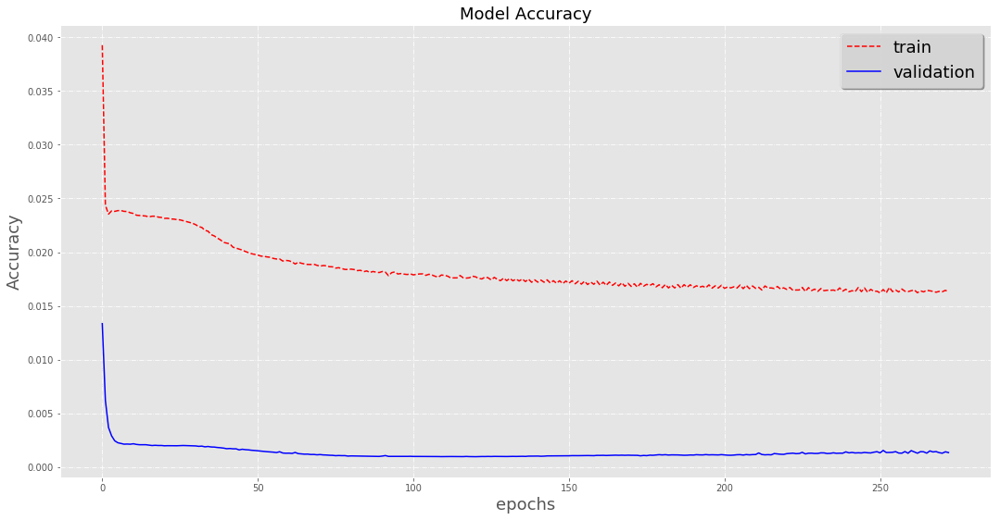


 Prediccion mes 8: 1036399

 mes: 9
Grafica Entrenamiento


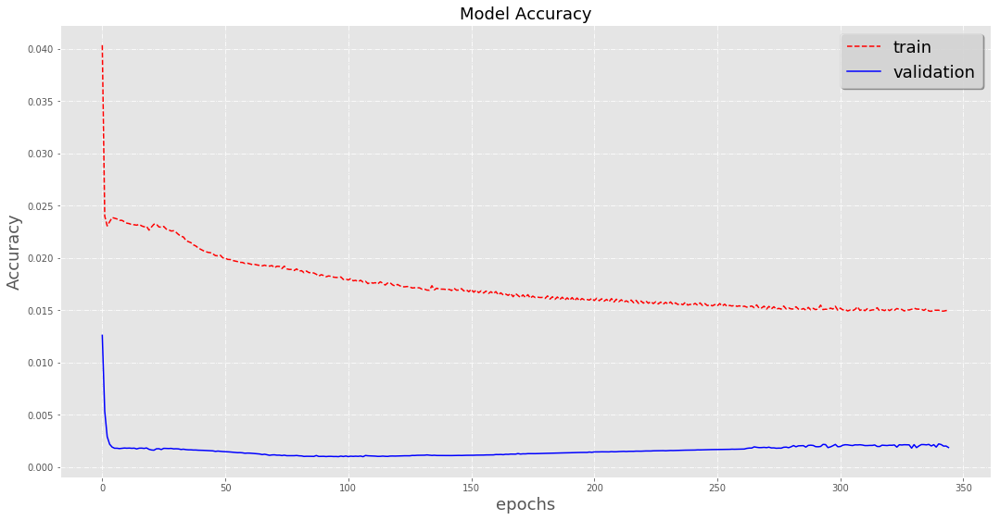


 Prediccion mes 9: 1046272

 mes: 10
Grafica Entrenamiento


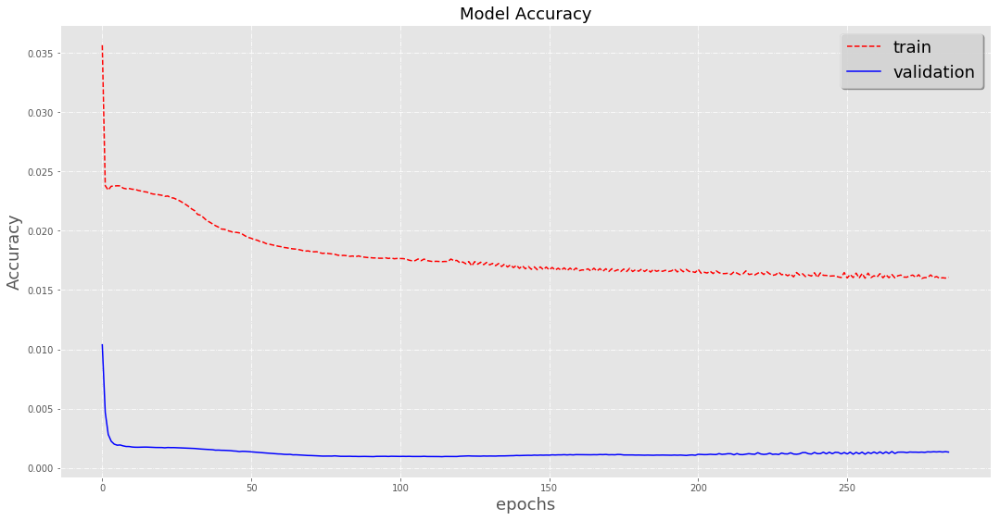


 Prediccion mes 10: 1056456

 mes: 11
Grafica Entrenamiento


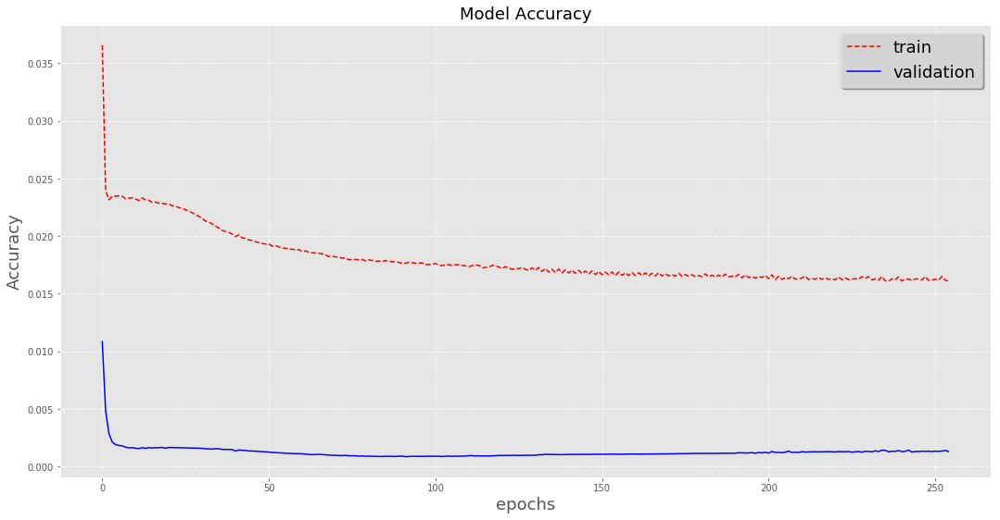


 Prediccion mes 11: 1049701

 mes: 12
Grafica Entrenamiento


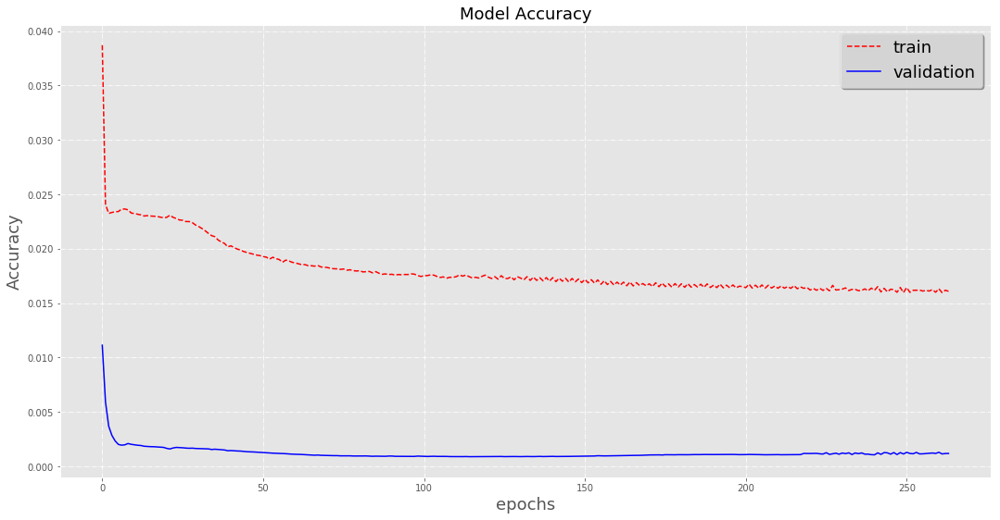


 Prediccion mes 12: 1042916

 Rmse:
[133806.3579059676, 131539.2823328799, 133041.54848197484, 124236.30352419367, 121647.35006617446, 121273.20942294614, 120921.05313950716, 114225.44920415529, 112582.91325304446, 116064.75348368617, 112893.40392605156, 113273.40859307839, 113333.99838668945, 113278.09237084423]

 Mape:
[10.191203506277462, 10.336490961258182, 10.135944077277768, 9.3925606165499, 9.287639435215505, 9.35904463963404, 9.236488681111199, 8.608541449158475, 8.434058896339002, 8.74516280501611, 8.55565982409462, 8.615418700494653, 8.59003759084837, 8.548935895093488]

 Smape:
[1.2005559072781014, 1.1871914918171274, 1.186196705498458, 1.1060900289507425, 1.084863813961006, 1.0799528705603452, 1.0783485021942856, 0.9995943415287645, 0.9819893707913875, 1.02612788287539, 0.9871135503994168, 0.9913787093146469, 0.991533021020125, 0.9912939806457635]

 Repeticion: 15

 mes: 1
Grafica Entrenamiento


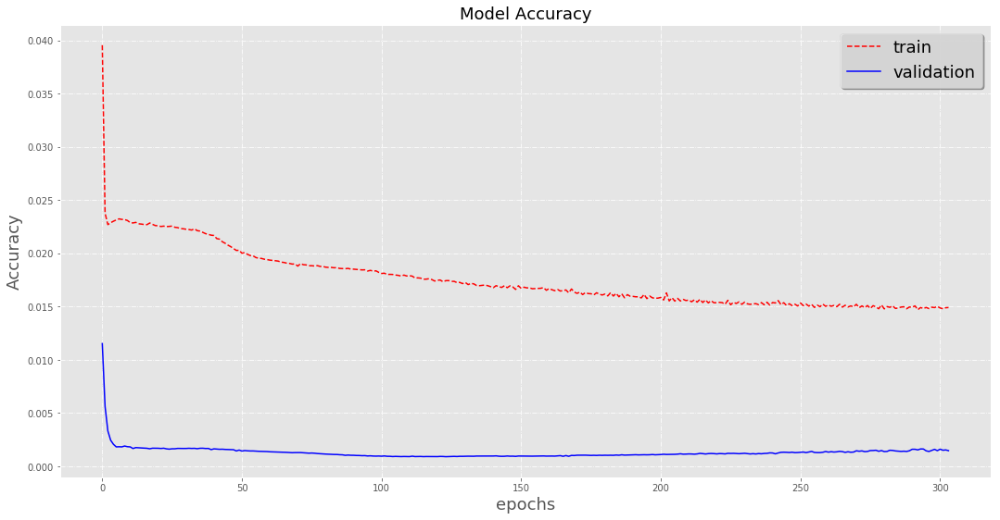


 Prediccion mes 1: 1042726

 mes: 2
Grafica Entrenamiento


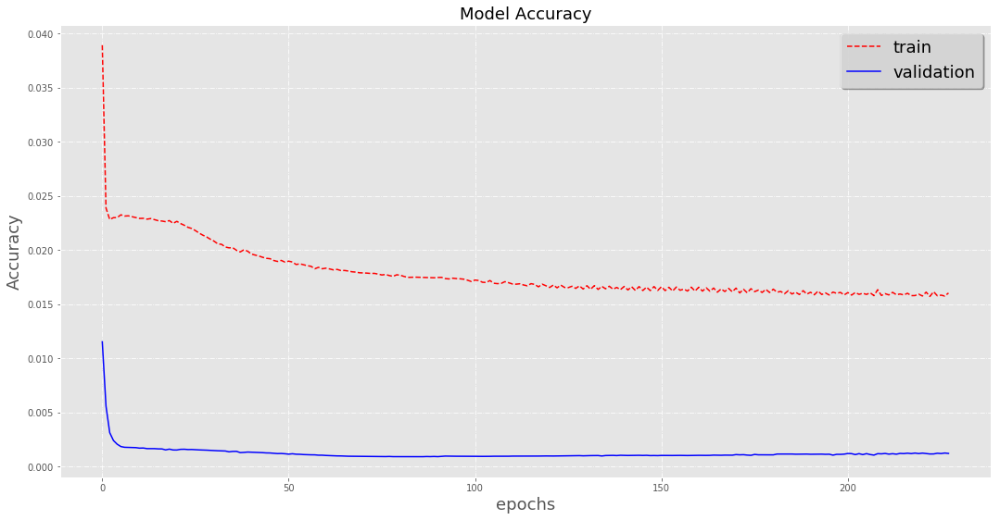


 Prediccion mes 2: 1060125

 mes: 3
Grafica Entrenamiento


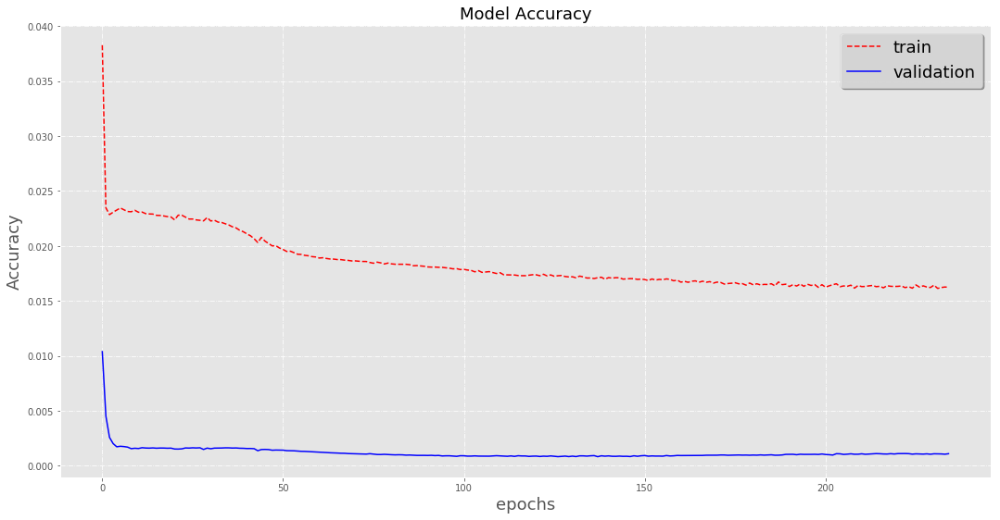


 Prediccion mes 3: 1055034

 mes: 4
Grafica Entrenamiento


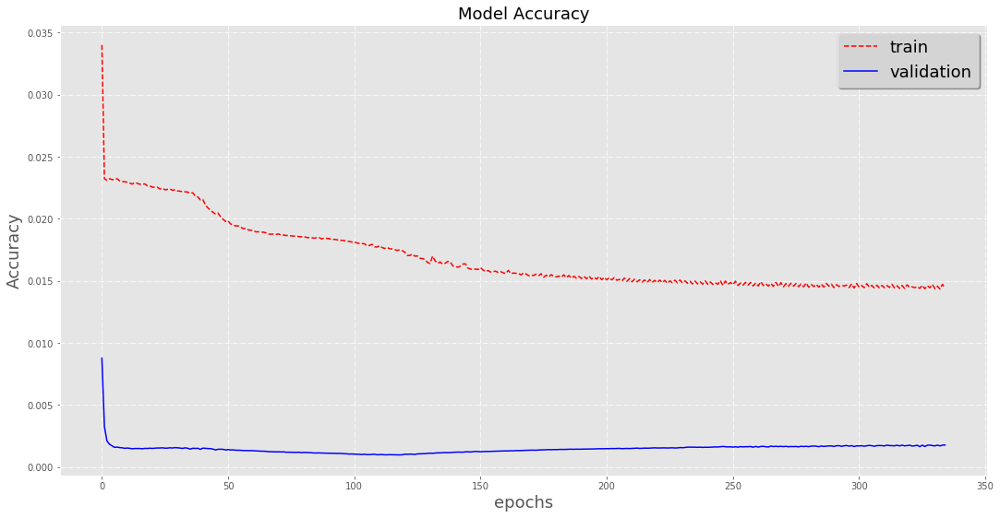


 Prediccion mes 4: 1042031

 mes: 5
Grafica Entrenamiento


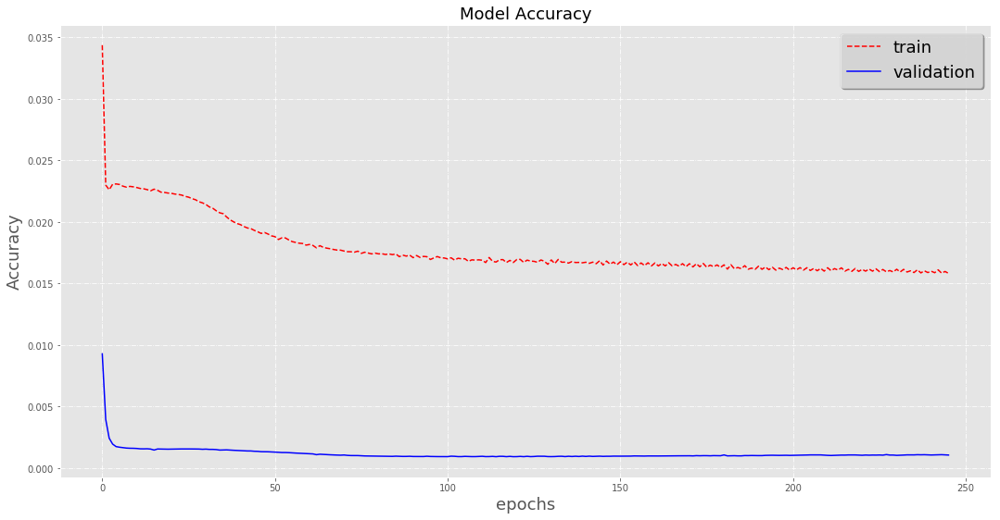


 Prediccion mes 5: 1039064

 mes: 6
Grafica Entrenamiento


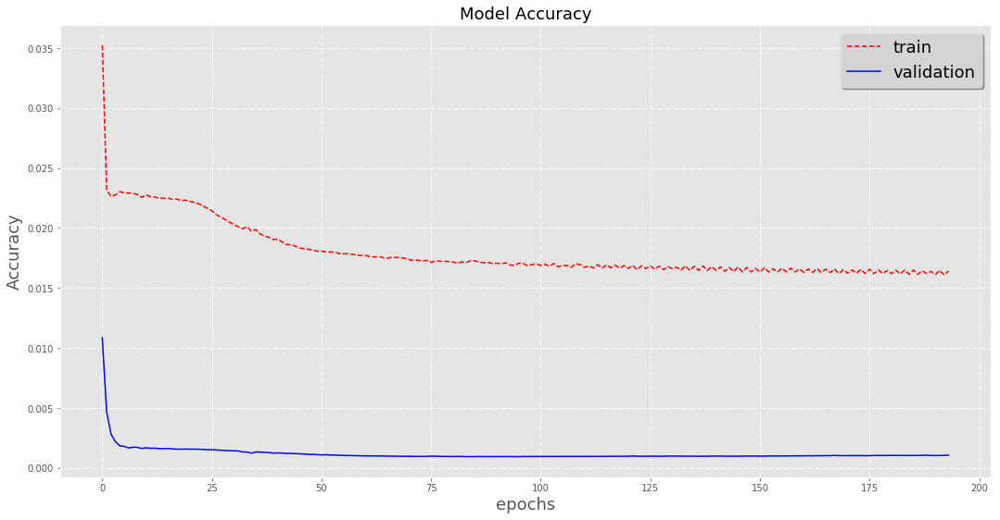


 Prediccion mes 6: 1011150

 mes: 7
Grafica Entrenamiento


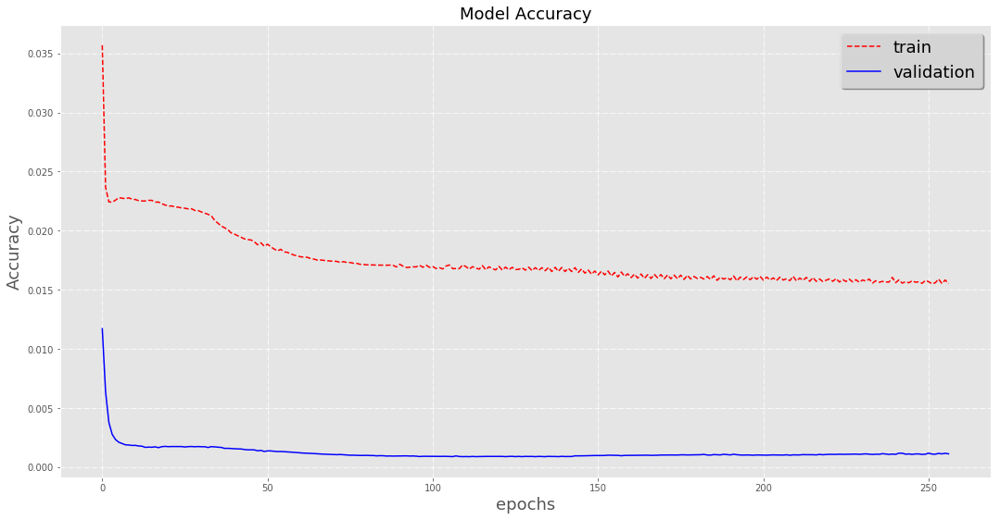


 Prediccion mes 7: 1019099

 mes: 8
Grafica Entrenamiento


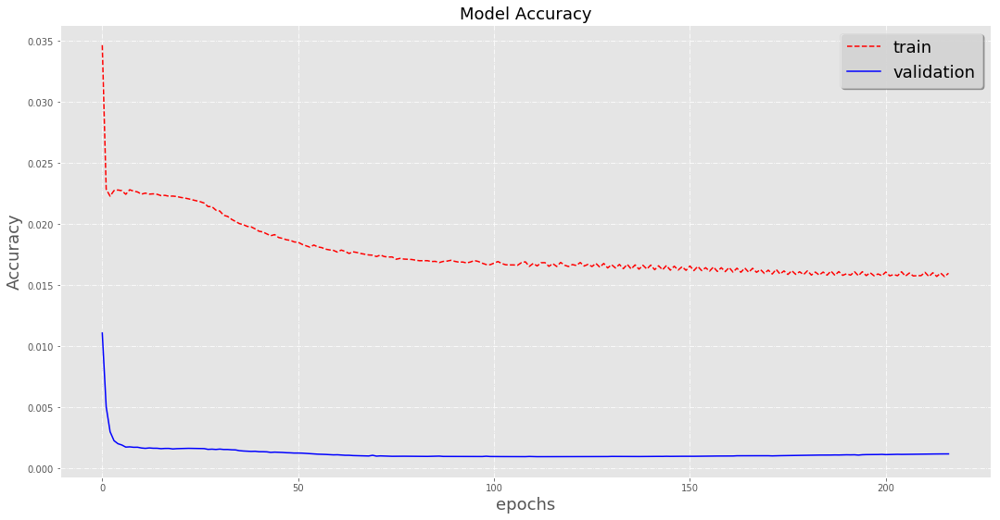


 Prediccion mes 8: 1045650

 mes: 9
Grafica Entrenamiento


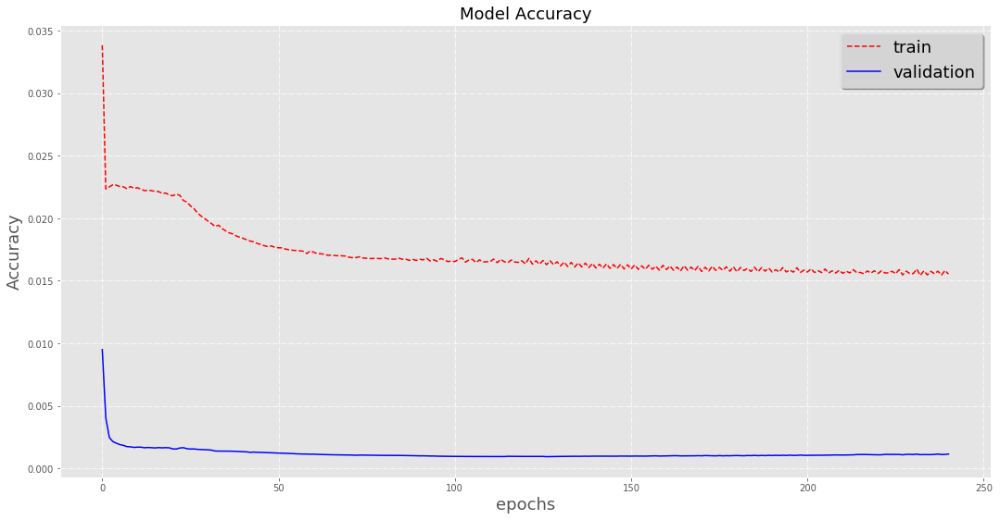


 Prediccion mes 9: 1052400

 mes: 10
Grafica Entrenamiento


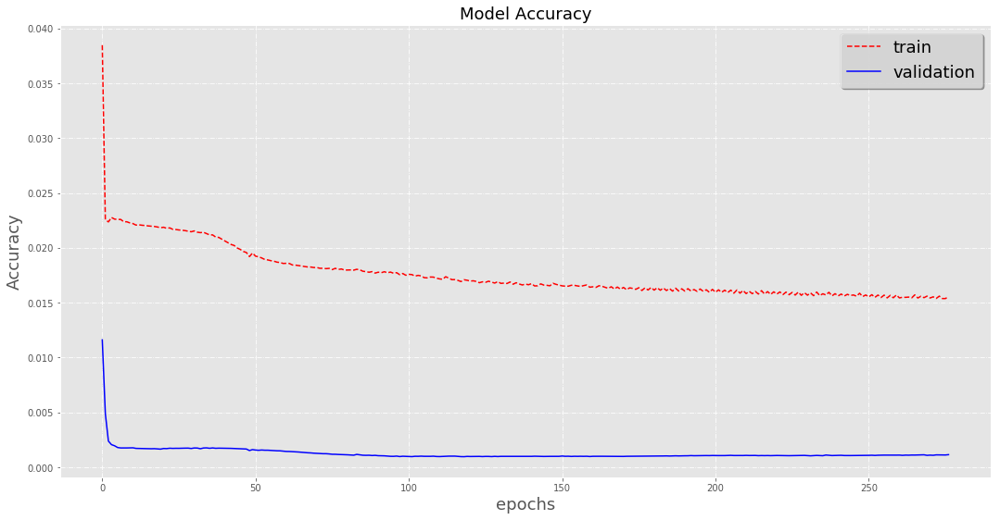


 Prediccion mes 10: 1044645

 mes: 11
Grafica Entrenamiento


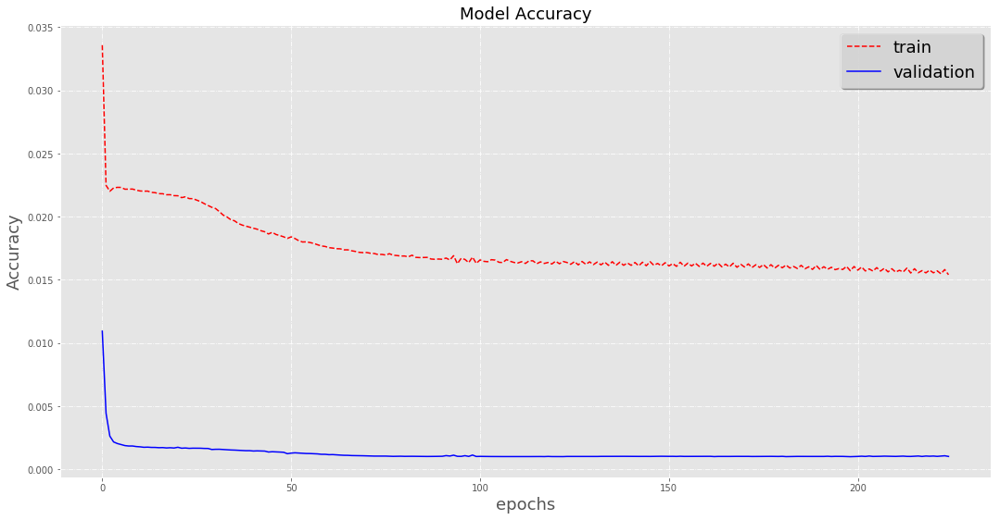


 Prediccion mes 11: 1038216

 mes: 12
Grafica Entrenamiento


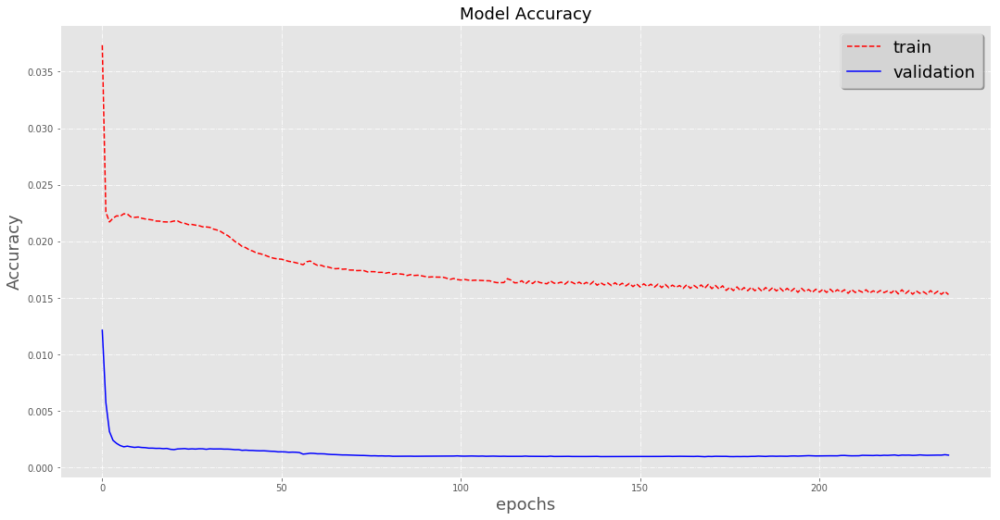


 Prediccion mes 12: 1031181

 Rmse:
[133806.3579059676, 131539.2823328799, 133041.54848197484, 124236.30352419367, 121647.35006617446, 121273.20942294614, 120921.05313950716, 114225.44920415529, 112582.91325304446, 116064.75348368617, 112893.40392605156, 113273.40859307839, 113333.99838668945, 113278.09237084423, 112967.42669949797]

 Mape:
[10.191203506277462, 10.336490961258182, 10.135944077277768, 9.3925606165499, 9.287639435215505, 9.35904463963404, 9.236488681111199, 8.608541449158475, 8.434058896339002, 8.74516280501611, 8.55565982409462, 8.615418700494653, 8.59003759084837, 8.548935895093488, 8.47678408058088]

 Smape:
[1.2005559072781014, 1.1871914918171274, 1.186196705498458, 1.1060900289507425, 1.084863813961006, 1.0799528705603452, 1.0783485021942856, 0.9995943415287645, 0.9819893707913875, 1.02612788287539, 0.9871135503994168, 0.9913787093146469, 0.991533021020125, 0.9912939806457635, 0.9870875180602289]
    Repeticion           RMSE       MAPE     SMAPE
0            1  13

In [10]:
numpy.random.seed(7)
startPronMLP=time.time()
#Data frame Errores
ErrorMLP = DataFrame()
mes,Rmse, Mape,Smape,Mase =list(), list(), list(),list(),list()

datosPronosticoMLP=DataFrame()
Pronostico=list()
Objetivo=list()
rep ,rep2, rep3=list(),list(),list()
mes3=list()
Pron3=list()
Obj3=list()


print(colored("\n Mejor LAG: %d"% (minLag),'red'))

temps = DataFrame(scaled_values[:-h])
dataframe = concat([temps.shift(minLag), temps], axis=1) 
dataframe.columns = ['t+%d'%(minLag), 't'] 
dataframe.dropna(inplace=True)

train= dataframe.values
#print(train)
print(train.shape)
Xpron, ypron = train[:,0:1], train[:,1]
Xpron = Xpron.reshape(Xpron.shape[0], 1)
ypron = ypron.reshape(ypron.shape[0], 1)

repeats=15

for _ in range(repeats):
    print(colored("\n Repeticion: %d"% (_+1),'green'))
    for j in range(h):
        
        print(colored("\n mes: %d"% (j+1),'red'))

        Pronostico_MLP=fit_MLP(Xpron,ypron,BestNeu)

        PredMLP= Pronostico_MLP.predict(Xpron)
        #print(len(PredMLP))

        Xpron=numpy.append(Xpron[:,0],temps.values[len(temps)-minLag+j])
        Xpron=Xpron.reshape(len(Xpron),timesteps)
        ypron=numpy.append(ypron,PredMLP[-1])


        PredMLP=PredMLP.reshape(len(PredMLP),1) 
        Pronosticos=scaler.inverse_transform(PredMLP)
        print(colored("\n Prediccion mes %d: %d"% ((j+1), Pronosticos[-1]) ,'blue'))
        
        Pronostico.append(Pronosticos[-1])
        Objetivo.append(series[len(temps)+j])
        mes.append(j+1)
        rep.append(_+1)
    
    Pronostico2=array(Pronostico)
    Objetivo2=array(Objetivo)

    Rmse.append(rmse(Objetivo2[:],Pronostico2[:]))
    print("\n Rmse:")
    print(Rmse)
    Mape.append(mape(Objetivo2[:],Pronostico2[:]))
    print("\n Mape:")
    print(Mape)
    Smape.append(smape(Objetivo2[:],Pronostico2[:]))
    print("\n Smape:")
    print(Smape)
    
    Pron3.append(Pronostico2)
    Obj3.append(Objetivo2)
    rep3.append(rep)
    mes3.append(mes)
    

    
    Pronostico=list()
    Objetivo=list()
    mes=list()
    rep=list()
    rep2.append(_+1)
    
      
ErrorMLP['Repeticion'],ErrorMLP['RMSE'], ErrorMLP['MAPE'], ErrorMLP['SMAPE'] = rep2, Rmse, Mape,Smape
#ErrorMLP['SMAPE'] =ErrorMLP['SMAPE']*100
print(ErrorMLP)
    
datosPronosticoMLP['Repeticion'],datosPronosticoMLP['Mes'],datosPronosticoMLP['Pronostico'],datosPronosticoMLP['Objetivo'] =rep3,mes3,Pron3,Obj3
#datosPronosticoMLP['Pronostico']= datosPronosticoMLP['Pronostico'].astype(float)

print(datosPronosticoMLP)




In [11]:

Rmse_pron=mean(ErrorMLP.RMSE)
Mape_pron=mean(ErrorMLP.MAPE)
Smape_pron=mean(ErrorMLP.SMAPE)

print(Rmse_pron)
print(Mape_pron)
print(Smape_pron)



119672.30338604607
9.100931410596644
1.0586211796597194


In [12]:
pronMean=mean(datosPronosticoMLP.Pronostico)

pronMean=pronMean.astype(float)
print(pronMean[:])

[[1073460.125 ]
 [1043986.3125]
 [1051248.375 ]
 [1064547.5   ]
 [1054582.5   ]
 [1030473.75  ]
 [ 947527.1875]
 [1051181.25  ]
 [1051002.875 ]
 [1067880.625 ]
 [1061305.5   ]
 [1054745.125 ]]


# Grafica Modelo + Pronostico

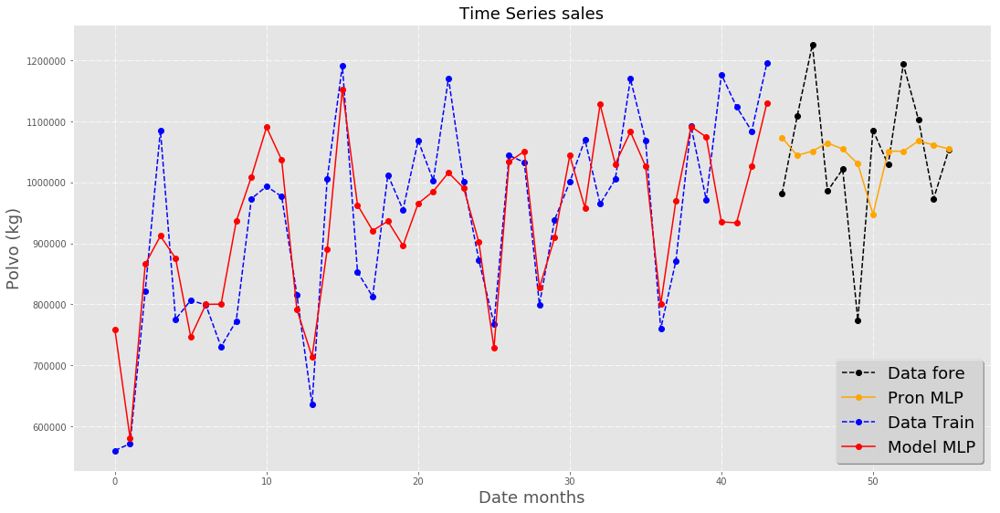

In [13]:
# Grafica
pyplot.figure(figsize = (18,9))
pyplot.plot([None for i in series.values[minLag:-h]]+[x for x in series.values[-h:]],'o--',c='black', label='Data fore')
pyplot.plot([None for i in series.values[minLag:-h]] + [x for x in pronMean],'o-',c='orange', label='Pron MLP')
pyplot.plot(series.values[minLag:-h],'o--',c='b', label='Data Train')
pyplot.plot(MejorModeloMLP.Predicciones.values,'o-',c='r', label='Model MLP')


pyplot.xlabel('Date months',fontsize=18)
pyplot.ylabel('Polvo (kg)',fontsize=18)
pyplot.title('Time Series sales',fontsize=18)
pyplot.grid(True,linestyle='-.')
leg=pyplot.legend(loc="best",fontsize=18, shadow=True, fancybox=True)
leg.get_frame().set_alpha(0.8)
pyplot.show()




In [14]:

endPronMLP=time.time()
TimePronMLP=startPronMLP-endPronMLP
ErrorMLP['Tiempo']=TimePronMLP


print(ErrorMLP)


    Repeticion           RMSE       MAPE     SMAPE        Tiempo
0            1  133806.357906  10.191204  1.200556 -70874.802601
1            2  131539.282333  10.336491  1.187191 -70874.802601
2            3  133041.548482  10.135944  1.186197 -70874.802601
3            4  124236.303524   9.392561  1.106090 -70874.802601
4            5  121647.350066   9.287639  1.084864 -70874.802601
5            6  121273.209423   9.359045  1.079953 -70874.802601
6            7  120921.053140   9.236489  1.078349 -70874.802601
7            8  114225.449204   8.608541  0.999594 -70874.802601
8            9  112582.913253   8.434059  0.981989 -70874.802601
9           10  116064.753484   8.745163  1.026128 -70874.802601
10          11  112893.403926   8.555660  0.987114 -70874.802601
11          12  113273.408593   8.615419  0.991379 -70874.802601
12          13  113333.998387   8.590038  0.991533 -70874.802601
13          14  113278.092371   8.548936  0.991294 -70874.802601
14          15  112967.42

In [15]:
# Create a Pandas Excel writer using XlsxWriter as the engine.
writer = pandas.ExcelWriter('MLPTotal.xlsx', engine='xlsxwriter')

# Convert the dataframe to an XlsxWriter Excel object.
datosModelMLP.to_excel(writer, sheet_name='ModelosMLP')
MejorModeloMLP.to_excel(writer, sheet_name='Best_ModelMLP')

ErrorModMLP.to_excel(writer, sheet_name='ErroresModelMLP')
BestModelMLP.to_excel(writer, sheet_name='MejorModelo')
datosPronosticoMLP.to_excel(writer, sheet_name='PronosticoMLP')
ErrorMLP.to_excel(writer, sheet_name='ErrorPronosticoMLP')


# Get the xlsxwriter objects from the dataframe writer object.
workbook  = writer.book
worksheet = writer.sheets['ModelosMLP']
worksheet = writer.sheets['Best_ModelMLP']
worksheet = writer.sheets['ErroresModelMLP']
worksheet = writer.sheets['MejorModelo']
worksheet = writer.sheets['PronosticoMLP']
worksheet = writer.sheets['ErrorPronosticoMLP']





In [16]:
print(colored("\n \n Neuronas %d"%  neurons ,'blue'))


print(colored('\n \n Modelo','blue'))

print(colored('\n \n Mejor Modelo','blue'))
print(BestModelMLP)
print(colored('\n \n Error Pronostico','green'))
print(ErrorMLP)

print(colored('\n \n Errores Promedio','yellow'))
print(Rmse_pron)
print(Mape_pron)
print(Smape_pron)


 
 Neuronas 200

 
 Modelo

 
 Mejor Modelo
           MinimoError   MaximoError    Tiempo
Lag          12.000000     12.000000 -22.90748
Neuronas    200.000000    200.000000 -22.90748
RMSE      95340.937500  95340.937500 -22.90748
MAPE          8.258995      8.258995 -22.90748
SMAPE         0.081496      0.081496 -22.90748

 
 Error Pronostico
    Repeticion           RMSE       MAPE     SMAPE        Tiempo
0            1  133806.357906  10.191204  1.200556 -70874.802601
1            2  131539.282333  10.336491  1.187191 -70874.802601
2            3  133041.548482  10.135944  1.186197 -70874.802601
3            4  124236.303524   9.392561  1.106090 -70874.802601
4            5  121647.350066   9.287639  1.084864 -70874.802601
5            6  121273.209423   9.359045  1.079953 -70874.802601
6            7  120921.053140   9.236489  1.078349 -70874.802601
7            8  114225.449204   8.608541  0.999594 -70874.802601
8            9  112582.913253   8.434059  0.981989 -70874.802601
9 